<a href="https://colab.research.google.com/github/BrainConnection/Quantum_Algorithm/blob/main/7.%205Q%20TFIM%20VQNHE%20CNN%20QEM%20ZZ%20Crosstalk%203%204%205%2015%2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [1]:
!pip install qiskit
!pip install qiskit-ibm-runtime
!pip install qiskit[visualization]
!pip install qiskit-algorithms
!pip install qiskit-aer

!pip install scipy
!pip install matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 34.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 33.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.0/318.0 kB 30.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 7.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   

In [2]:
from functools import cache

from qiskit_ibm_runtime import QiskitRuntimeService, Estimator, Options

# Save an IBM Quantum account and set it as your default account.
QiskitRuntimeService.save_account(channel="ibm_quantum",
                                  token="067e5c82606f0a1157dd554e2087d6b7a9b823dbaa4ad47b95c3337eab2e6cd9361719cc0470f4a98d1631b73b264a82577012a0b8ff32963d5964e6cc12c525",
                                  set_as_default=True,
                                  overwrite=True)

service = QiskitRuntimeService()
backend = service.backend("ibmq_qasm_simulator")

# Hamiltonian Diagonalization

$$ H = Σ Z_j Z_{j+1} - Σ X_j  $$

1D 5 Qubit System

In [3]:
from qiskit.quantum_info import SparsePauliOp
import numpy as np
import matplotlib.pyplot as plt

In [4]:
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)
hamiltonian_matrix = hamiltonian.to_matrix()

eigenvalue, eigenvector = np.linalg.eig(hamiltonian_matrix)

lowest_energy = np.min(eigenvalue)

np.real(lowest_energy)

-6.026674183332294

# 8. CNN Estimation - ZZ Crosstalk (CUSCO 3 4 5 15 22)

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 1MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 1MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.001                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23201064 5.13798936]
[10.16026046 10.37001454  9.97059499]
1.4542737942768724e-05
[5.13800667 4.98799333]
[ 9.97058713 10.12601724  9.66844563]
1.723952758059255e-05
[4.98796301 5.01503699]
[ 9.97058904 10.15301562  9.72300535]
0.15001561507571637
[5.01499625 5.28200375]
[ 9.72300652 10.29705895 10.26094454]
5.8948757417631725e-05


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(7.271368971384362e-06,
 8.619763790296275e-06,
 0.07500780753785818,
 2.9474378708815863e-05)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

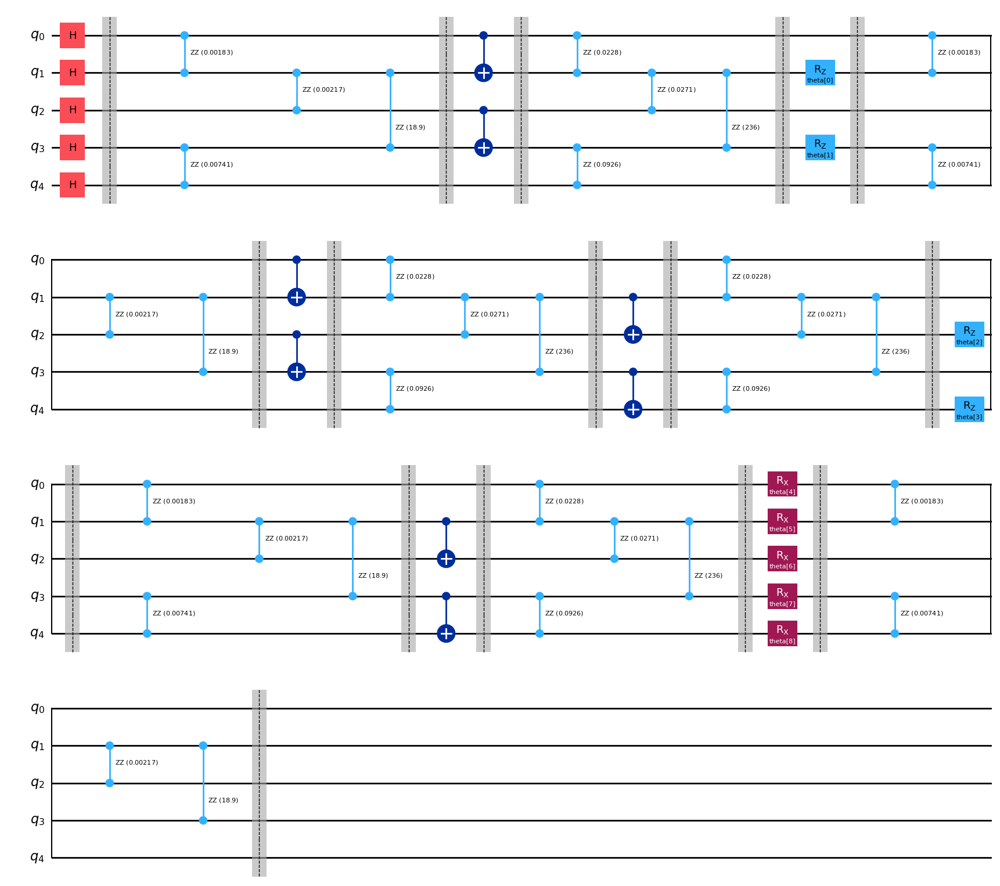

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

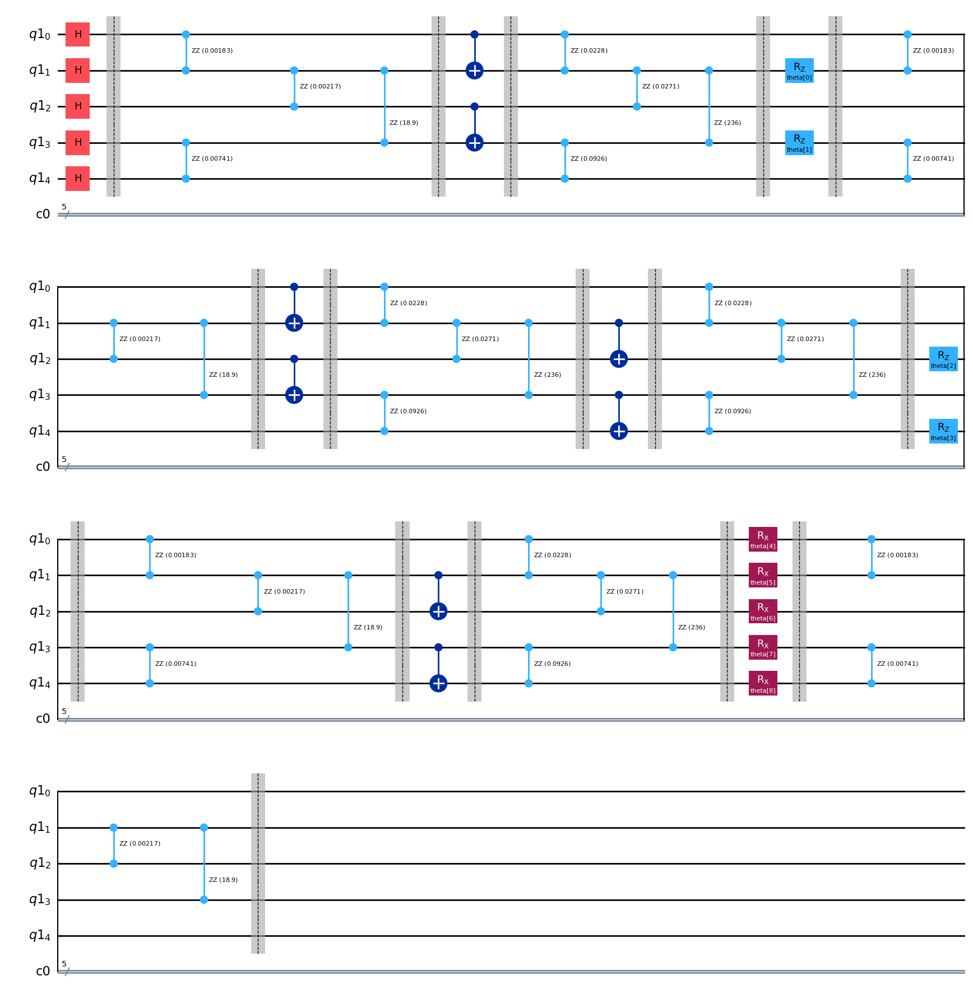

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

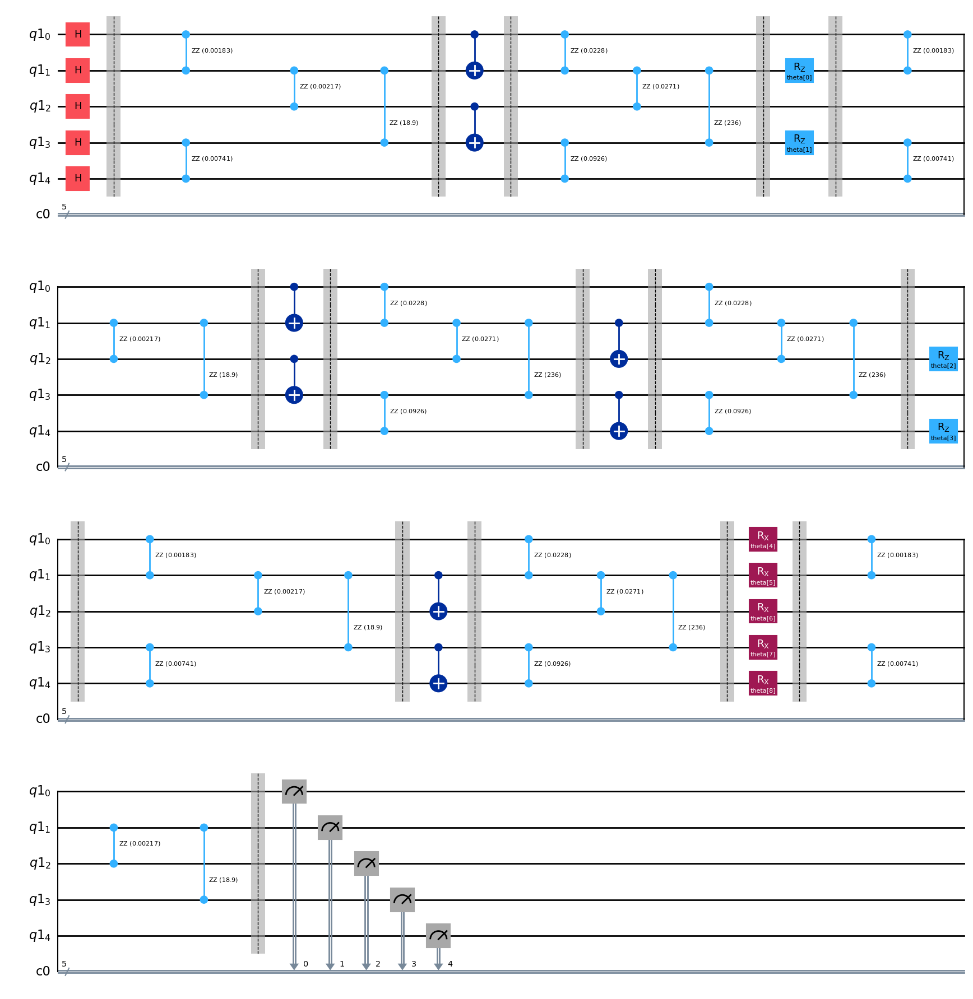

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

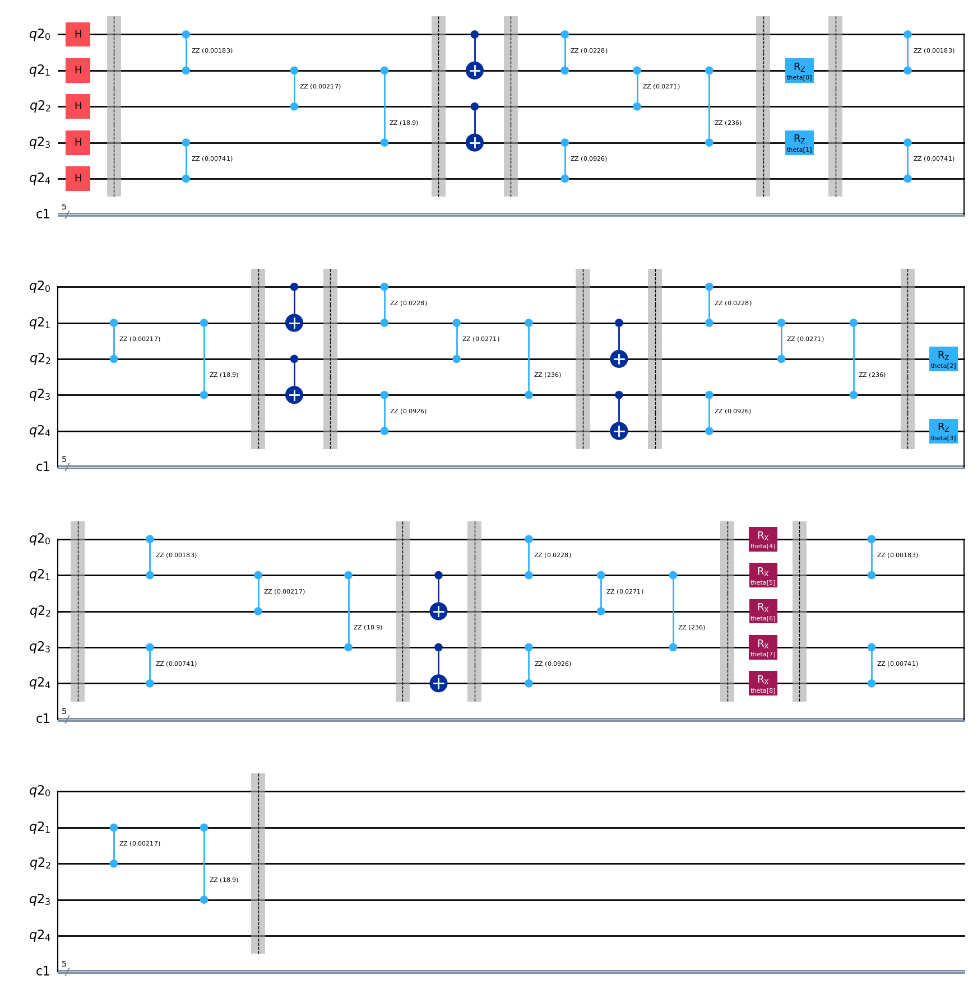

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

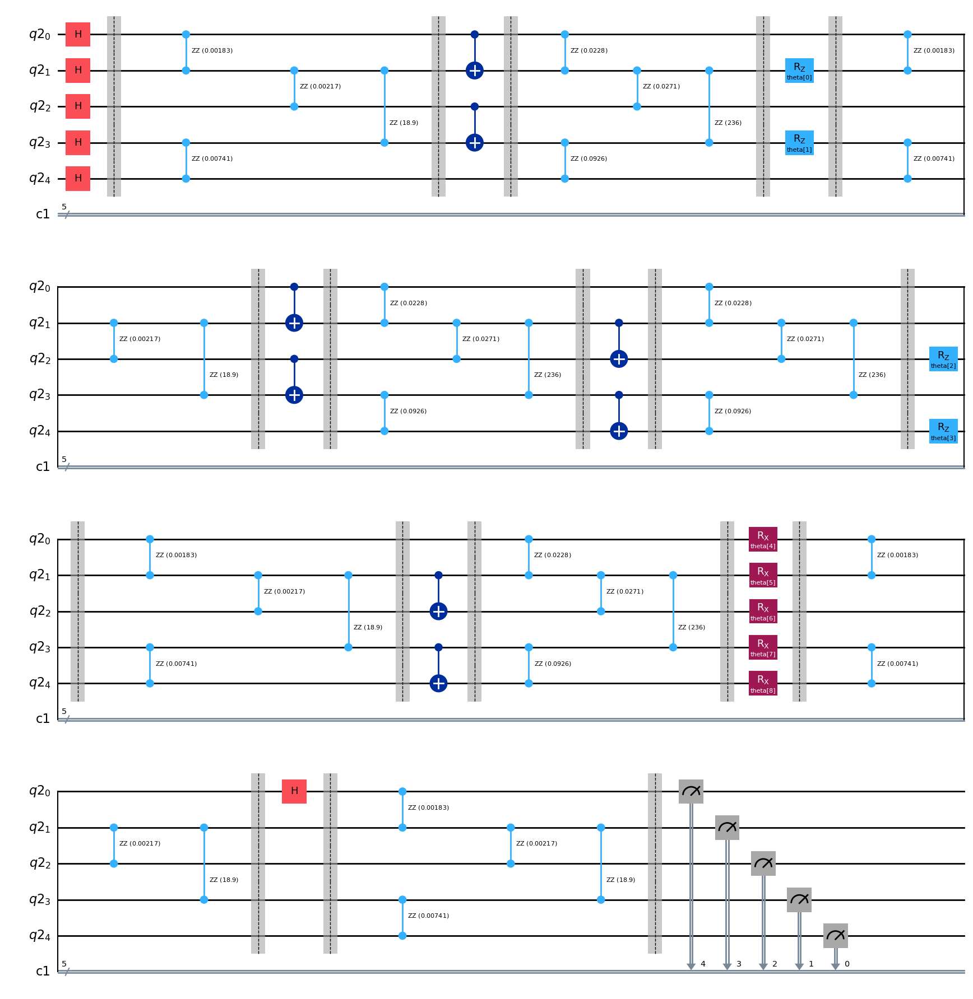

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

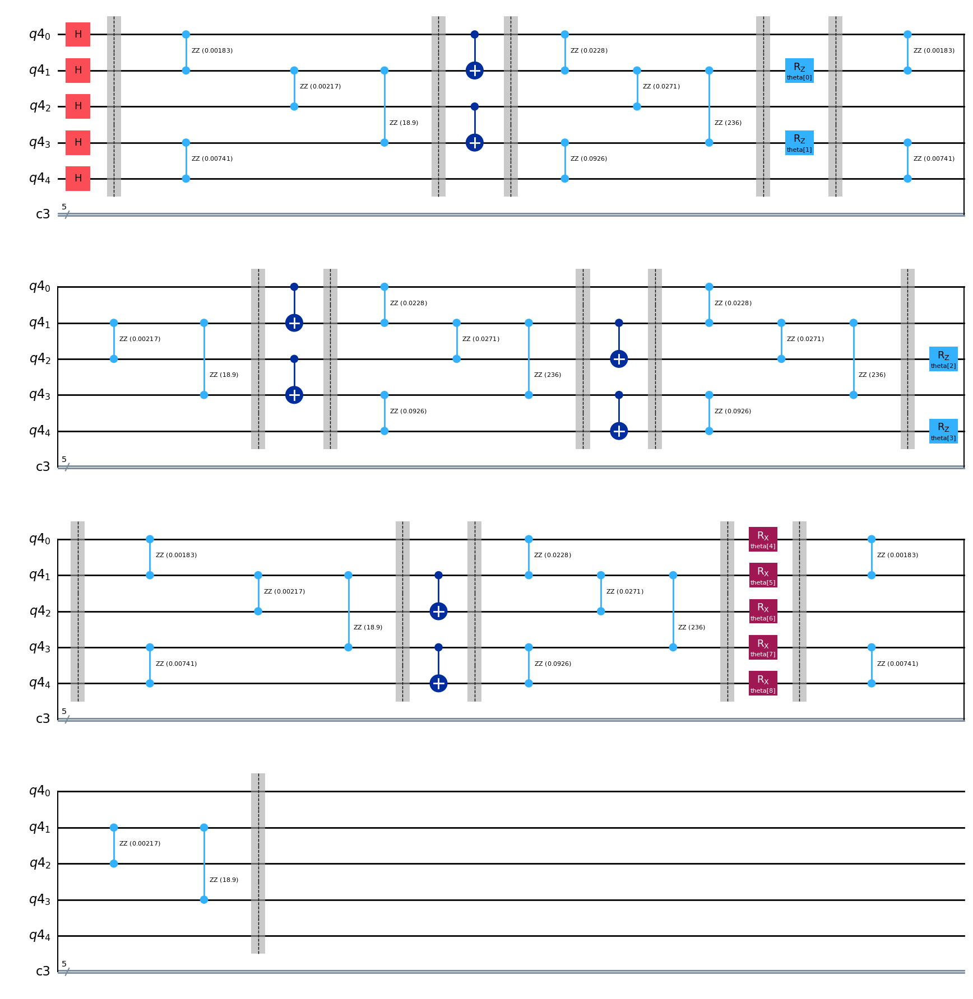

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

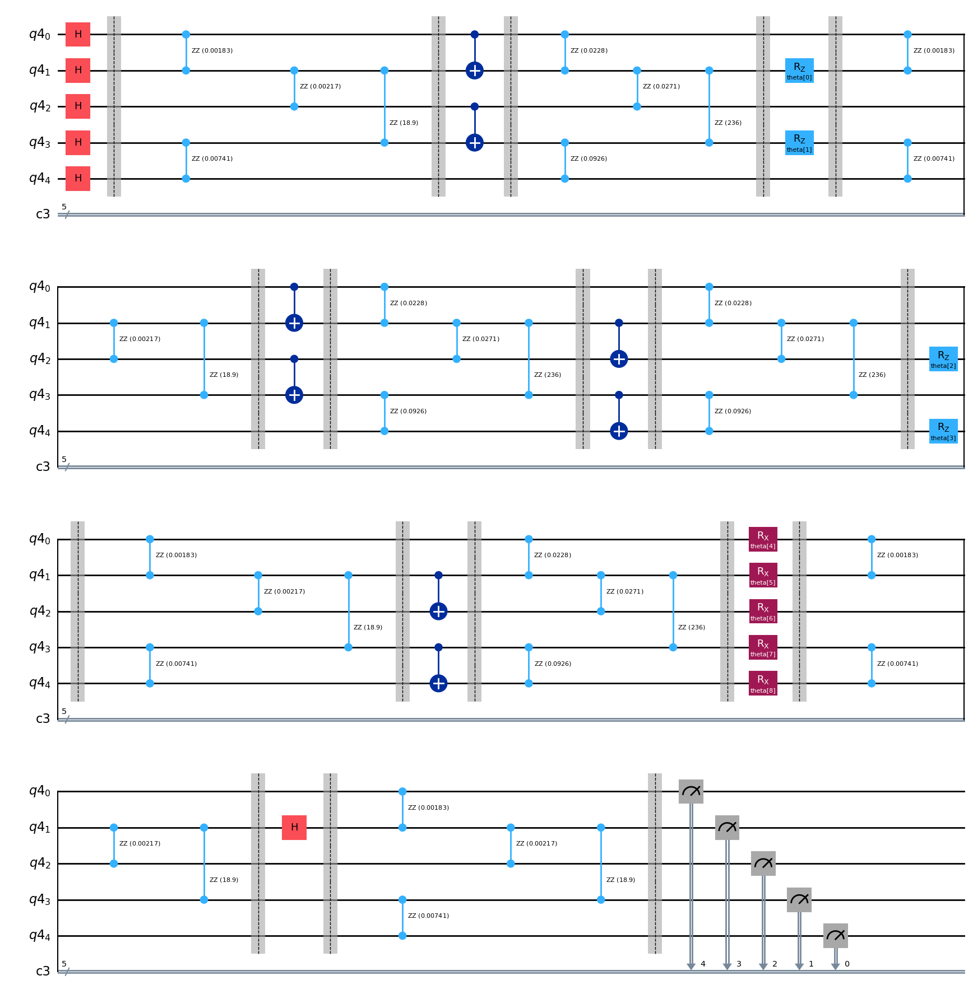

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

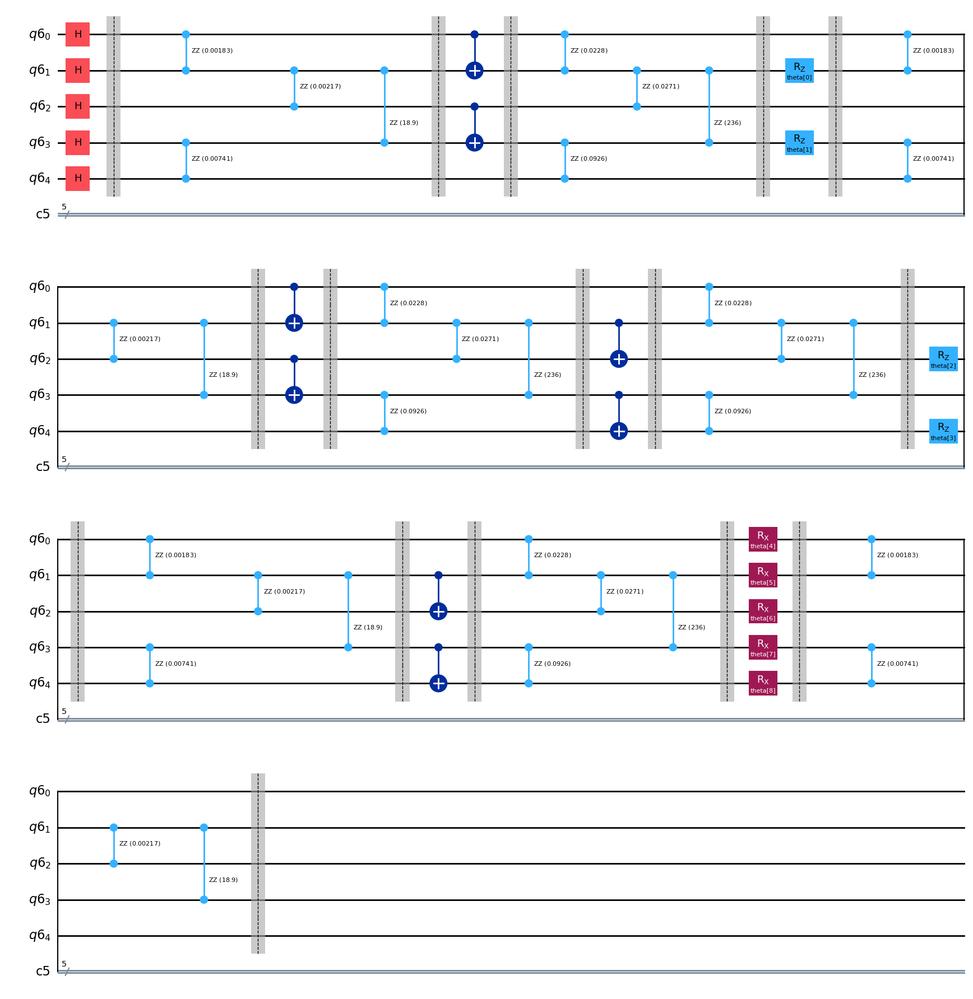

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

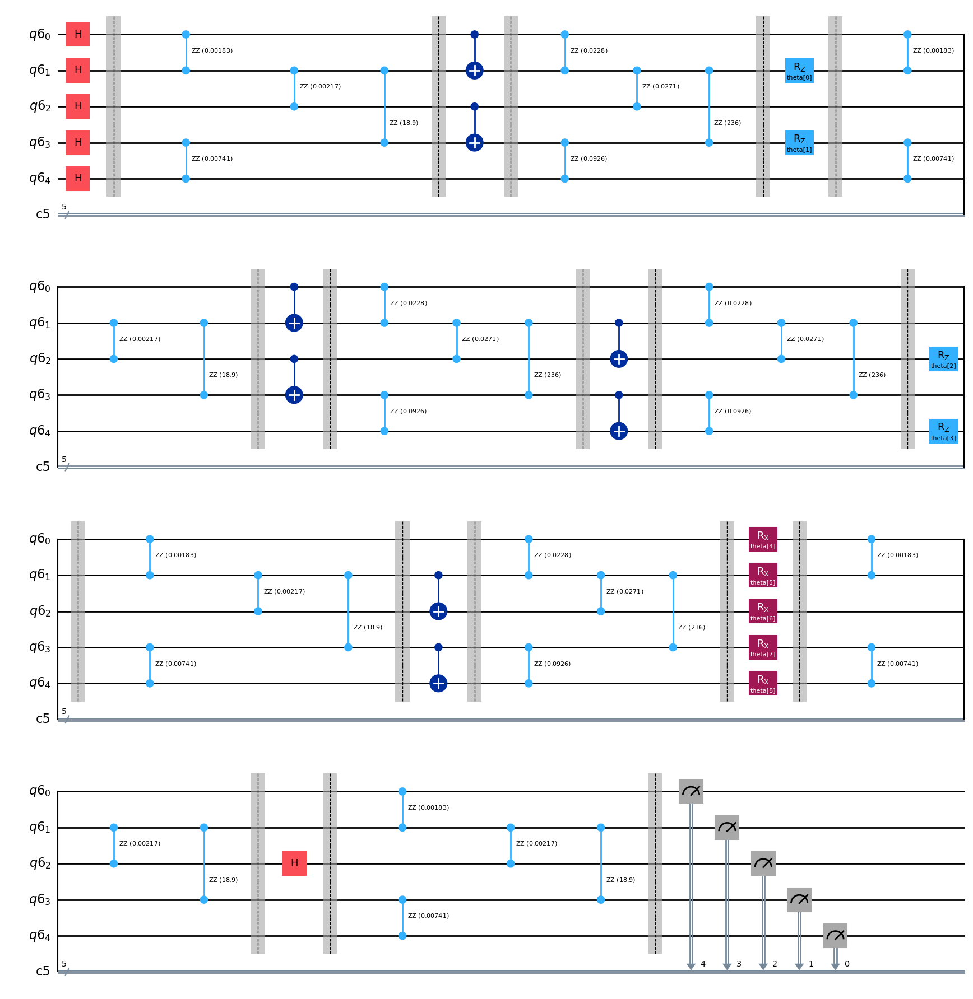

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

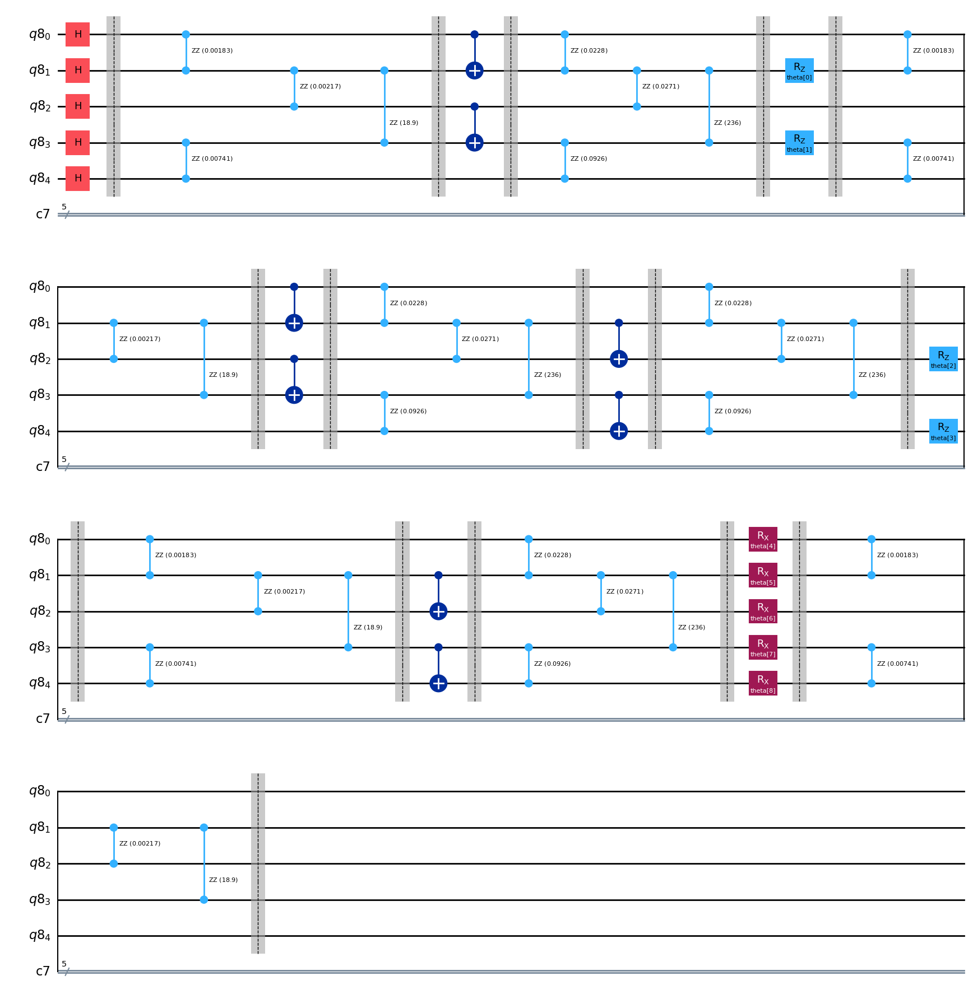

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

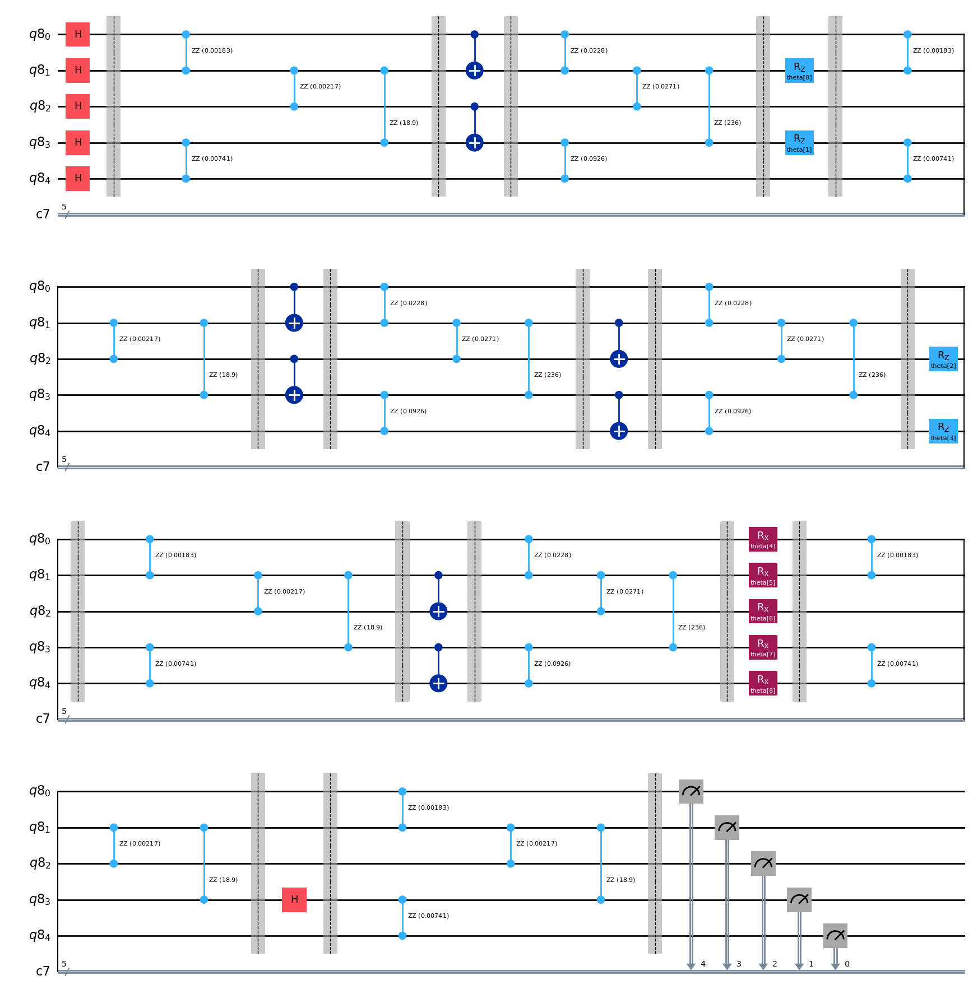

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

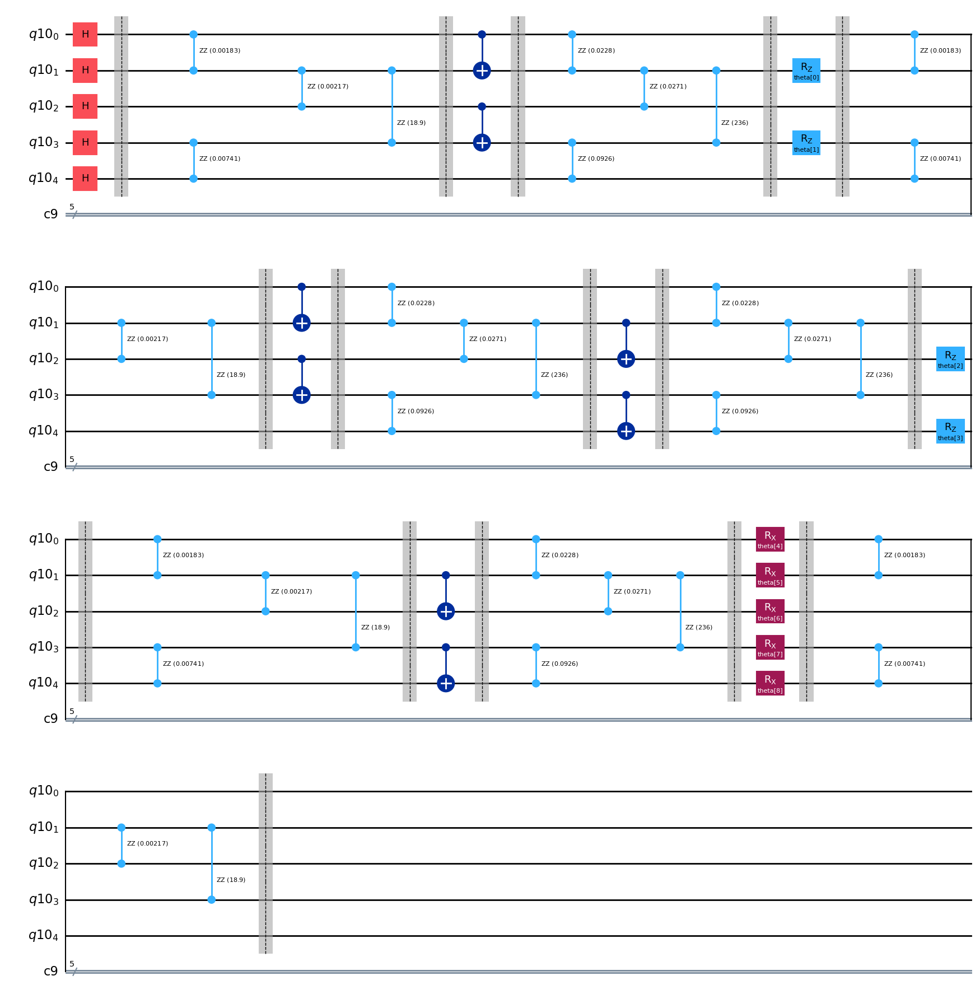

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

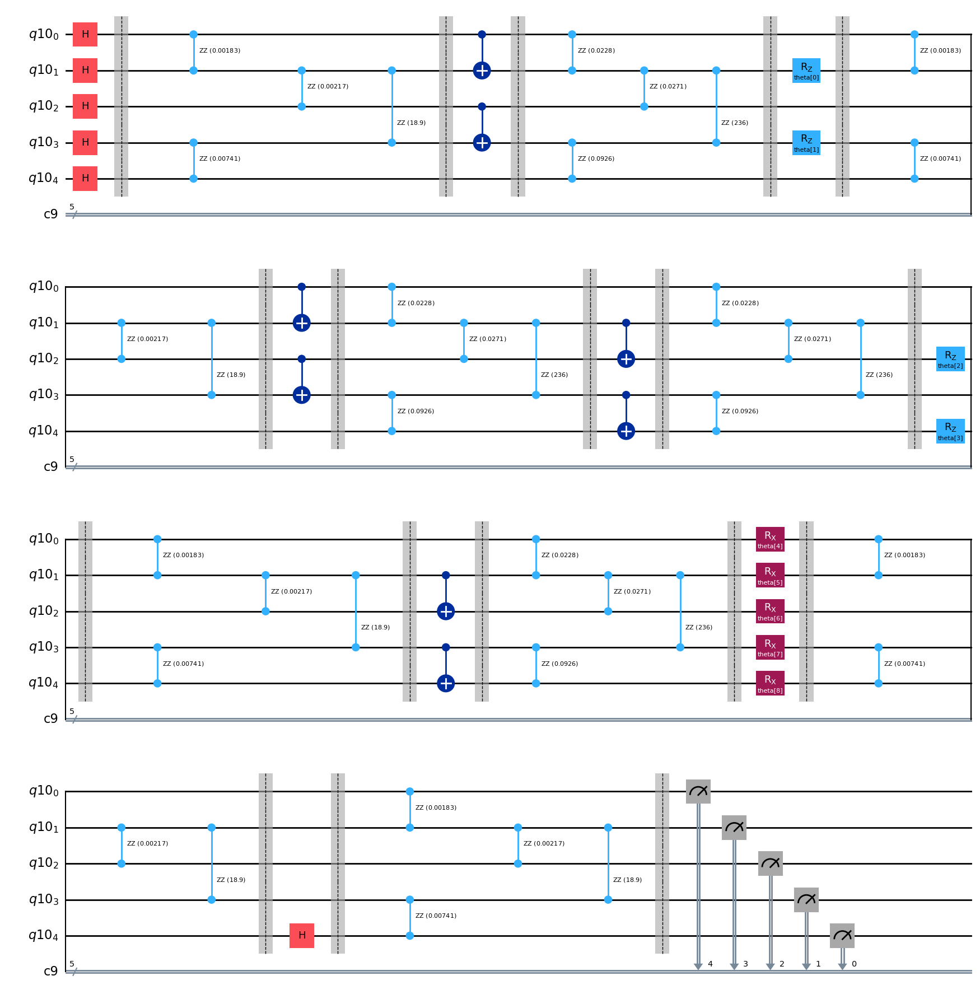

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-5.697399999999999
-5.8138
-5.790600000000001
-5.703600000000001
-3.5253999999999994
-5.8274
-3.5668
-5.7596
-5.861800000000001
-5.7608
-5.7778
-5.8082
-5.8187999999999995
-3.4508
-5.7952
-3.4644000000000004
-5.650800000000001
-5.797600000000001
-3.3502000000000005
-5.618


In [ ]:
lowest_energy_vqe

-5.861800000000001

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.697399999999999
-5.8138
-5.790600000000001
-5.703600000000001
-3.5253999999999994
-5.8274
-3.5668
-5.7596
-5.861800000000001
-5.7608
-5.7778
-5.8082
-5.8187999999999995
-3.4508
-5.7952
-3.4644000000000004
-5.650800000000001
-5.797600000000001
-3.3502000000000005
-5.618
Optimization terminated successfully.
         Current function value: -6.252538
         Iterations: 174
         Function evaluations: 7296
         Gradient evaluations: 228


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.231528
         Iterations: 108
         Function evaluations: 5833
         Gradient evaluations: 182


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.236337
         Iterations: 100
         Function evaluations: 6028
         Gradient evaluations: 188


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.238784
         Iterations: 127
         Function evaluations: 7435
         Gradient evaluations: 232
Optimization terminated successfully.
         Current function value: -6.270087
         Iterations: 253
         Function evaluations: 9920
         Gradient evaluations: 310


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.252356
         Iterations: 300
         Function evaluations: 10592
         Gradient evaluations: 331


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.216318
         Iterations: 158
         Function evaluations: 7621
         Gradient evaluations: 238


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.246098
         Iterations: 300
         Function evaluations: 12384
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.251052
         Iterations: 181
         Function evaluations: 11115
         Gradient evaluations: 347


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.257059
         Iterations: 126
         Function evaluations: 7436
         Gradient evaluations: 232


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.226971
         Iterations: 233
         Function evaluations: 11017
         Gradient evaluations: 344


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.201221
         Iterations: 194
         Function evaluations: 9088
         Gradient evaluations: 284


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.236996
         Iterations: 154
         Function evaluations: 10120
         Gradient evaluations: 316


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.216359
         Iterations: 136
         Function evaluations: 8650
         Gradient evaluations: 270
Optimization terminated successfully.
         Current function value: -6.251810
         Iterations: 105
         Function evaluations: 3776
         Gradient evaluations: 118


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.210119
         Iterations: 300
         Function evaluations: 11328
         Gradient evaluations: 354


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.214507
         Iterations: 192
         Function evaluations: 11531
         Gradient evaluations: 360


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.248056
         Iterations: 167
         Function evaluations: 8746
         Gradient evaluations: 273
Optimization terminated successfully.
         Current function value: -6.225140
         Iterations: 182
         Function evaluations: 7552
         Gradient evaluations: 236
         Current function value: -6.244879
         Iterations: 119
         Function evaluations: 8876
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.270086944450637

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.697399999999999
-5.8138
-5.790600000000001
-5.703600000000001
-3.5253999999999994
-5.8274
-3.5668
-5.7596
-5.861800000000001
-5.7608
-5.7778
-5.8082
-5.8187999999999995
-3.4508
-5.7952
-3.4644000000000004
-5.650800000000001
-5.797600000000001
-3.3502000000000005
-5.618


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.255702
         Iterations: 215
         Function evaluations: 20076
         Gradient evaluations: 352


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.253653
         Iterations: 300
         Function evaluations: 21147
         Gradient evaluations: 371


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.193708
         Iterations: 97
         Function evaluations: 10614
         Gradient evaluations: 186


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.263244
         Iterations: 300
         Function evaluations: 21831
         Gradient evaluations: 383


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.232341
         Iterations: 42
         Function evaluations: 5826
         Gradient evaluations: 102


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.260627
         Iterations: 100
         Function evaluations: 9473
         Gradient evaluations: 166


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.239670
         Iterations: 128
         Function evaluations: 11811
         Gradient evaluations: 207


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.250648
         Iterations: 300
         Function evaluations: 20520
         Gradient evaluations: 360
         Current function value: -6.261677
         Iterations: 300
         Function evaluations: 19893
         Gradient evaluations: 349


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.262250
         Iterations: 282
         Function evaluations: 22184
         Gradient evaluations: 389


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.226985
         Iterations: 242
         Function evaluations: 17442
         Gradient evaluations: 306


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.023924
         Iterations: 61
         Function evaluations: 7868
         Gradient evaluations: 138


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.267638
         Iterations: 229
         Function evaluations: 17391
         Gradient evaluations: 305


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.180884
         Iterations: 136
         Function evaluations: 11526
         Gradient evaluations: 202


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.245434
         Iterations: 203
         Function evaluations: 13452
         Gradient evaluations: 236


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.227074
         Iterations: 168
         Function evaluations: 15966
         Gradient evaluations: 280


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.230392
         Iterations: 150
         Function evaluations: 10944
         Gradient evaluations: 192


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.245313
         Iterations: 300
         Function evaluations: 23313
         Gradient evaluations: 409
Optimization terminated successfully.
         Current function value: -6.034495
         Iterations: 68
         Function evaluations: 7467
         Gradient evaluations: 131
         Current function value: -6.229633
         Iterations: 300
         Function evaluations: 23142
         Gradient evaluations: 406


In [ ]:
lowest_energy_vqnhe

-6.267638048354183

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.697399999999999
-5.8138
-5.790600000000001
-5.703600000000001
-3.5253999999999994
-5.8274
-3.5668
-5.7596
-5.861800000000001
-5.7608
-5.7778
-5.8082
-5.8187999999999995
-3.4508
-5.7952
-3.4644000000000004
-5.650800000000001
-5.797600000000001
-3.3502000000000005
-5.618
Optimization terminated successfully.
         Current function value: -5.968903
         Iterations: 57
         Function evaluations: 3465
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: -5.947187
         Iterations: 41
         Function evaluations: 2640
         Gradient evaluations: 48


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.950838
         Iterations: 51
         Function evaluations: 6223
         Gradient evaluations: 113


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.941690
         Iterations: 111
         Function evaluations: 11232
         Gradient evaluations: 204
Optimization terminated successfully.
         Current function value: -5.951306
         Iterations: 51
         Function evaluations: 5005
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: -5.944477
         Iterations: 24
         Function evaluations: 1485
         Gradient evaluations: 27


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.952331
         Iterations: 80
         Function evaluations: 8755
         Gradient evaluations: 159


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.951711
         Iterations: 74
         Function evaluations: 9417
         Gradient evaluations: 171
Optimization terminated successfully.
         Current function value: -5.861800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.947256
         Iterations: 43
         Function evaluations: 7322
         Gradient evaluations: 133
Optimization terminated successfully.
         Current function value: -5.975756
         Iterations: 50
         Function evaluations: 2970
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.886697
         Iterations: 15
         Function evaluations: 1265
         Gradient evaluations: 23


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.950791
         Iterations: 116
         Function evaluations: 14965
         Gradient evaluations: 272
Optimization terminated successfully.
         Current function value: -5.883760
         Iterations: 12
         Function evaluations: 825
         Gradient evaluations: 15


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.935832
         Iterations: 32
         Function evaluations: 7492
         Gradient evaluations: 136
Optimization terminated successfully.
         Current function value: -5.956753
         Iterations: 55
         Function evaluations: 3190
         Gradient evaluations: 58


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.931362
         Iterations: 72
         Function evaluations: 10071
         Gradient evaluations: 183


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972598
         Iterations: 154
         Function evaluations: 14474
         Gradient evaluations: 263


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.950387
         Iterations: 66
         Function evaluations: 11282
         Gradient evaluations: 205
Optimization terminated successfully.
         Current function value: -5.883927
         Iterations: 28
         Function evaluations: 1650
         Gradient evaluations: 30


In [ ]:
lowest_energy_vqnhe

-5.975756046764024

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 2MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 2MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.002                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23204253 5.13795747]
[10.16023187 10.37005816  9.97057997]
5.816083447474085e-05
[5.13802666 4.98797334]
[ 9.97054855 10.12606894  9.66843252]
6.893901781612755e-05
[4.98785266 5.01514734]
[ 9.97055616 10.15306245  9.72299139]
0.15006244702056826
[5.01498502 5.28201498]
[ 9.72299606 10.29723471 10.26077922]
0.00023471457999857392


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(2.9080417237370426e-05,
 3.446950890806377e-05,
 0.07503122351028413,
 0.00011735728999928696)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

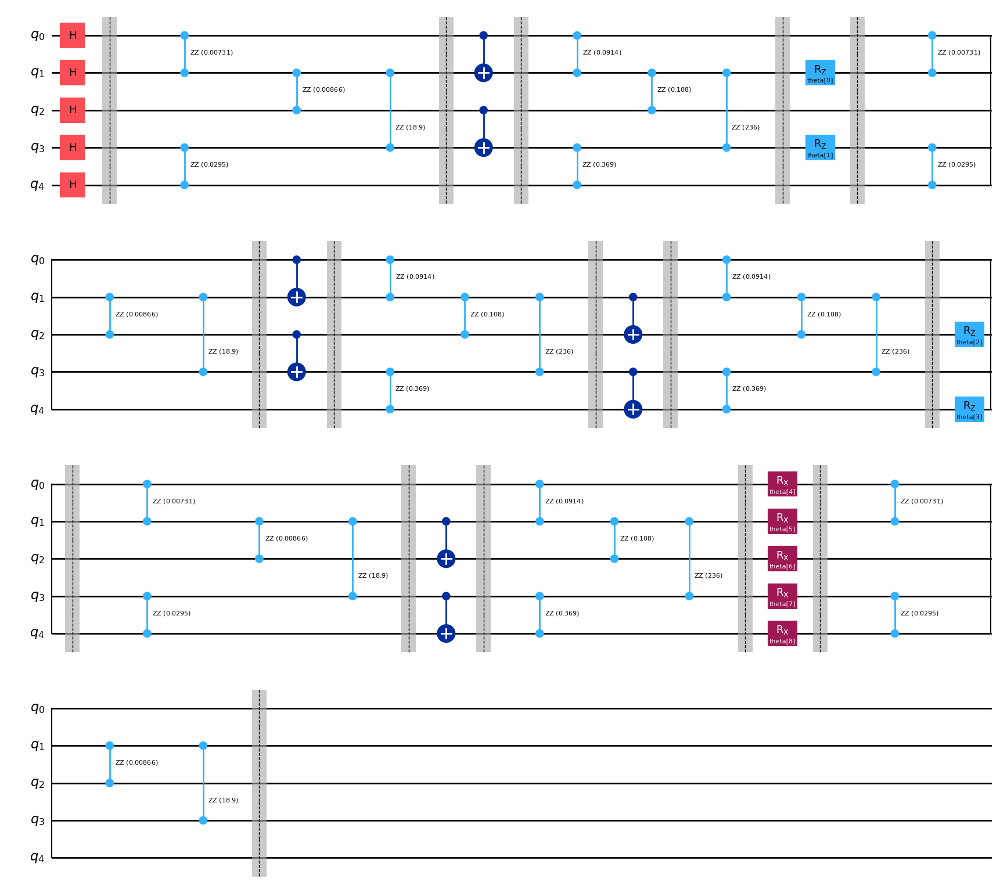

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

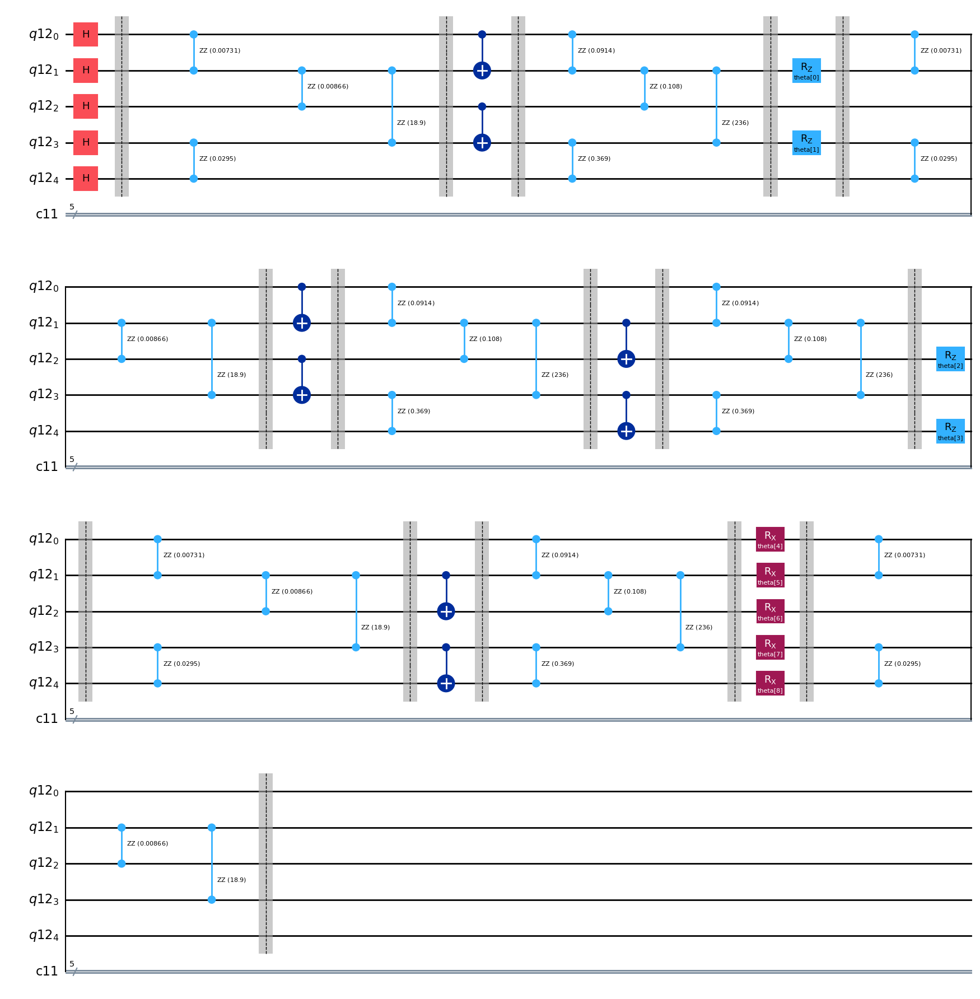

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

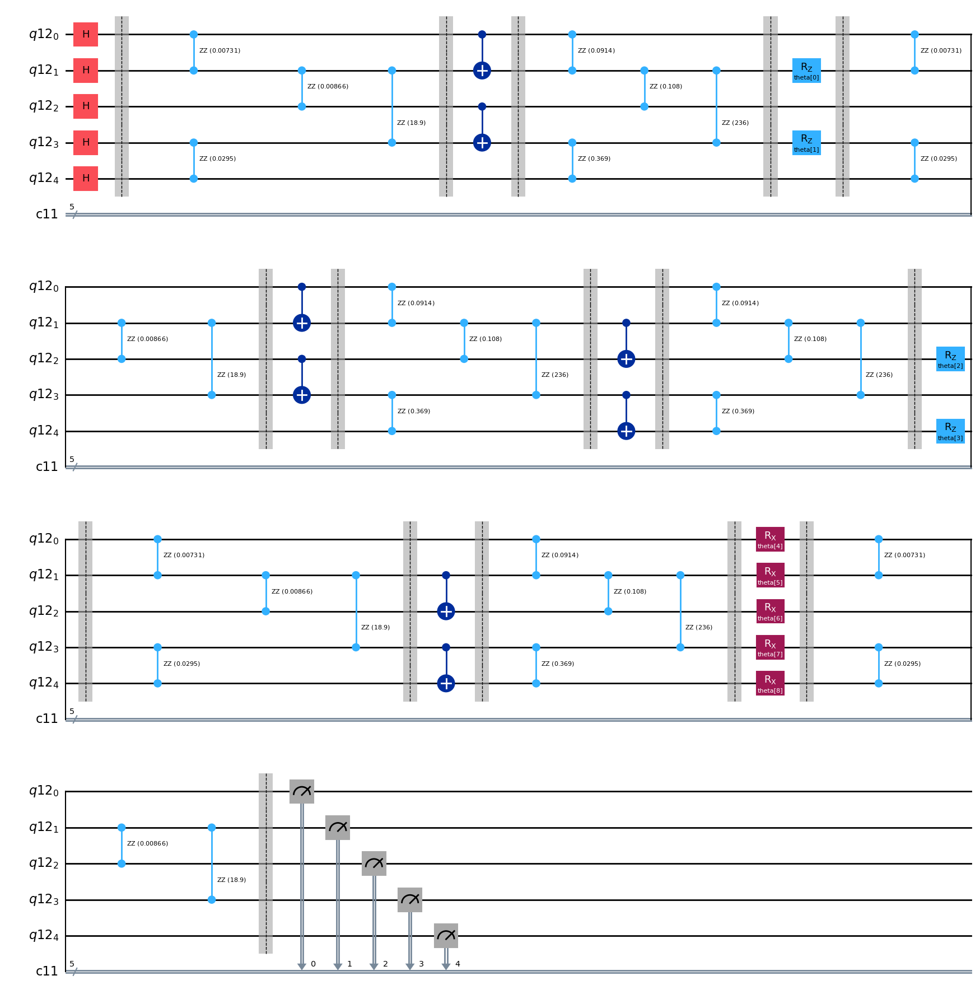

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

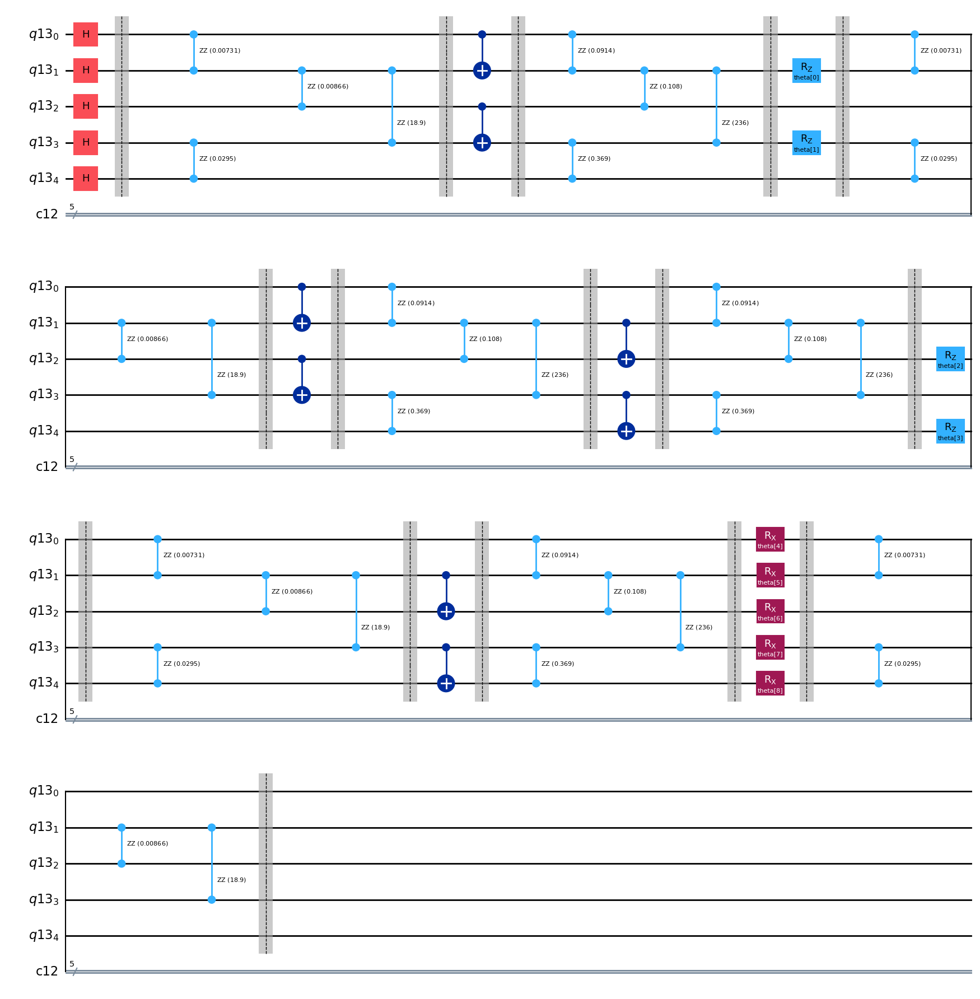

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

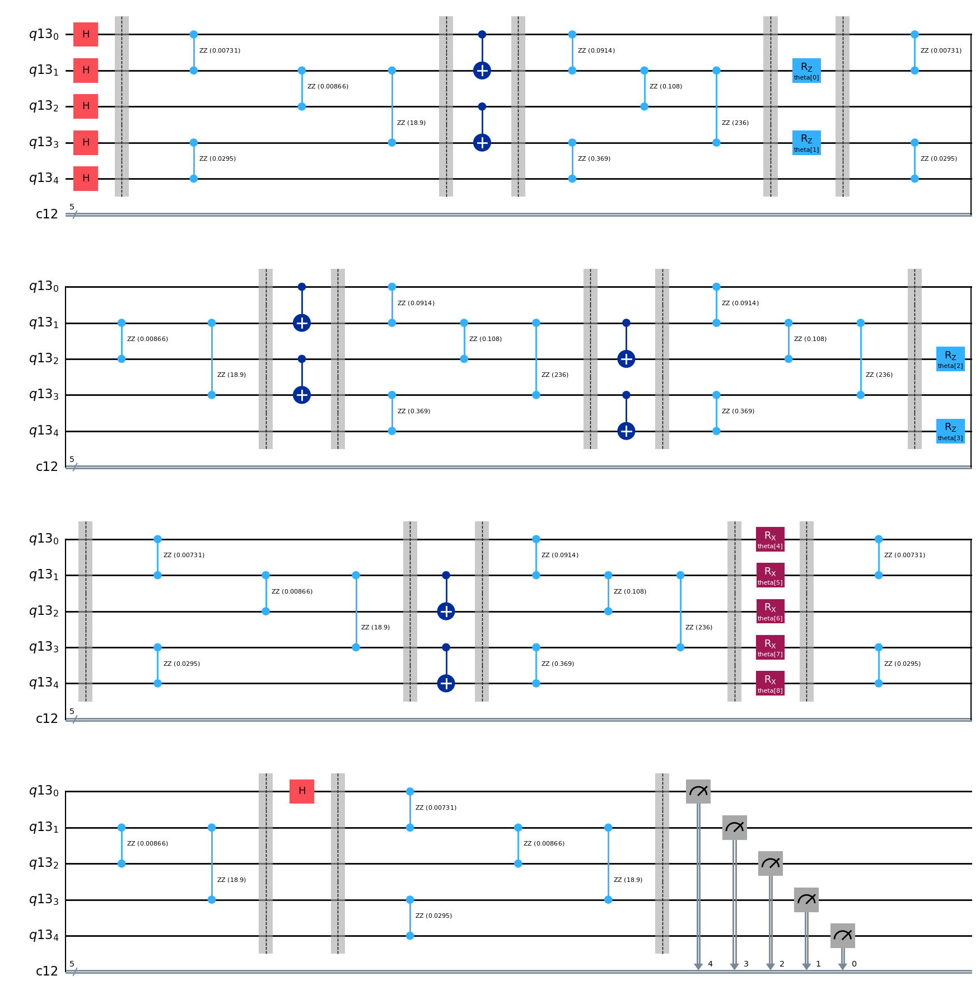

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

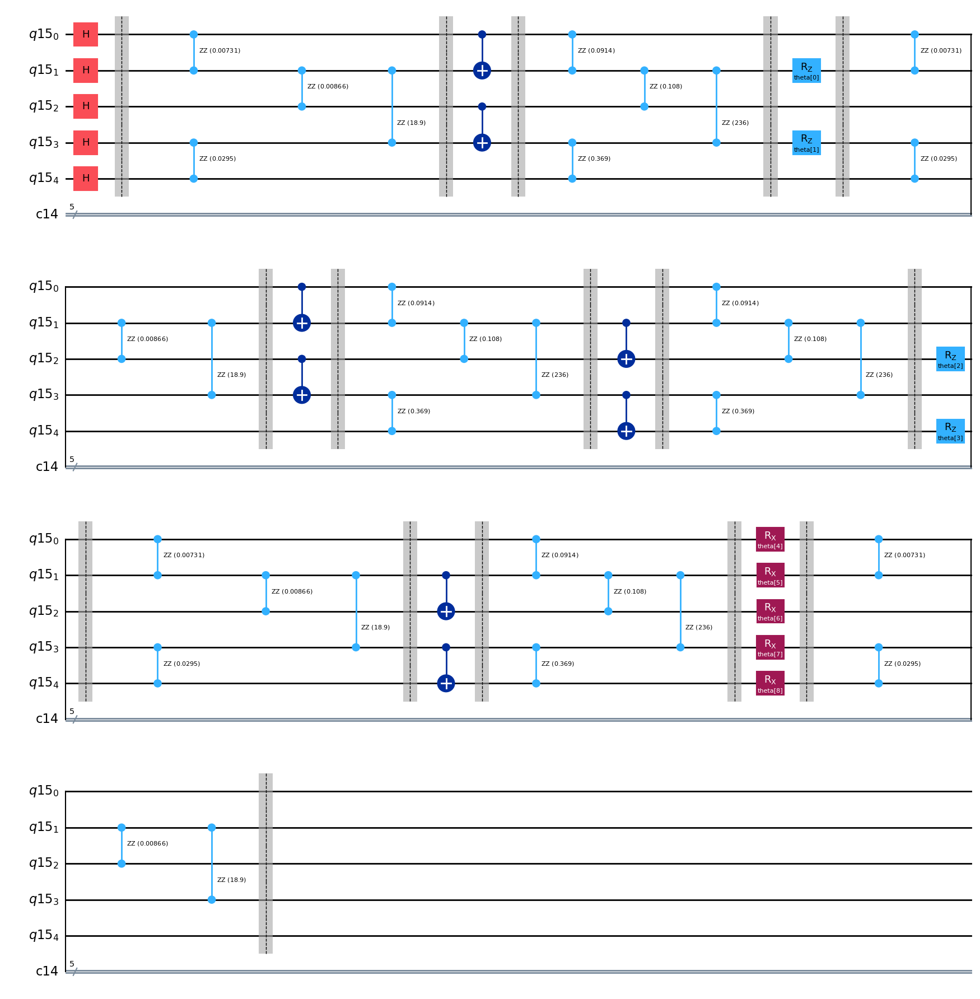

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

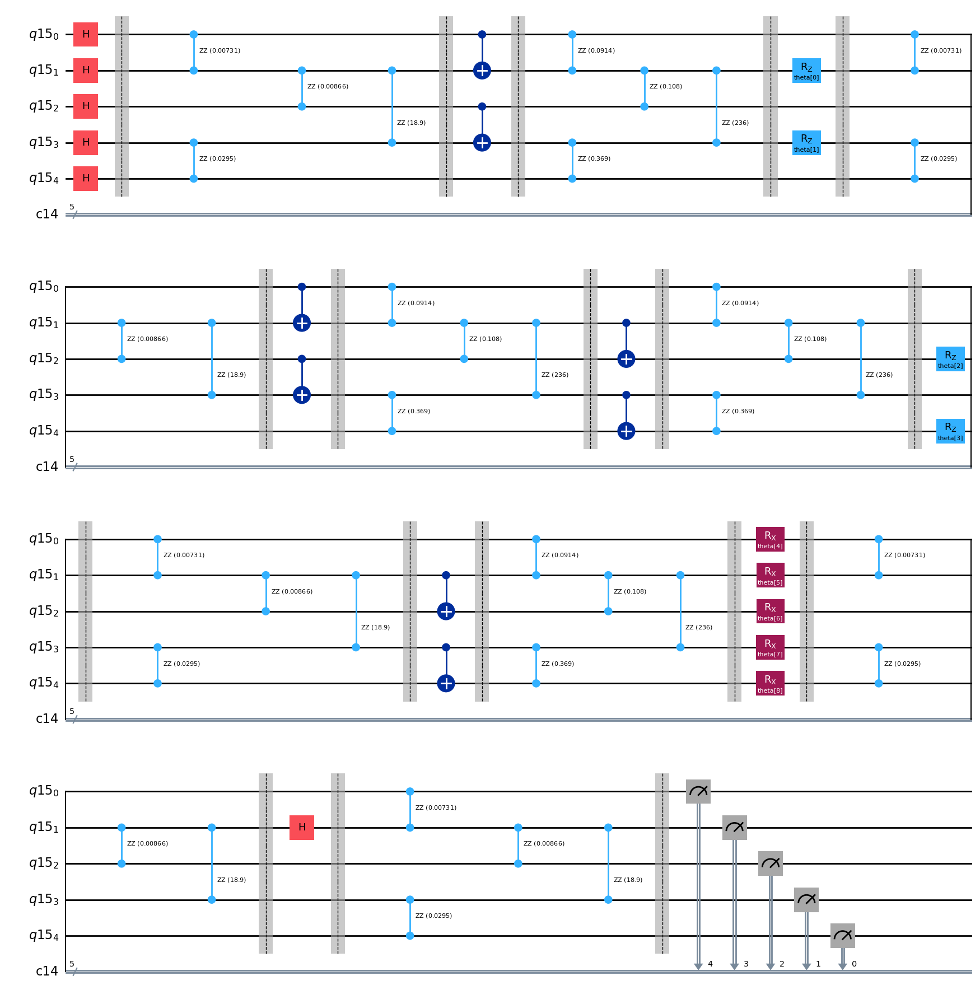

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

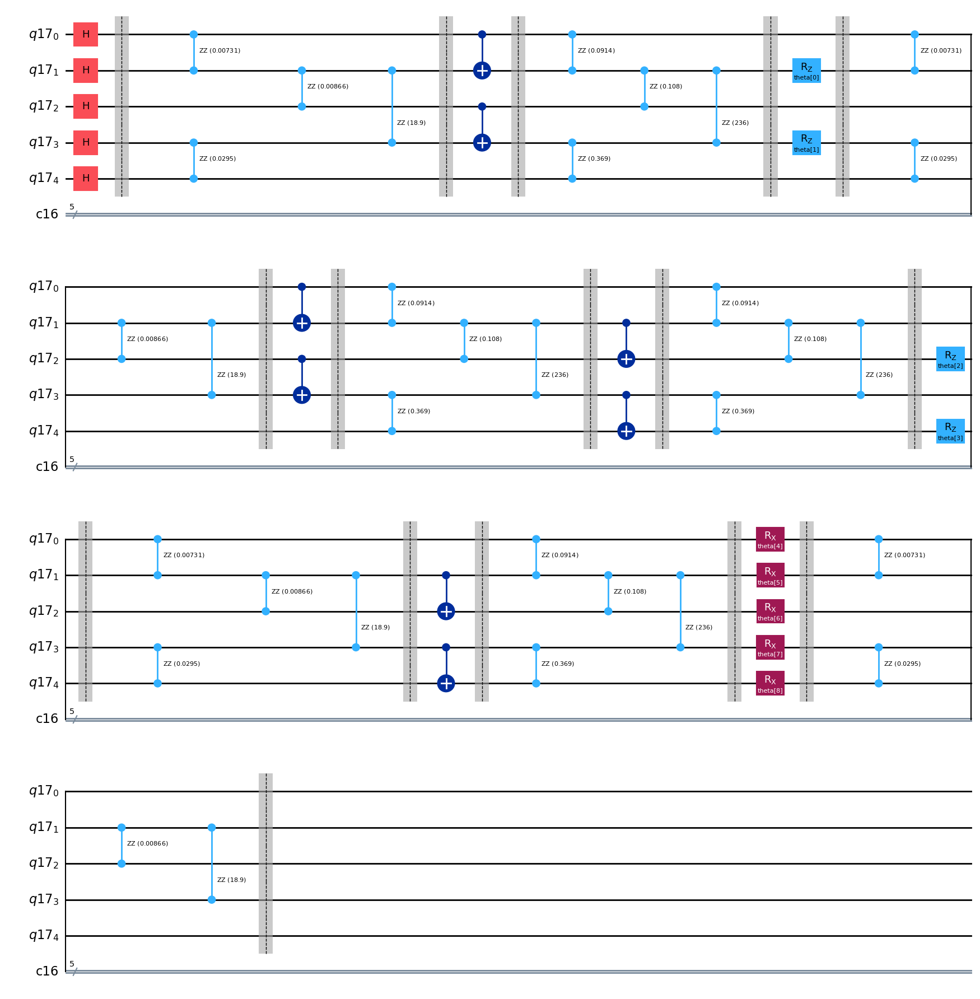

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

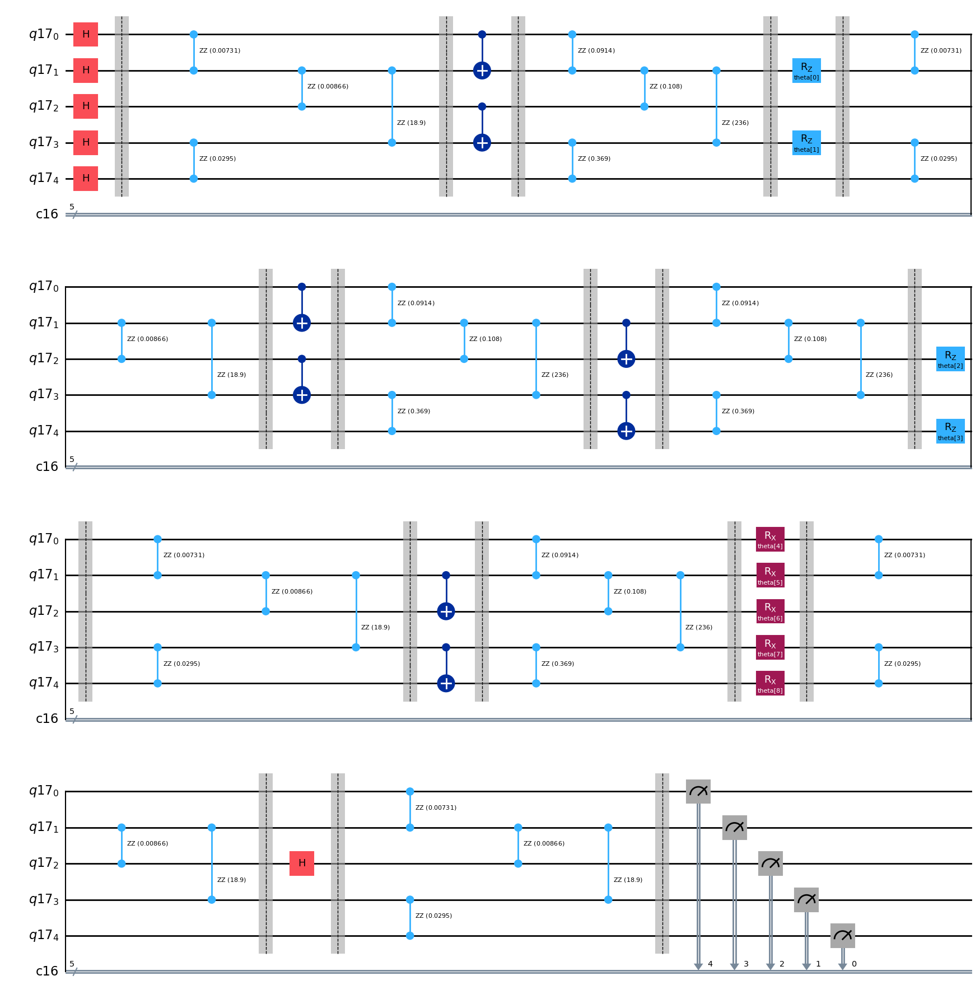

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

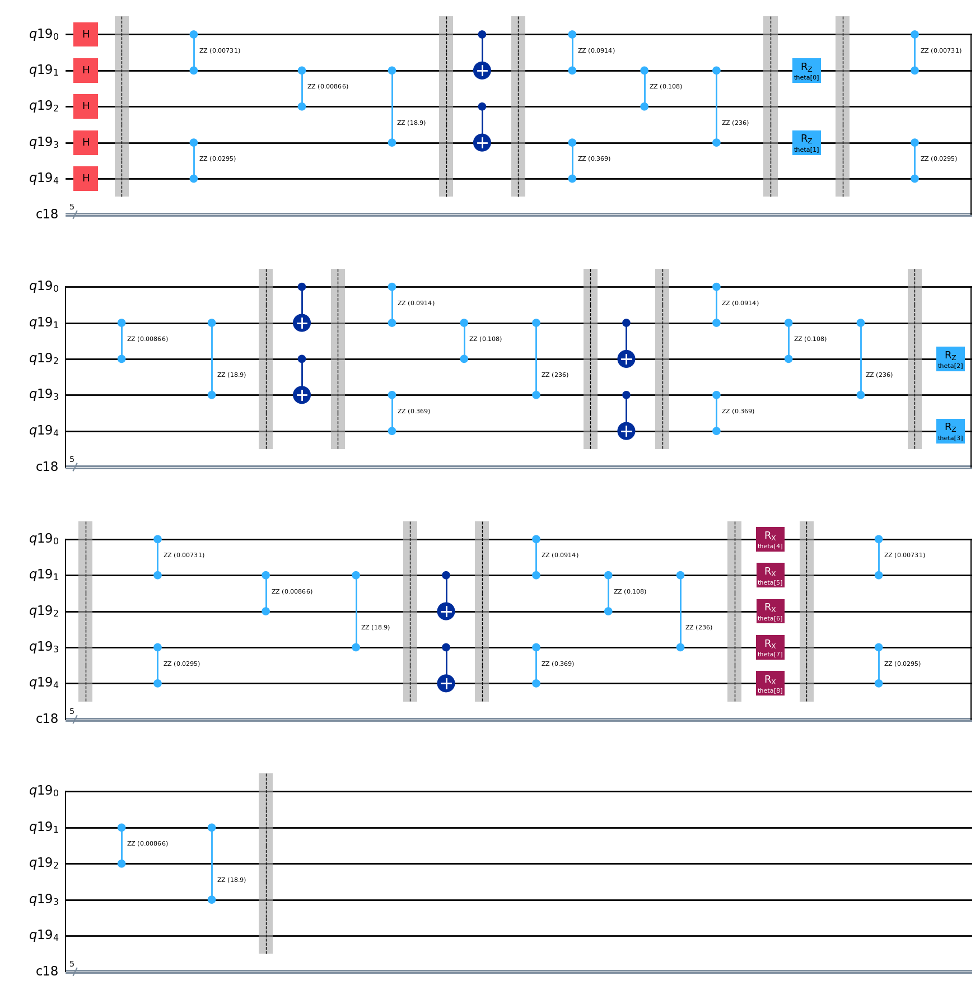

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

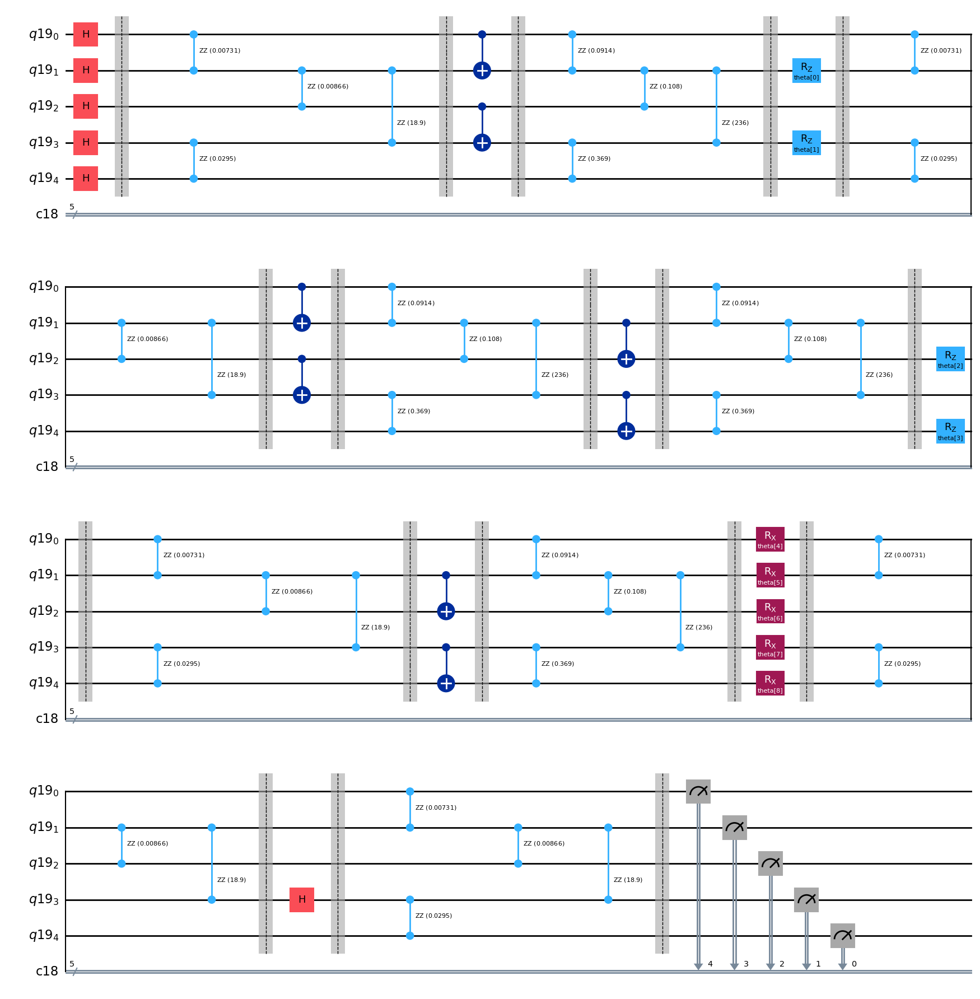

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

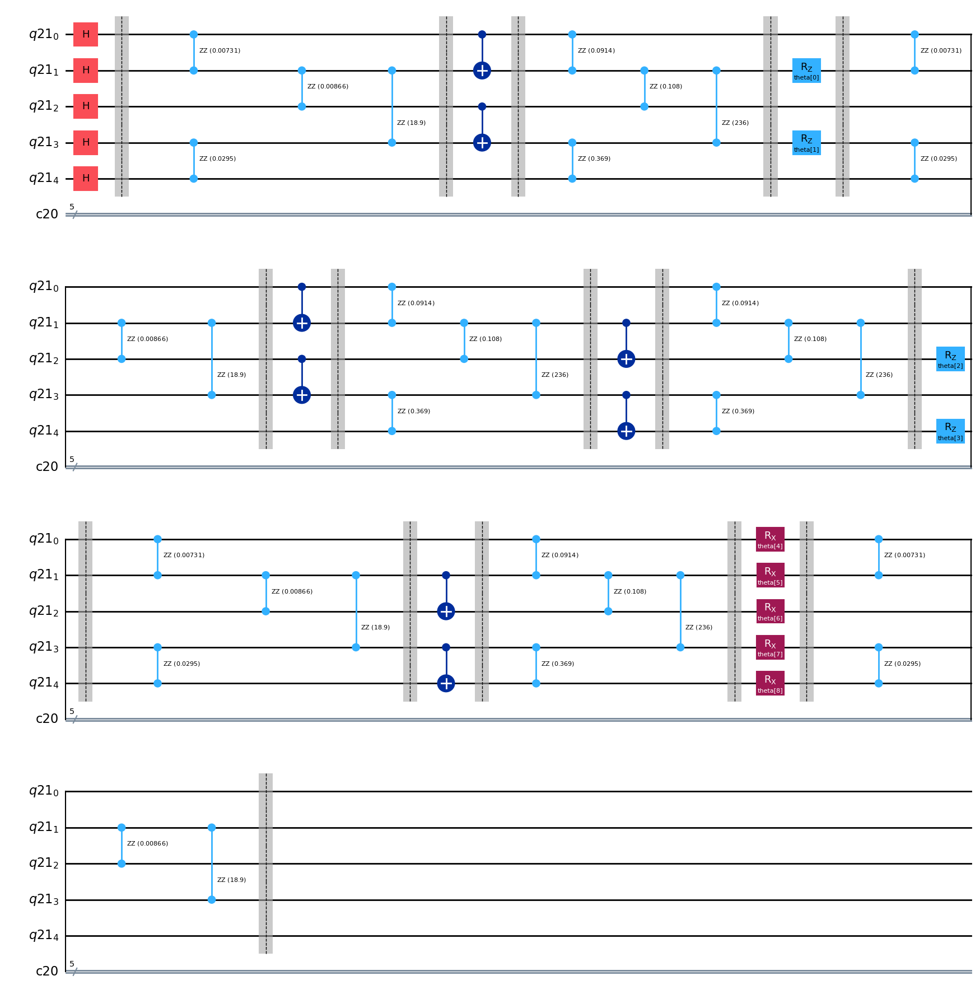

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

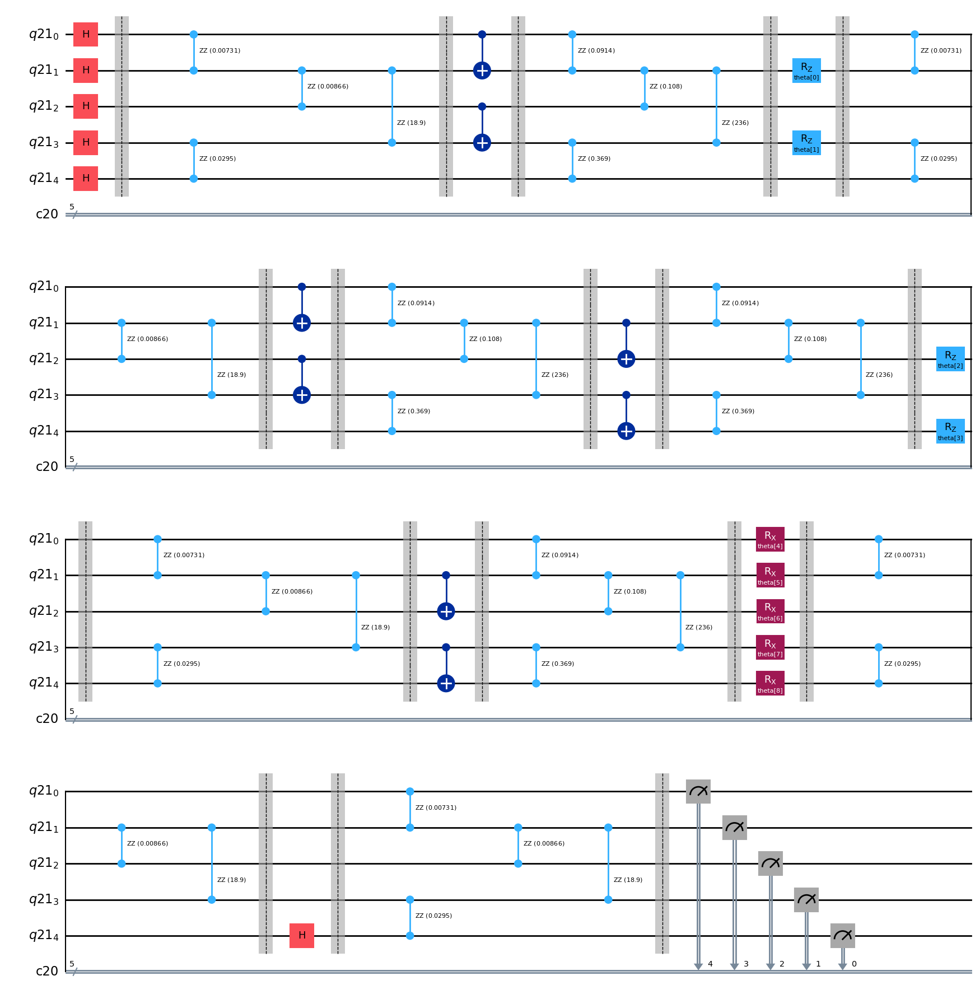

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-5.3202
-5.255000000000001
-5.425800000000001
-5.073
-3.2283999999999993
-5.393400000000001
-3.246400000000001
-5.331000000000001
-3.322
-5.267800000000001
-5.4521999999999995
-5.464999999999999
-5.334200000000001
-3.2358000000000002
-5.4054
-3.1837999999999997
-3.2299999999999995
-5.406800000000001
-3.250599999999999
-5.2128000000000005


In [ ]:
lowest_energy_vqe

-5.464999999999999

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.3202
-5.255000000000001
-5.425800000000001
-5.073
-3.2283999999999993
-5.393400000000001
-3.246400000000001
-5.331000000000001
-3.322
-5.267800000000001
-5.4521999999999995
-5.464999999999999
-5.334200000000001
-3.2358000000000002
-5.4054
-3.1837999999999997
-3.2299999999999995
-5.406800000000001
-3.250599999999999
-5.2128000000000005


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.915679
         Iterations: 221
         Function evaluations: 11468
         Gradient evaluations: 358


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.758958
         Iterations: 105
         Function evaluations: 7557
         Gradient evaluations: 236


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.954879
         Iterations: 193
         Function evaluations: 8996
         Gradient evaluations: 281


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.617148
         Iterations: 115
         Function evaluations: 6891
         Gradient evaluations: 215
Optimization terminated successfully.
         Current function value: -6.865046
         Iterations: 80
         Function evaluations: 2944
         Gradient evaluations: 92


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.932289
         Iterations: 300
         Function evaluations: 12864
         Gradient evaluations: 402
         Current function value: -6.869804
         Iterations: 300
         Function evaluations: 11744
         Gradient evaluations: 367
         Current function value: -6.866393
         Iterations: 300
         Function evaluations: 12448
         Gradient evaluations: 389


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.720682
         Iterations: 52
         Function evaluations: 6316
         Gradient evaluations: 197


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.900792
         Iterations: 300
         Function evaluations: 13536
         Gradient evaluations: 423


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.913189
         Iterations: 115
         Function evaluations: 7172
         Gradient evaluations: 224


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.840912
         Iterations: 300
         Function evaluations: 13216
         Gradient evaluations: 413


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.708365
         Iterations: 278
         Function evaluations: 15147
         Gradient evaluations: 473


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.909575
         Iterations: 117
         Function evaluations: 6316
         Gradient evaluations: 197


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.362907
         Iterations: 99
         Function evaluations: 6118
         Gradient evaluations: 191


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.528728
         Iterations: 252
         Function evaluations: 17704
         Gradient evaluations: 553


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.818223
         Iterations: 89
         Function evaluations: 5836
         Gradient evaluations: 182
Optimization terminated successfully.
         Current function value: -6.723496
         Iterations: 66
         Function evaluations: 2496
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: -6.715530
         Iterations: 129
         Function evaluations: 5120
         Gradient evaluations: 160


<ipython-input-104-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-104-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-104-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-104-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:48: RuntimeWarning: overflow encountered in 

         Current function value: nan
         Iterations: 186
         Function evaluations: 10592
         Gradient evaluations: 331


<ipython-input-101-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-104-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-104-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-104-942dbc8389c9>:86: Run

In [ ]:
lowest_energy_vqnhe

-6.954878915952109

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.3202
-5.255000000000001
-5.425800000000001
-5.073
-3.2283999999999993
-5.393400000000001
-3.246400000000001
-5.331000000000001
-3.322
-5.267800000000001
-5.4521999999999995
-5.464999999999999
-5.334200000000001
-3.2358000000000002
-5.4054
-3.1837999999999997
-3.2299999999999995
-5.406800000000001
-3.250599999999999
-5.2128000000000005


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.949807
         Iterations: 83
         Function evaluations: 10386
         Gradient evaluations: 182


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.867587
         Iterations: 215
         Function evaluations: 21444
         Gradient evaluations: 376


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.988123
         Iterations: 300
         Function evaluations: 20691
         Gradient evaluations: 363
Optimization terminated successfully.
         Current function value: -6.971042
         Iterations: 190
         Function evaluations: 11913
         Gradient evaluations: 209


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.819094
         Iterations: 119
         Function evaluations: 16492
         Gradient evaluations: 289


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.913509
         Iterations: 300
         Function evaluations: 20520
         Gradient evaluations: 360


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.928038
         Iterations: 80
         Function evaluations: 8897
         Gradient evaluations: 156


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.985814
         Iterations: 300
         Function evaluations: 21717
         Gradient evaluations: 381


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.901803
         Iterations: 142
         Function evaluations: 14596
         Gradient evaluations: 256


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.592374
         Iterations: 110
         Function evaluations: 10553
         Gradient evaluations: 185


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.916012
         Iterations: 68
         Function evaluations: 9474
         Gradient evaluations: 166


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.819623
         Iterations: 57
         Function evaluations: 5415
         Gradient evaluations: 95


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.974476
         Iterations: 300
         Function evaluations: 20178
         Gradient evaluations: 354


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.822046
         Iterations: 209
         Function evaluations: 19614
         Gradient evaluations: 344


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.889245
         Iterations: 106
         Function evaluations: 9923
         Gradient evaluations: 174


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.478720
         Iterations: 77
         Function evaluations: 8731
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.669209
         Iterations: 215
         Function evaluations: 25035
         Gradient evaluations: 439


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.685696
         Iterations: 130
         Function evaluations: 13228
         Gradient evaluations: 232


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.827834
         Iterations: 58
         Function evaluations: 7990
         Gradient evaluations: 140
         Current function value: -6.987652
         Iterations: 300
         Function evaluations: 19836
         Gradient evaluations: 348


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.988122821490449

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.3202
-5.255000000000001
-5.425800000000001
-5.073
-3.2283999999999993
-5.393400000000001
-3.246400000000001
-5.331000000000001
-3.322
-5.267800000000001
-5.4521999999999995
-5.464999999999999
-5.334200000000001
-3.2358000000000002
-5.4054
-3.1837999999999997
-3.2299999999999995
-5.406800000000001
-3.250599999999999
-5.2128000000000005


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.630865
         Iterations: 68
         Function evaluations: 5280
         Gradient evaluations: 96


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.766909
         Iterations: 17
         Function evaluations: 4851
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: -5.653598
         Iterations: 22
         Function evaluations: 2035
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: -5.485753
         Iterations: 69
         Function evaluations: 7425
         Gradient evaluations: 135


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.630863
         Iterations: 123
         Function evaluations: 18984
         Gradient evaluations: 345
Optimization terminated successfully.
         Current function value: -5.481778
         Iterations: 17
         Function evaluations: 1045
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: -5.653202
         Iterations: 36
         Function evaluations: 2530
         Gradient evaluations: 46


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.628548
         Iterations: 13
         Function evaluations: 4632
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: -5.465000
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.709606
         Iterations: 26
         Function evaluations: 5677
         Gradient evaluations: 103


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.771131
         Iterations: 60
         Function evaluations: 4345
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: -5.516795
         Iterations: 21
         Function evaluations: 3355
         Gradient evaluations: 61


<ipython-input-101-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-104-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-101-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-104-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-104-942dbc8389c9>:26: RuntimeWarning: invalid value encounte

         Current function value: nan
         Iterations: 93
         Function evaluations: 14135
         Gradient evaluations: 257


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.477853
         Iterations: 24
         Function evaluations: 4345
         Gradient evaluations: 79


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.683080
         Iterations: 31
         Function evaluations: 5292
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: -5.800170
         Iterations: 41
         Function evaluations: 3135
         Gradient evaluations: 57


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.529974
         Iterations: 8
         Function evaluations: 4467
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -5.810716
         Iterations: 30
         Function evaluations: 2090
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: -5.674977
         Iterations: 56
         Function evaluations: 5115
         Gradient evaluations: 93
         Current function value: -5.681456
         Iterations: 15
         Function evaluations: 3527
         Gradient evaluations: 64


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.810715892706478

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 3MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 3MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.003                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23209565 5.13790435]
[10.16018425 10.37013082  9.97055493]
0.00013082397420927094
[5.13805998 4.98794002]
[ 9.9704843  10.12615504  9.66841066]
0.00015504130522803194
[4.98767068 5.01532932]
[ 9.97050141 10.15314046  9.72296814]
0.15014045604688775
[5.0149663 5.2820337]
[ 9.72297864 10.29752416 10.2605072 ]
0.0005241553589732106


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(6.541198710463547e-05,
 7.752065261401597e-05,
 0.07507022802344387,
 0.0002620776794866053)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

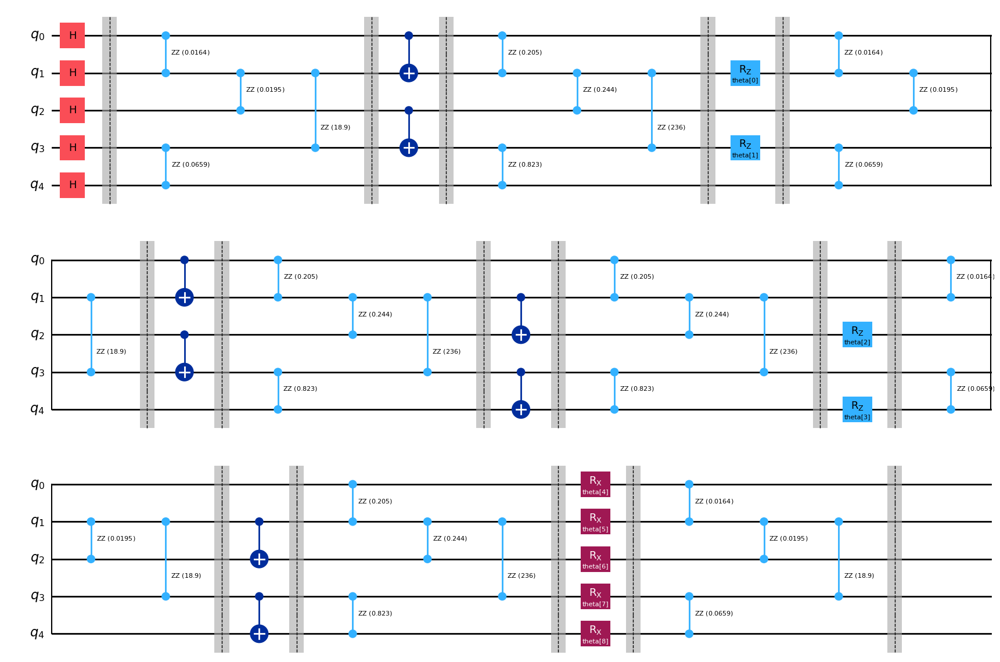

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

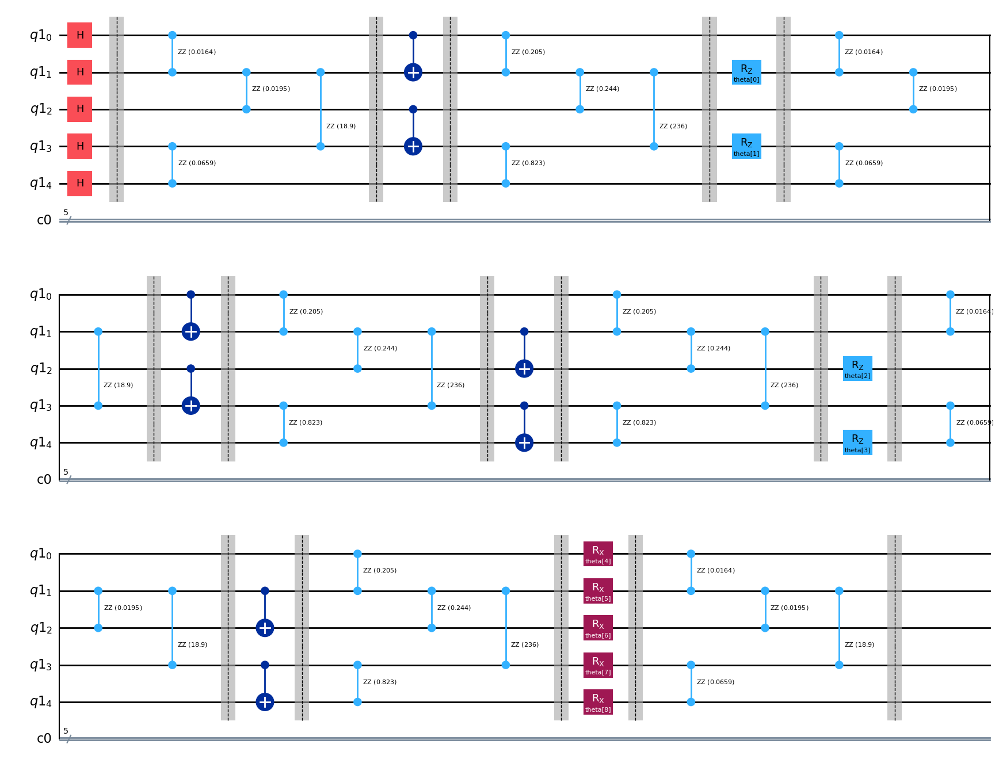

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

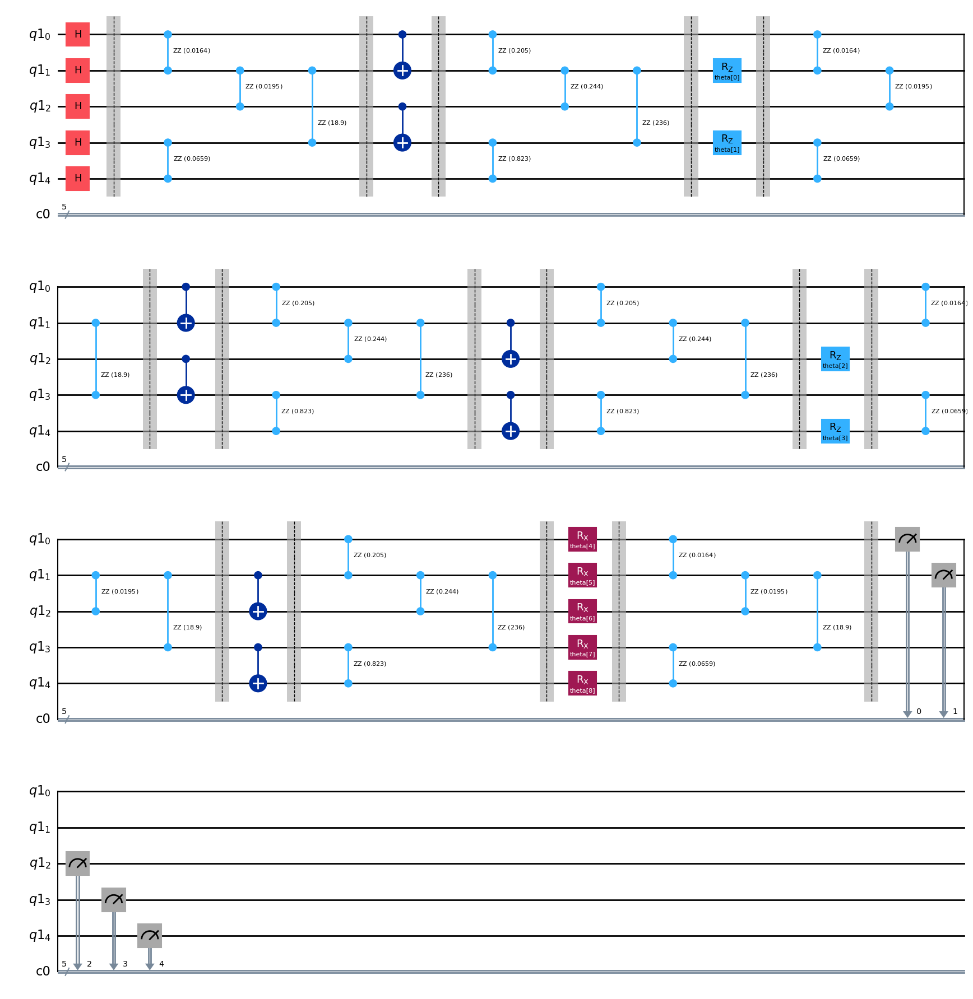

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

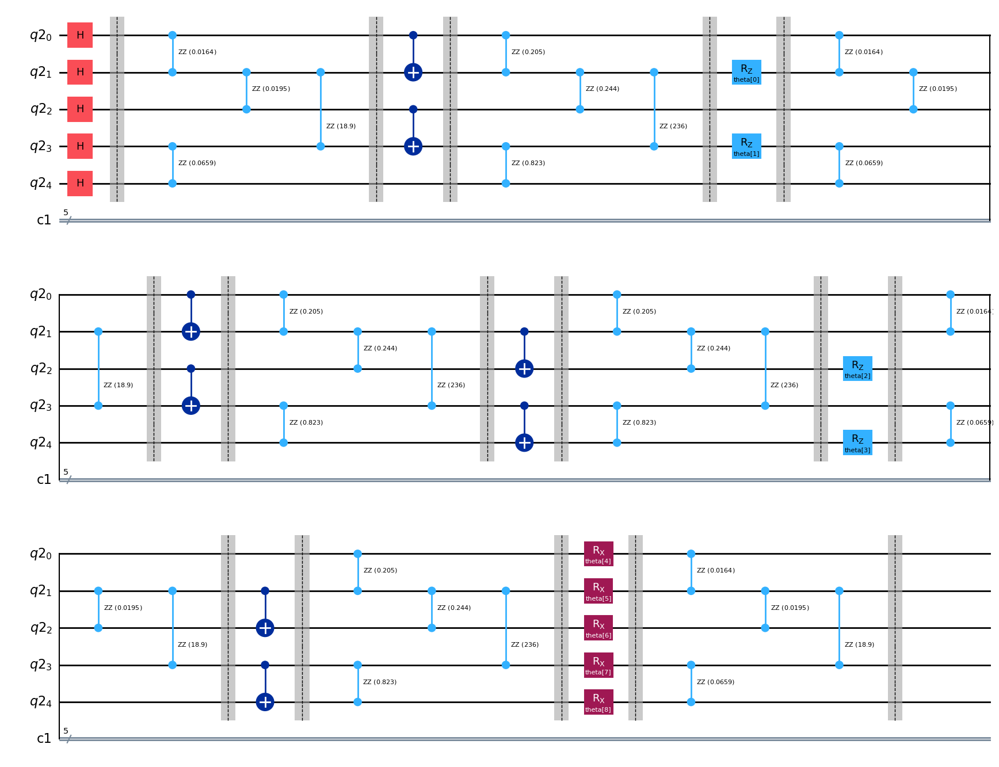

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

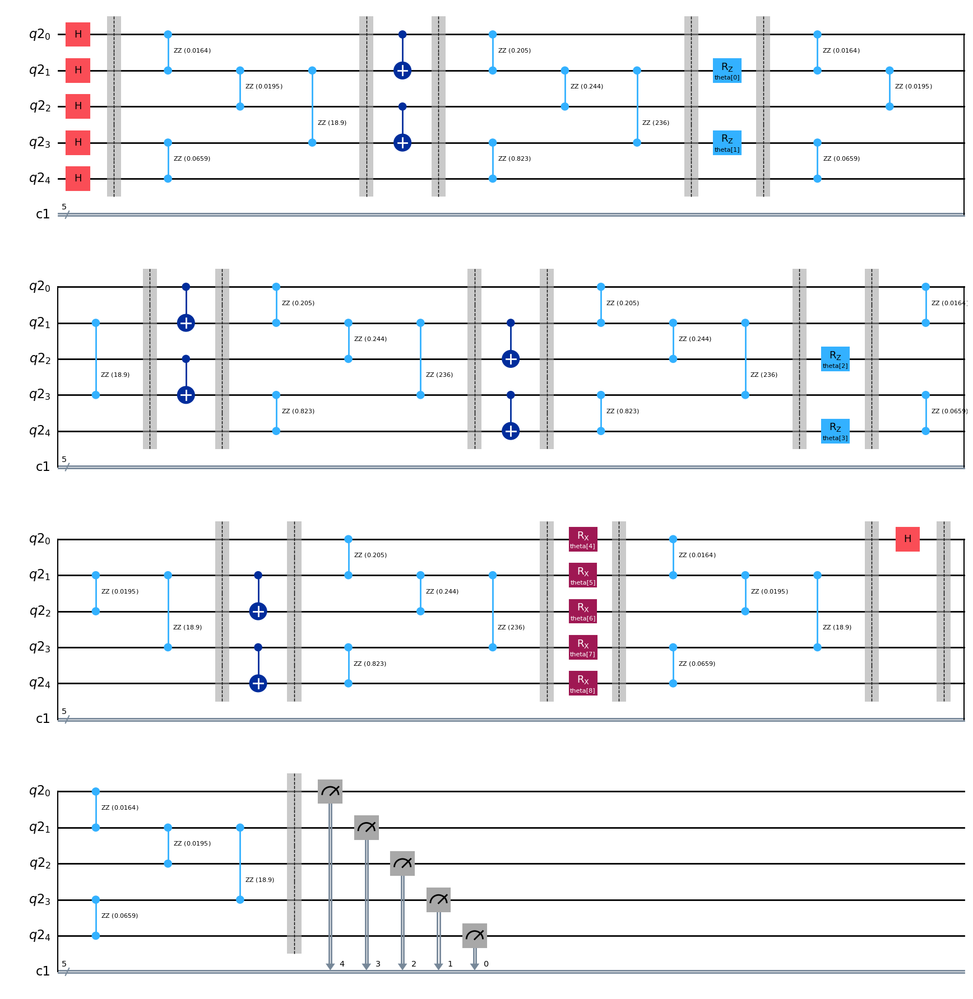

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

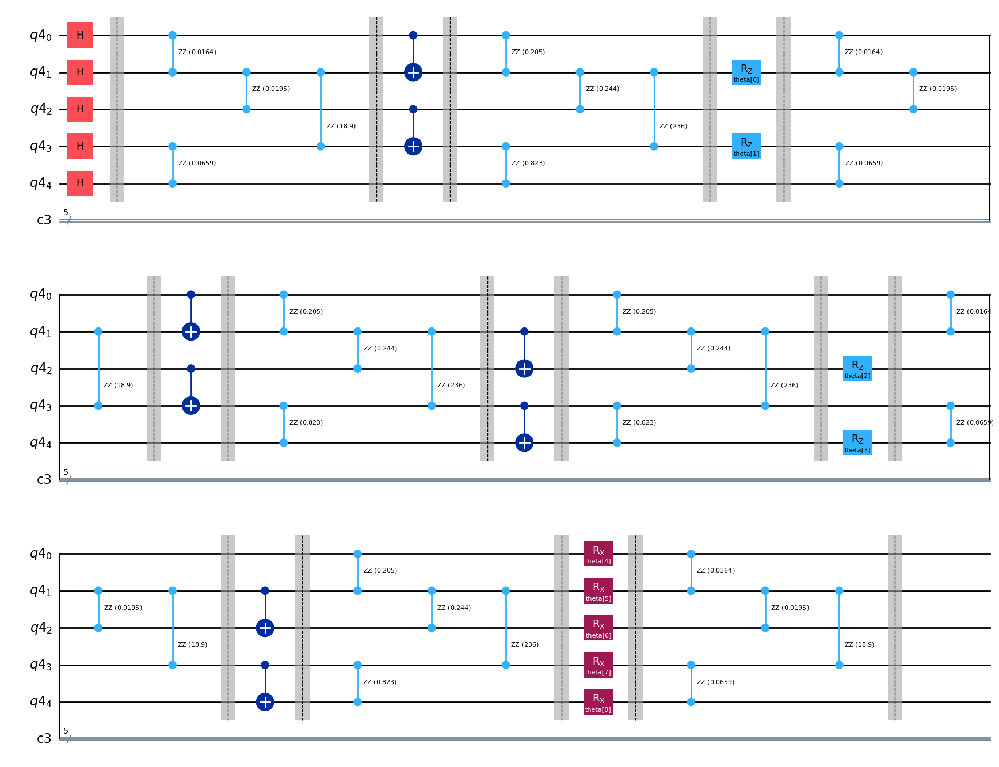

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

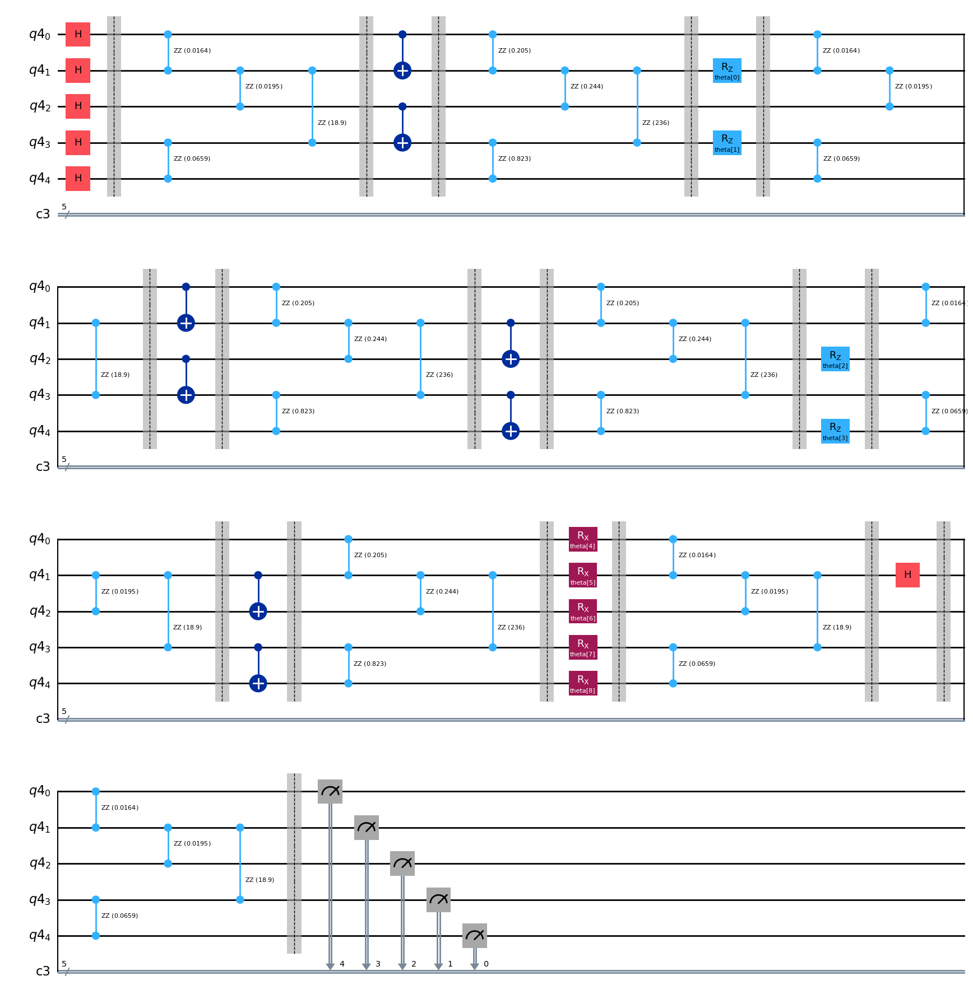

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

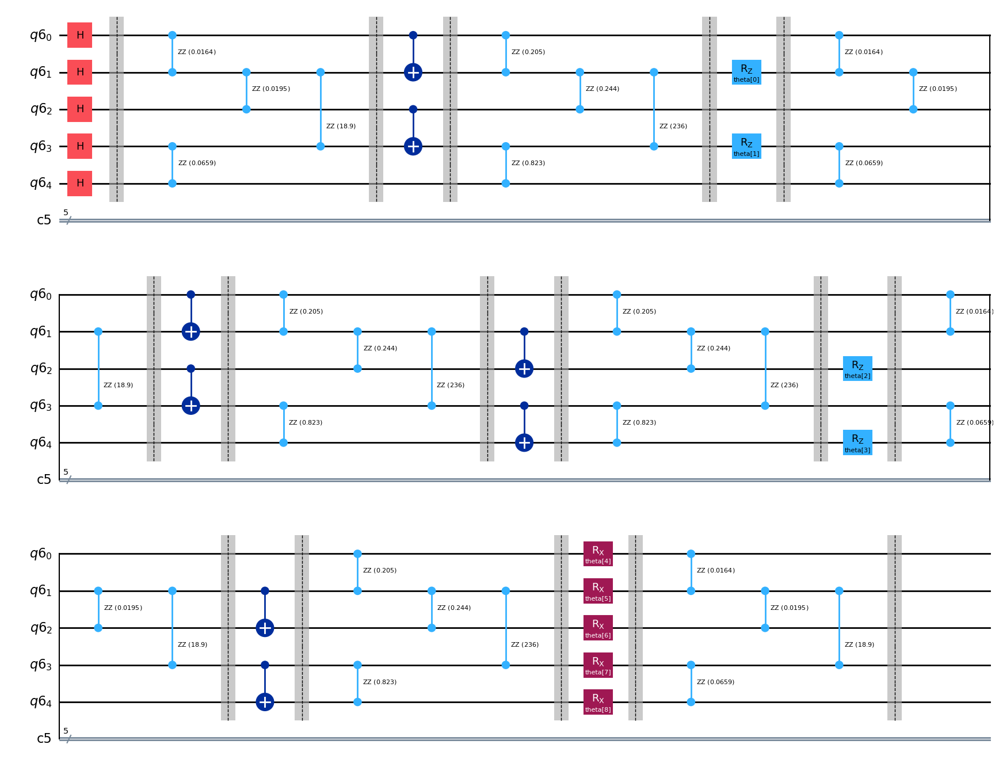

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

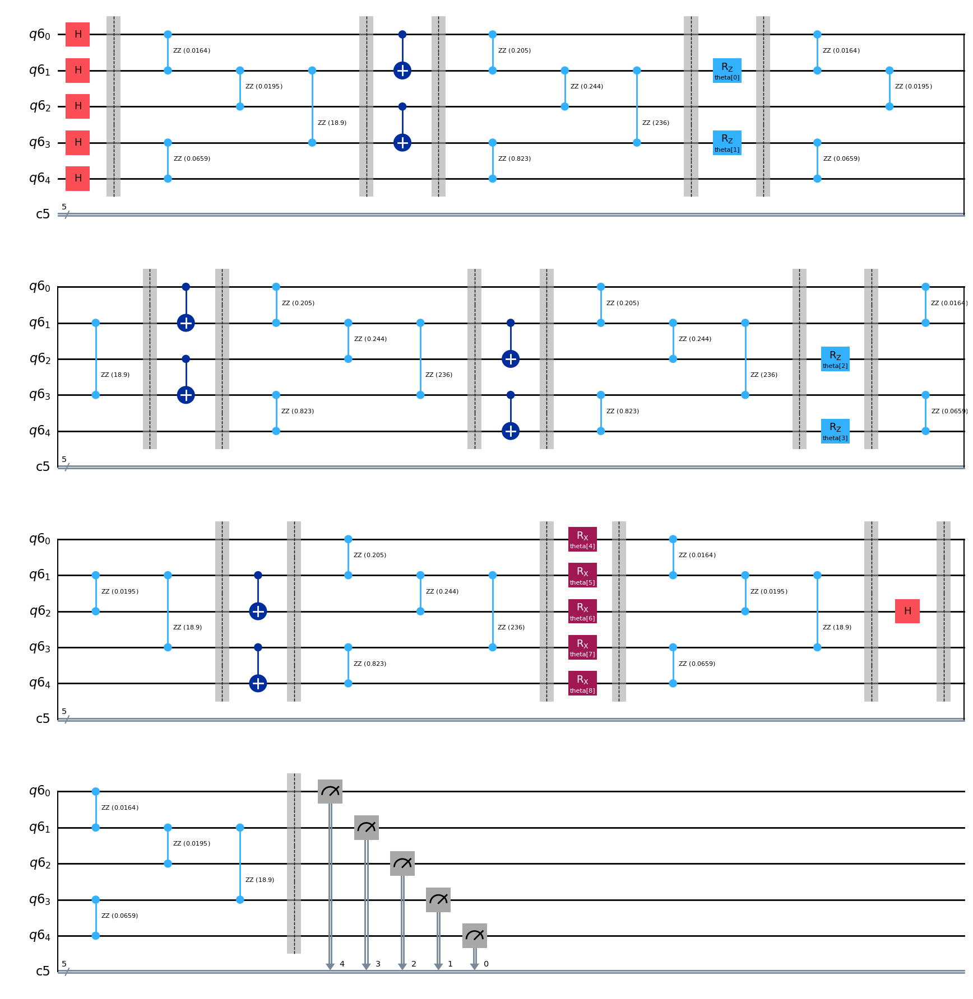

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

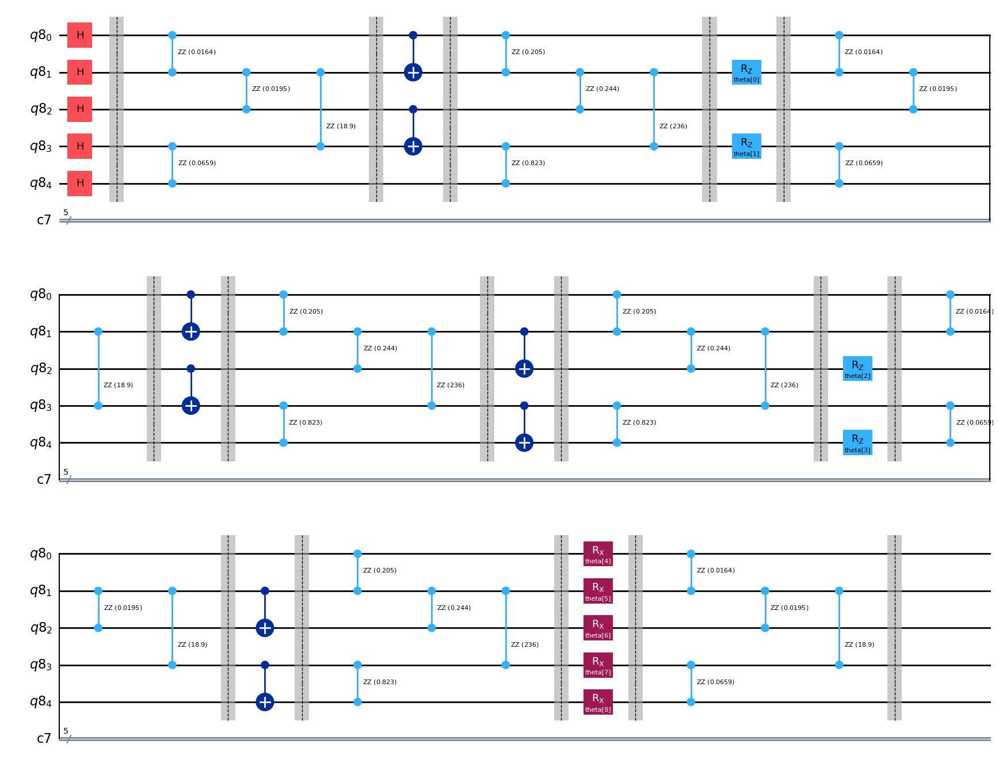

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

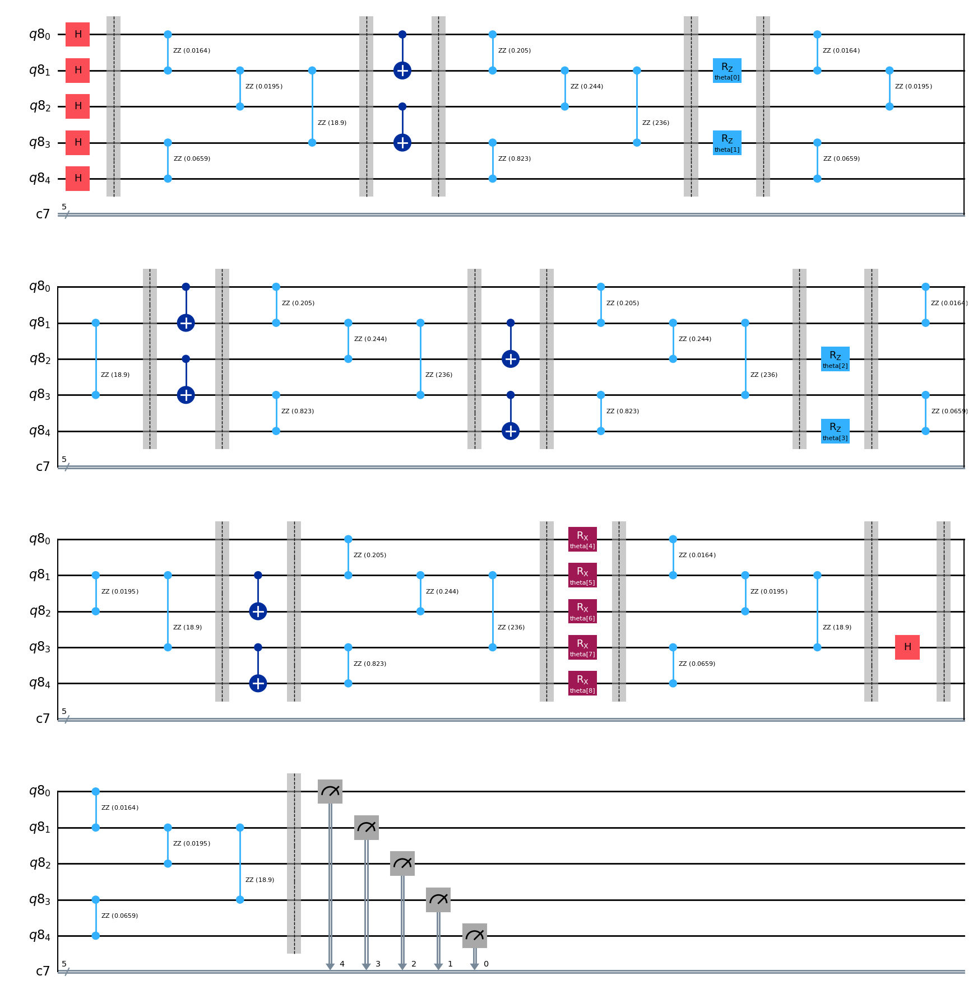

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

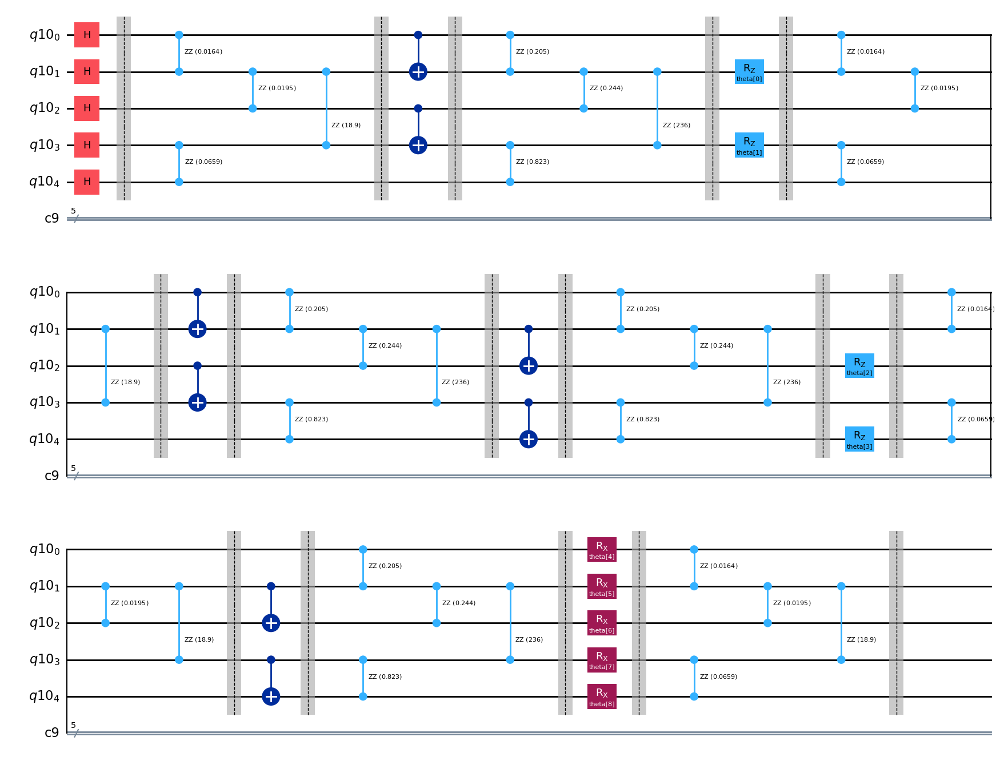

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

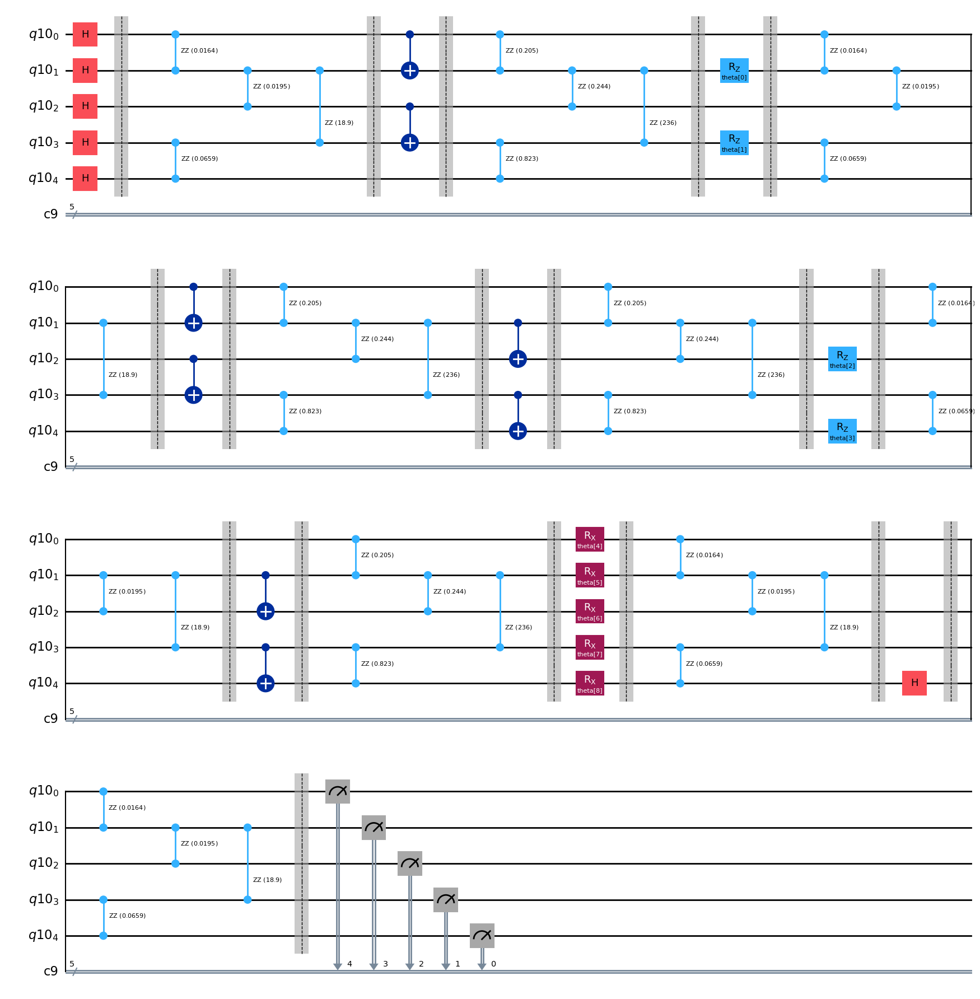

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.9482
-3.8532
-3.9696
-3.812999999999999
-3.7532
-3.7887999999999997
-2.4701999999999997
-3.8032000000000004
-3.922999999999999
-2.5936
-3.8988000000000005
-3.8711999999999995
-3.9007999999999994
-2.8176000000000005
-3.8610000000000007
-3.8579999999999988
-2.6877999999999993
-3.845400000000001
-2.1794
-3.5974000000000013


In [ ]:
lowest_energy_vqe

-3.9696

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.9482
-3.8532
-3.9696
-3.812999999999999
-3.7532
-3.7887999999999997
-2.4701999999999997
-3.8032000000000004
-3.922999999999999
-2.5936
-3.8988000000000005
-3.8711999999999995
-3.9007999999999994
-2.8176000000000005
-3.8610000000000007
-3.8579999999999988
-2.6877999999999993
-3.845400000000001
-2.1794
-3.5974000000000013


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.975311
         Iterations: 6
         Function evaluations: 2540
         Gradient evaluations: 79


<ipython-input-29-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-29-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:9: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-29-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array(

         Current function value: nan
         Iterations: 180
         Function evaluations: 10464
         Gradient evaluations: 327
Optimization terminated successfully.
         Current function value: -4.539158
         Iterations: 63
         Function evaluations: 2944
         Gradient evaluations: 92


<ipython-input-29-942dbc8389c9>:99: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-29-942dbc8389c9>:103: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-26-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-29-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:69: RuntimeWarn

         Current function value: nan
         Iterations: 141
         Function evaluations: 10944
         Gradient evaluations: 342
Optimization terminated successfully.
         Current function value: -5.530920
         Iterations: 152
         Function evaluations: 8192
         Gradient evaluations: 256


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.737409
         Iterations: 300
         Function evaluations: 17120
         Gradient evaluations: 535


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.713313
         Iterations: 184
         Function evaluations: 10283
         Gradient evaluations: 321
Optimization terminated successfully.
         Current function value: -4.566744
         Iterations: 78
         Function evaluations: 3200
         Gradient evaluations: 100


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.887696
         Iterations: 300
         Function evaluations: 12256
         Gradient evaluations: 383


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.697900
         Iterations: 79
         Function evaluations: 5670
         Gradient evaluations: 177


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.558895
         Iterations: 96
         Function evaluations: 6599
         Gradient evaluations: 206


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.113276
         Iterations: 27
         Function evaluations: 3724
         Gradient evaluations: 116


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.711849
         Iterations: 300
         Function evaluations: 14784
         Gradient evaluations: 462


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.892293
         Iterations: 114
         Function evaluations: 8169
         Gradient evaluations: 255
Optimization terminated successfully.
         Current function value: -6.316346
         Iterations: 172
         Function evaluations: 10944
         Gradient evaluations: 342


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.877204
         Iterations: 194
         Function evaluations: 10184
         Gradient evaluations: 318


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.874444
         Iterations: 141
         Function evaluations: 9993
         Gradient evaluations: 312


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.287293
         Iterations: 73
         Function evaluations: 4745
         Gradient evaluations: 148
Optimization terminated successfully.
         Current function value: -6.141276
         Iterations: 58
         Function evaluations: 2784
         Gradient evaluations: 87
         Current function value: -6.893890
         Iterations: 300
         Function evaluations: 16224
         Gradient evaluations: 507


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-7.737409023813882

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.9482
-3.8532
-3.9696
-3.812999999999999
-3.7532
-3.7887999999999997
-2.4701999999999997
-3.8032000000000004
-3.922999999999999
-2.5936
-3.8988000000000005
-3.8711999999999995
-3.9007999999999994
-2.8176000000000005
-3.8610000000000007
-3.8579999999999988
-2.6877999999999993
-3.845400000000001
-2.1794
-3.5974000000000013


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.001744
         Iterations: 130
         Function evaluations: 17108
         Gradient evaluations: 300


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.635438
         Iterations: 57
         Function evaluations: 10041
         Gradient evaluations: 176


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.712118
         Iterations: 139
         Function evaluations: 14200
         Gradient evaluations: 249


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.841723
         Iterations: 36
         Function evaluations: 6337
         Gradient evaluations: 111


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.882000
         Iterations: 141
         Function evaluations: 14319
         Gradient evaluations: 251


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.045662
         Iterations: 300
         Function evaluations: 23256
         Gradient evaluations: 408


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.267785
         Iterations: 26
         Function evaluations: 5134
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: -4.554044
         Iterations: 169
         Function evaluations: 12084
         Gradient evaluations: 212


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.599325
         Iterations: 83
         Function evaluations: 14093
         Gradient evaluations: 247


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.774828
         Iterations: 179
         Function evaluations: 21039
         Gradient evaluations: 369


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.708693
         Iterations: 243
         Function evaluations: 20753
         Gradient evaluations: 364


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.503792
         Iterations: 75
         Function evaluations: 13571
         Gradient evaluations: 238


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.907060
         Iterations: 300
         Function evaluations: 29070
         Gradient evaluations: 510


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219857
         Iterations: 130
         Function evaluations: 16085
         Gradient evaluations: 282


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.841225
         Iterations: 211
         Function evaluations: 27764
         Gradient evaluations: 487


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.296767
         Iterations: 188
         Function evaluations: 18246
         Gradient evaluations: 320


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.797167
         Iterations: 50
         Function evaluations: 7414
         Gradient evaluations: 130


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.983651
         Iterations: 19
         Function evaluations: 4857
         Gradient evaluations: 85


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.194154
         Iterations: 300
         Function evaluations: 28272
         Gradient evaluations: 496
         Current function value: -6.879687
         Iterations: 300
         Function evaluations: 23997
         Gradient evaluations: 421


In [ ]:
lowest_energy_vqnhe

-7.712117502312208

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.9482
-3.8532
-3.9696
-3.812999999999999
-3.7532
-3.7887999999999997
-2.4701999999999997
-3.8032000000000004
-3.922999999999999
-2.5936
-3.8988000000000005
-3.8711999999999995
-3.9007999999999994
-2.8176000000000005
-3.8610000000000007
-3.8579999999999988
-2.6877999999999993
-3.845400000000001
-2.1794
-3.5974000000000013
Optimization terminated successfully.
         Current function value: -4.904241
         Iterations: 100
         Function evaluations: 7645
         Gradient evaluations: 139
Optimization terminated successfully.
         Current function value: -4.849130
         Iterations: 47
         Function evaluations: 5665
         Gradient evaluations: 103


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.967372
         Iterations: 20
         Function evaluations: 5896
         Gradient evaluations: 107


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.412088
         Iterations: 54
         Function evaluations: 7602
         Gradient evaluations: 138
Optimization terminated successfully.
         Current function value: -3.974334
         Iterations: 9
         Function evaluations: 715
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: -4.910850
         Iterations: 152
         Function evaluations: 10890
         Gradient evaluations: 198
Optimization terminated successfully.
         Current function value: -4.983100
         Iterations: 55
         Function evaluations: 5940
         Gradient evaluations: 108
Optimization terminated successfully.
         Current function value: -4.901298
         Iterations: 100
         Function evaluations: 8910
         Gradient evaluations: 162
Optimization terminated successfully.
         Current function value: -3.969600
         Iterations: 1
         Function evaluations: 110
         Gradient e

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.273846
         Iterations: 10
         Function evaluations: 4625
         Gradient evaluations: 84


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.862255
         Iterations: 84
         Function evaluations: 14586
         Gradient evaluations: 265
Optimization terminated successfully.
         Current function value: -4.912498
         Iterations: 78
         Function evaluations: 4730
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -4.390611
         Iterations: 57
         Function evaluations: 5720
         Gradient evaluations: 104


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.850479
         Iterations: 36
         Function evaluations: 8865
         Gradient evaluations: 161
Optimization terminated successfully.
         Current function value: -4.913359
         Iterations: 65
         Function evaluations: 7370
         Gradient evaluations: 134
         Current function value: -4.306346
         Iterations: 20
         Function evaluations: 8537
         Gradient evaluations: 155


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-4.9830999264279505

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 4MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 4MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.004                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23216991 5.13783009]
[10.16011766 10.37023248  9.97051986]
0.00023248175262313708
[5.13810659 4.98789341]
[ 9.97039449 10.12627545  9.66838006]
0.00027545148515972784
[4.98741987 5.01558013]
[ 9.97042485 10.15324958  9.72293557]
0.15024957603883315
[5.01494009 5.28205991]
[ 9.72295425 10.29792234 10.26013341]
0.0009223445172645839


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(0.00011624087631156854,
 0.00013772574257986392,
 0.07512478801941658,
 0.00046117225863229194)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

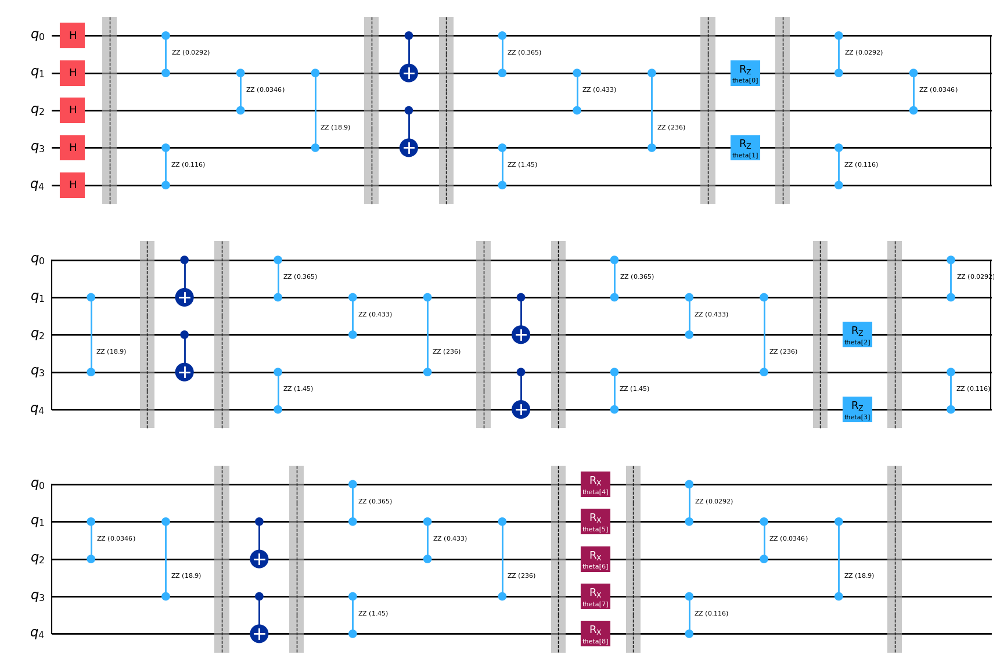

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

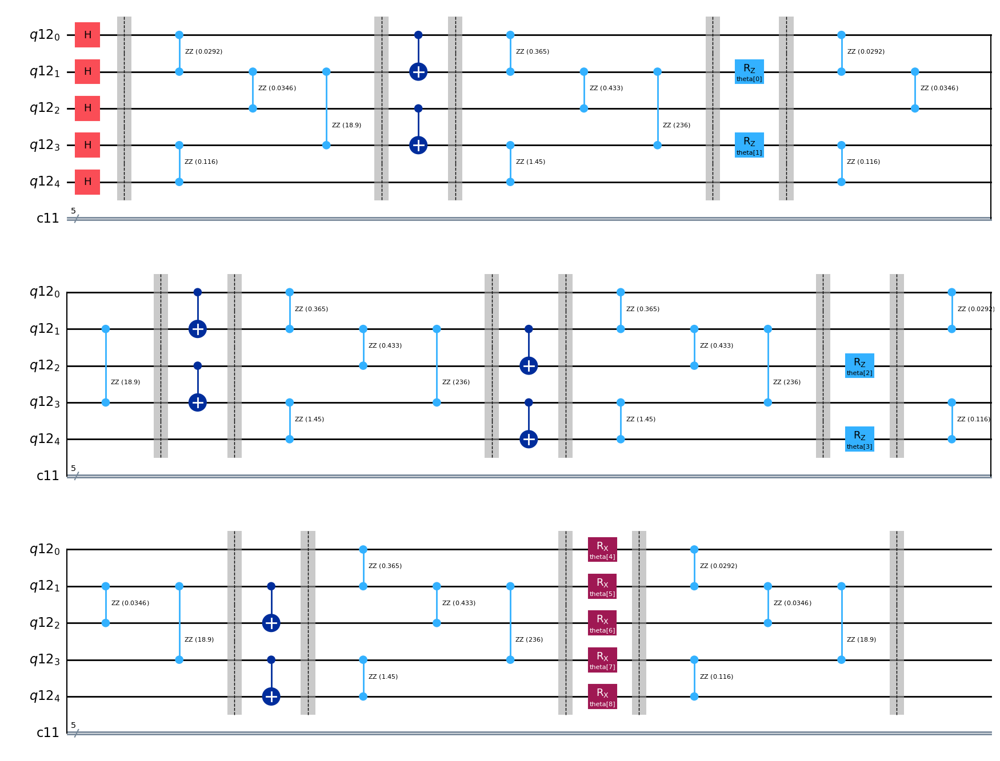

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

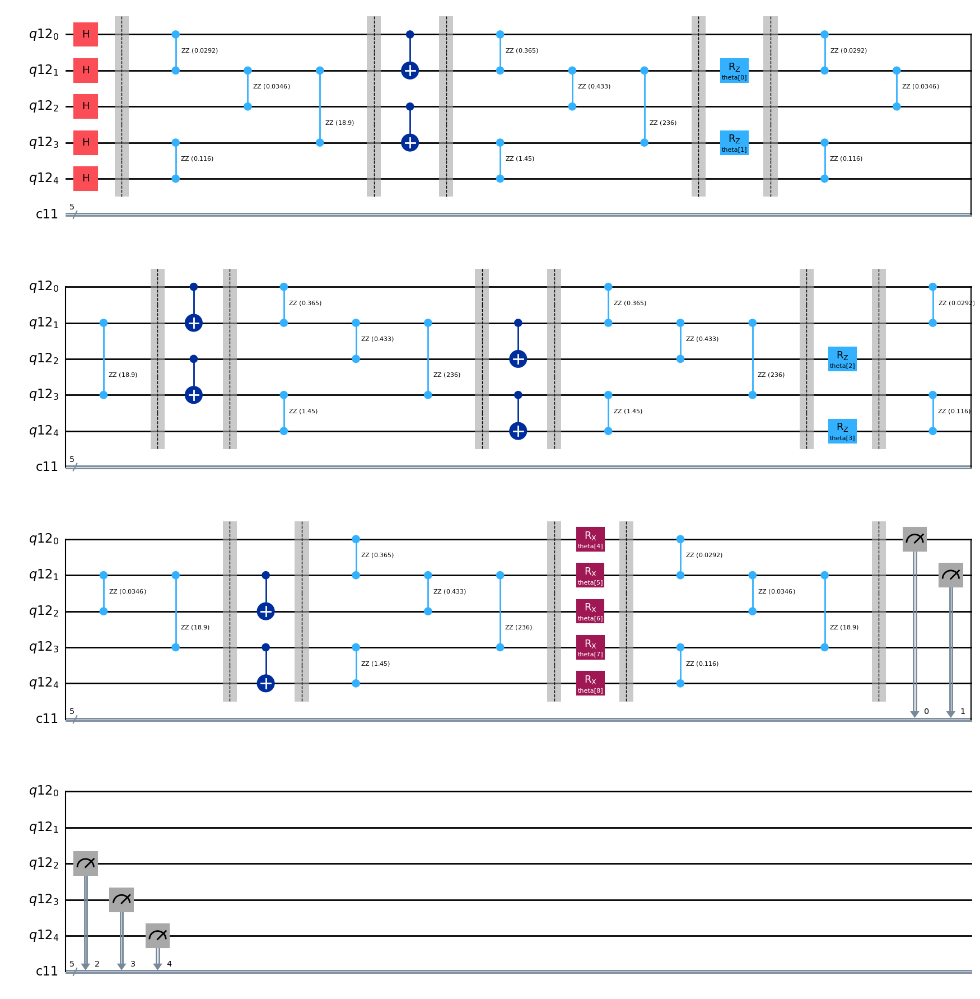

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

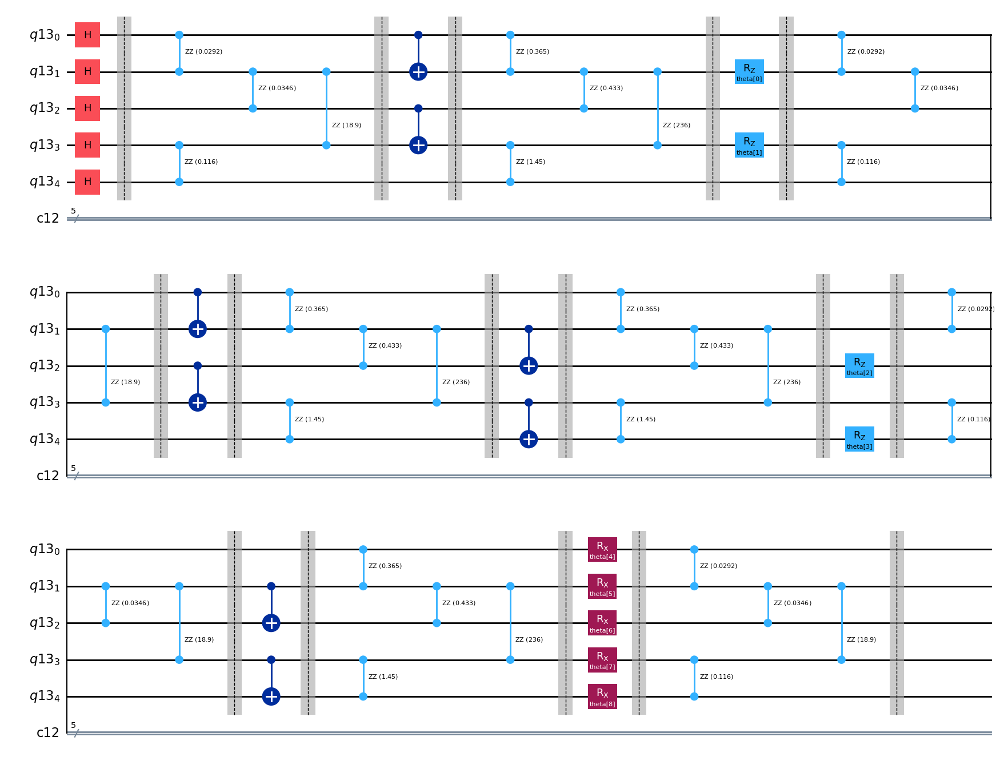

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

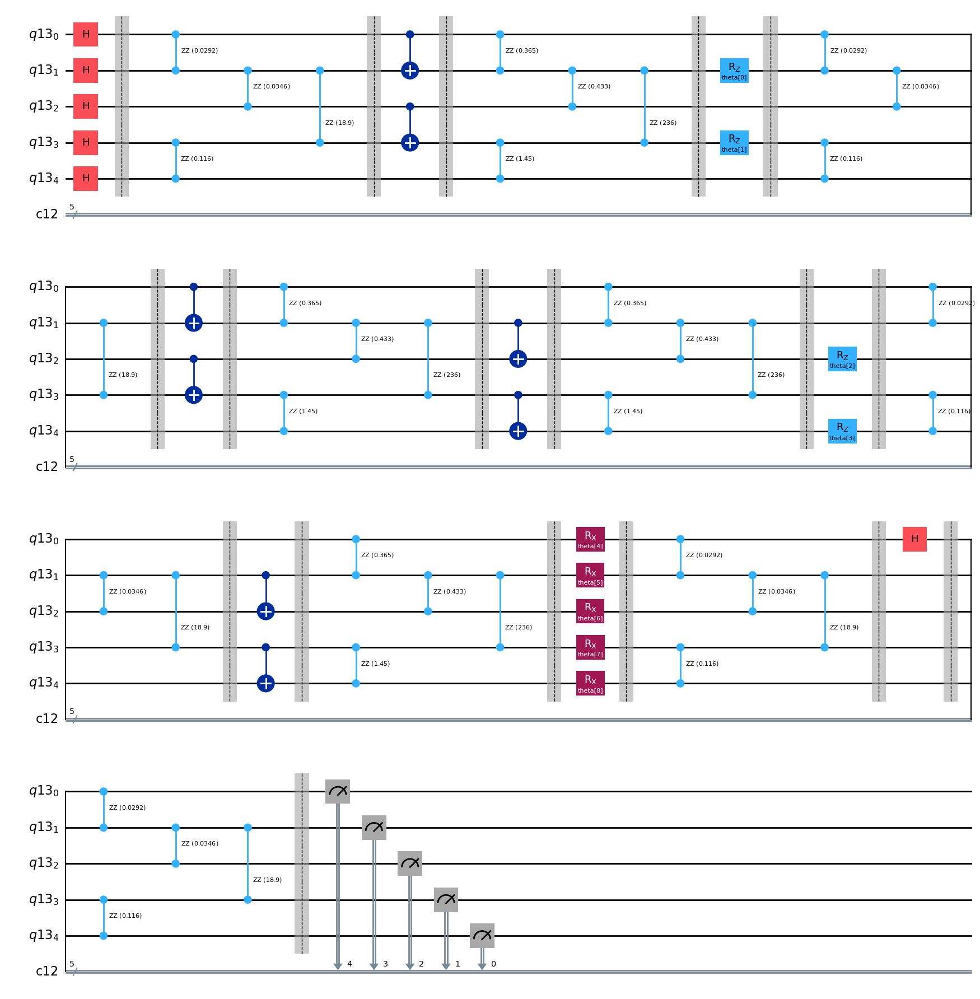

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

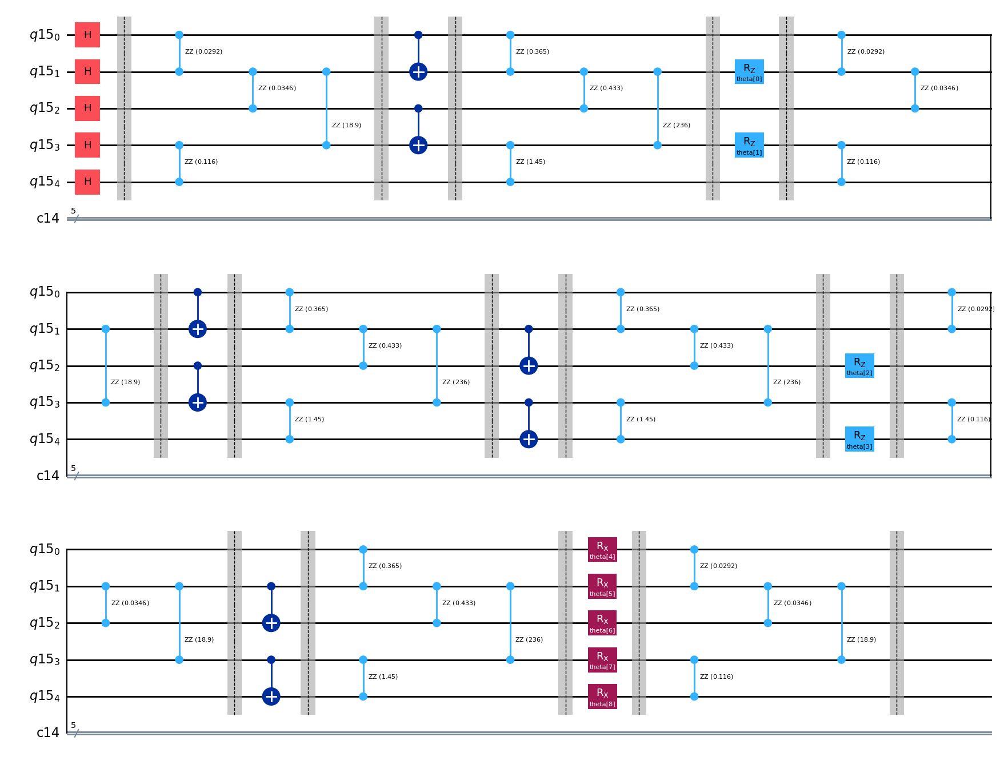

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

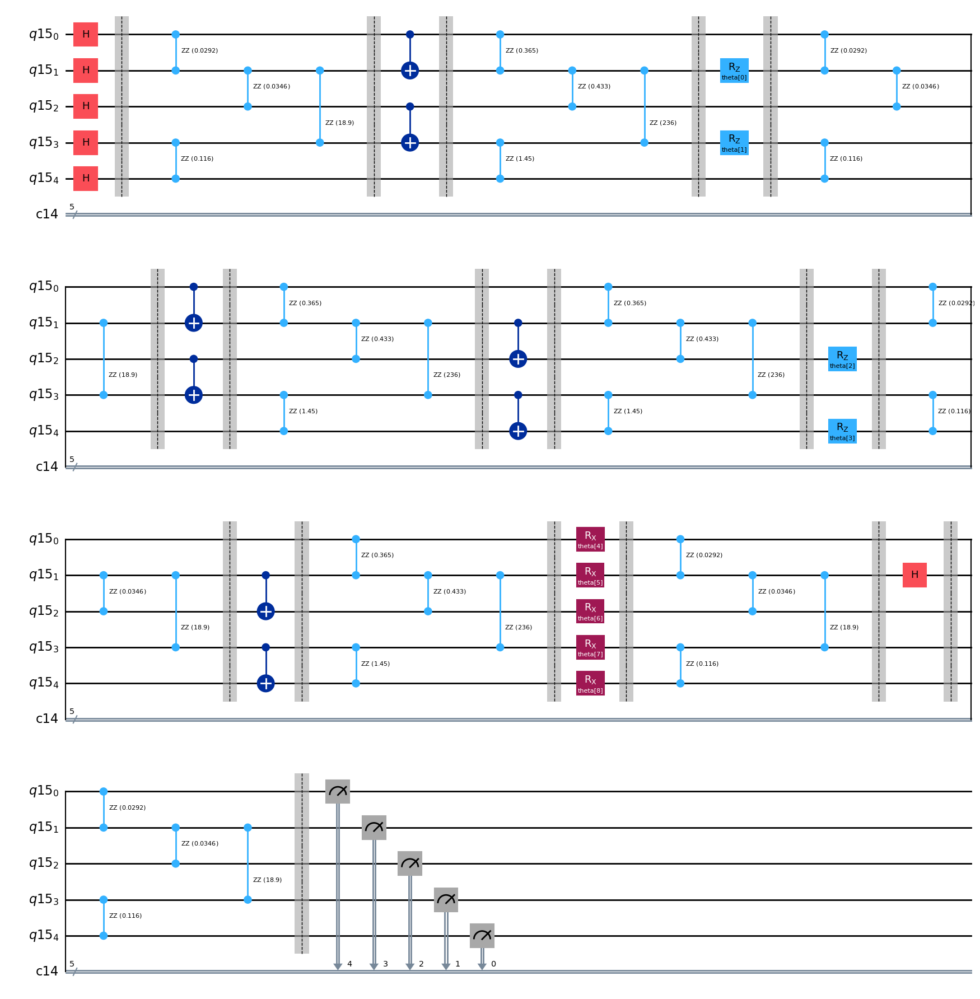

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

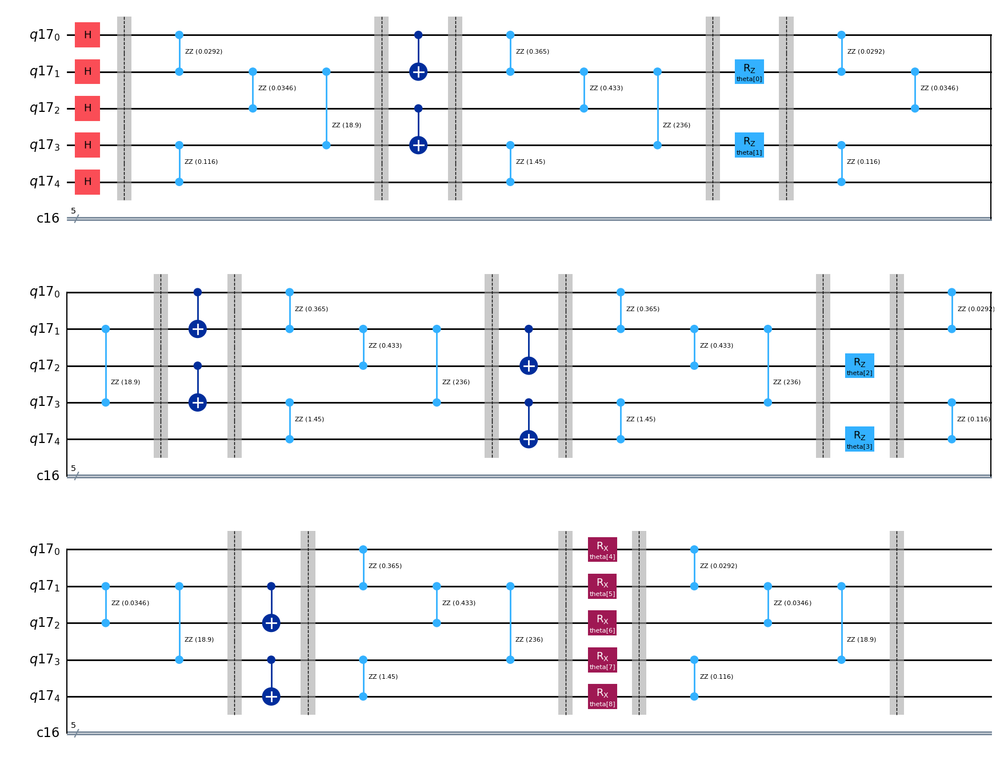

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

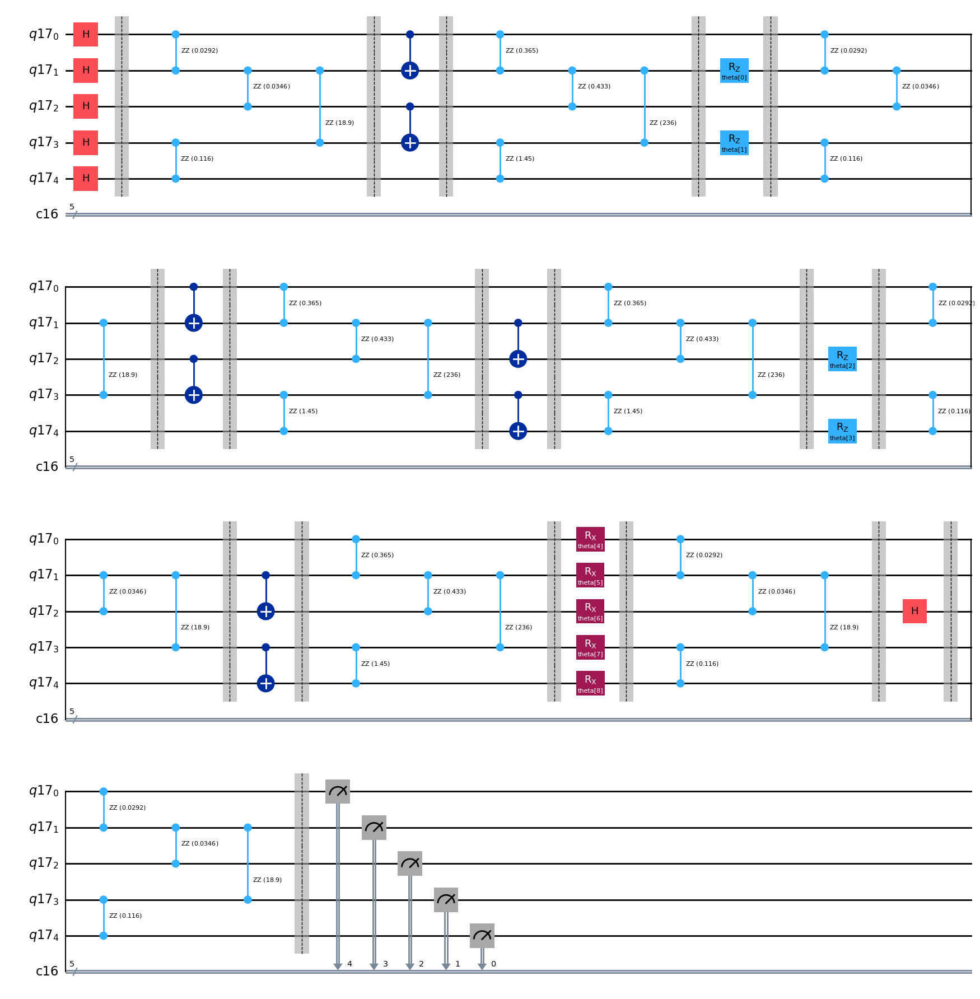

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

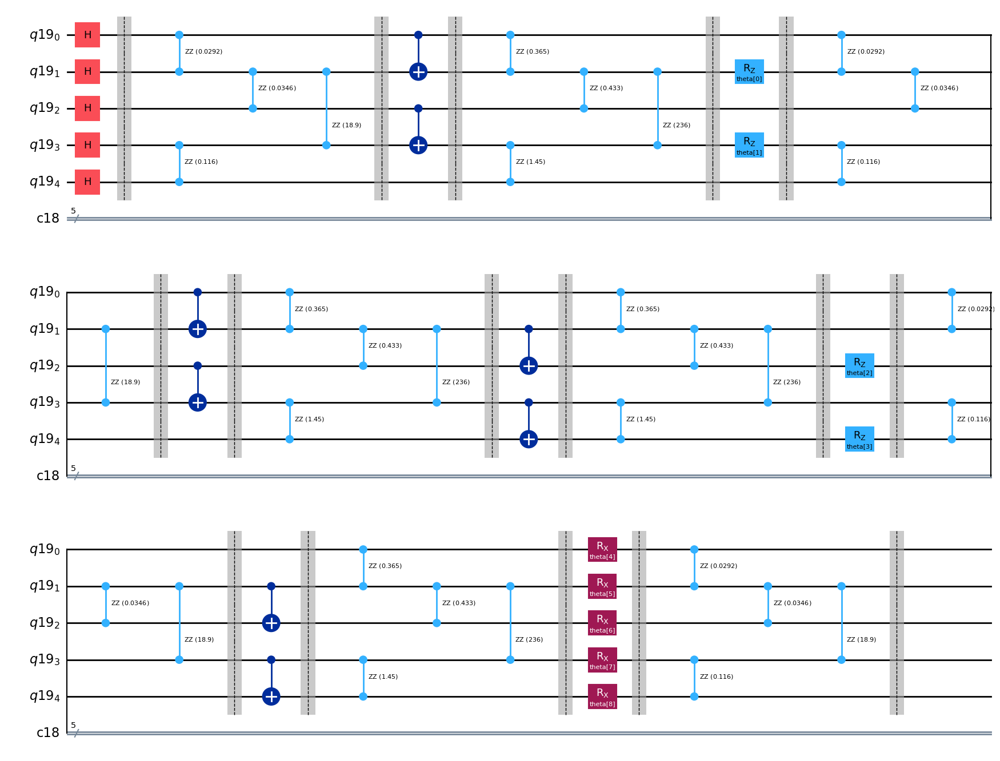

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

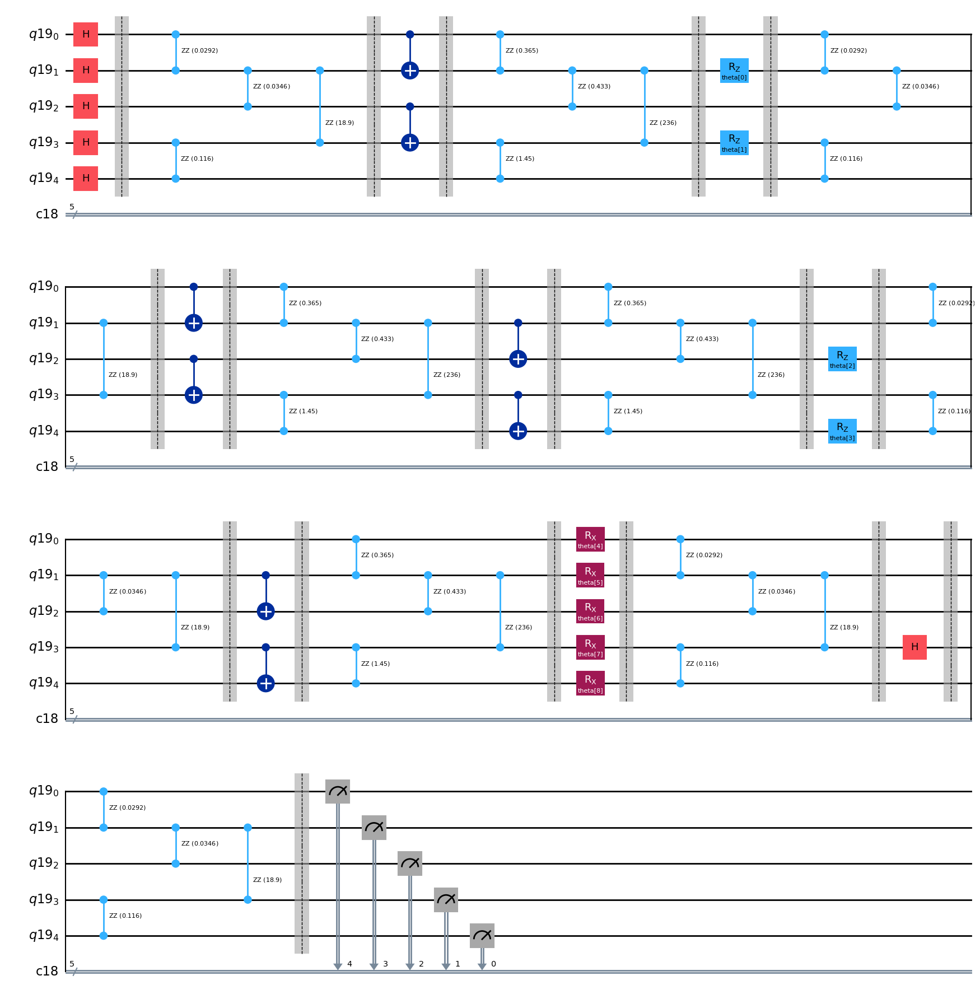

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

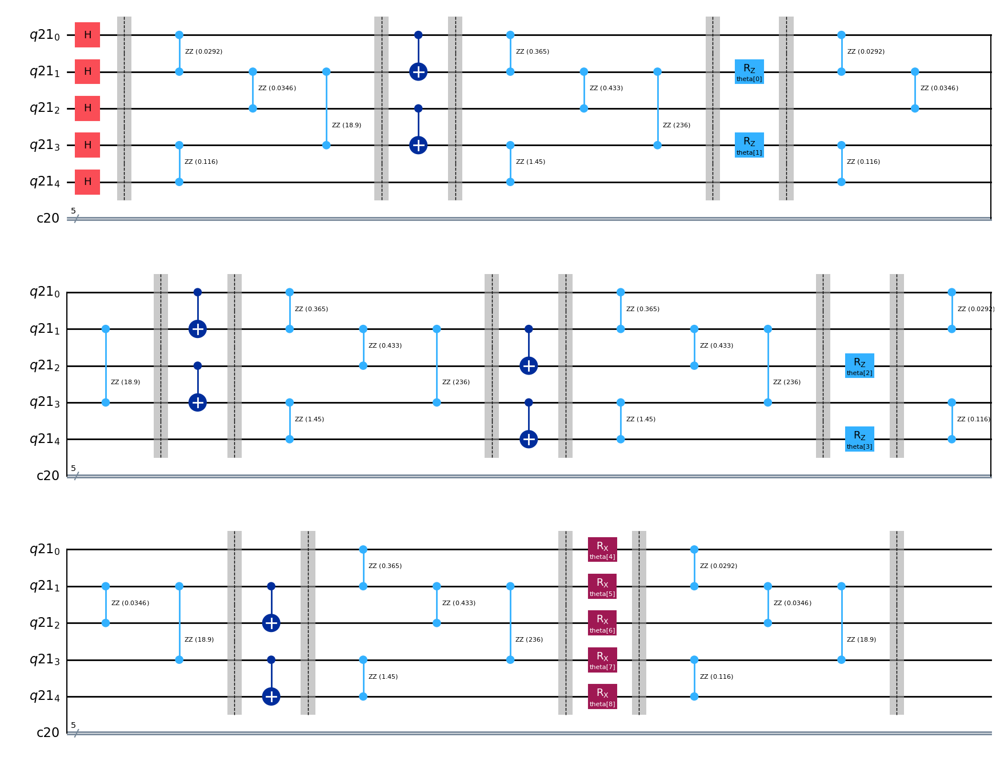

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

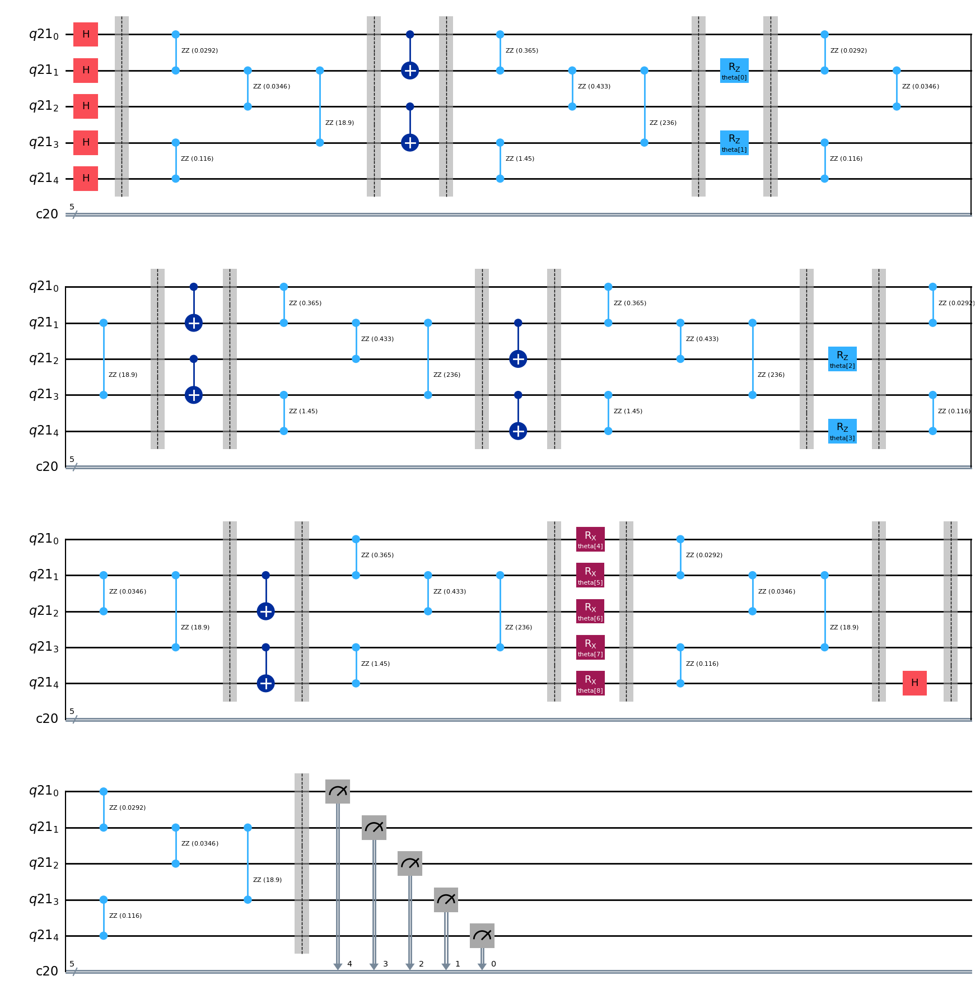

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-2.2208000000000006
-2.0348000000000006
-2.2172000000000005
-1.7515999999999996
-2.2368
-2.0748
-2.1728000000000005
-2.2012
-2.1894000000000005
-2.0704000000000002
-2.2246
-1.556
-1.7806000000000002
-1.7827999999999993
-2.1988000000000003
-2.1982000000000004
-2.192
-1.4160000000000001
-1.7675999999999996
-2.0706


In [ ]:
lowest_energy_vqe

-2.2368

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2208000000000006
-2.0348000000000006
-2.2172000000000005
-1.7515999999999996
-2.2368
-2.0748
-2.1728000000000005
-2.2012
-2.1894000000000005
-2.0704000000000002
-2.2246
-1.556
-1.7806000000000002
-1.7827999999999993
-2.1988000000000003
-2.1982000000000004
-2.192
-1.4160000000000001
-1.7675999999999996
-2.0706
Optimization terminated successfully.
         Current function value: -3.055092
         Iterations: 37
         Function evaluations: 2080
         Gradient evaluations: 65


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.985751
         Iterations: 33
         Function evaluations: 4204
         Gradient evaluations: 131


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.208421
         Iterations: 225
         Function evaluations: 13580
         Gradient evaluations: 424
Optimization terminated successfully.
         Current function value: -4.246224
         Iterations: 57
         Function evaluations: 2592
         Gradient evaluations: 81


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.129990
         Iterations: 33
         Function evaluations: 3656
         Gradient evaluations: 114


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.711655
         Iterations: 88
         Function evaluations: 4960
         Gradient evaluations: 155


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.356234
         Iterations: 175
         Function evaluations: 11712
         Gradient evaluations: 366
Optimization terminated successfully.
         Current function value: -2.825411
         Iterations: 21
         Function evaluations: 864
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: -5.798044
         Iterations: 189
         Function evaluations: 8672
         Gradient evaluations: 271
Optimization terminated successfully.
         Current function value: -4.673119
         Iterations: 123
         Function evaluations: 8256
         Gradient evaluations: 258


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.344943
         Iterations: 79
         Function evaluations: 7050
         Gradient evaluations: 220


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.657768
         Iterations: 154
         Function evaluations: 8651
         Gradient evaluations: 270


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.142783
         Iterations: 176
         Function evaluations: 8074
         Gradient evaluations: 252


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.788906
         Iterations: 74
         Function evaluations: 3680
         Gradient evaluations: 115


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.343798
         Iterations: 19
         Function evaluations: 1928
         Gradient evaluations: 60


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.911036
         Iterations: 89
         Function evaluations: 4256
         Gradient evaluations: 133


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.108869
         Iterations: 40
         Function evaluations: 3337
         Gradient evaluations: 104


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.017010
         Iterations: 300
         Function evaluations: 14880
         Gradient evaluations: 465
         Current function value: -6.081095
         Iterations: 300
         Function evaluations: 13984
         Gradient evaluations: 437
Optimization terminated successfully.
         Current function value: -4.106364
         Iterations: 93
         Function evaluations: 4480
         Gradient evaluations: 140


In [ ]:
lowest_energy_vqnhe

-8.142782873975161

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2208000000000006
-2.0348000000000006
-2.2172000000000005
-1.7515999999999996
-2.2368
-2.0748
-2.1728000000000005
-2.2012
-2.1894000000000005
-2.0704000000000002
-2.2246
-1.556
-1.7806000000000002
-1.7827999999999993
-2.1988000000000003
-2.1982000000000004
-2.192
-1.4160000000000001
-1.7675999999999996
-2.0706
Optimization terminated successfully.
         Current function value: -4.929293
         Iterations: 23
         Function evaluations: 2907
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: -3.365280
         Iterations: 50
         Function evaluations: 8778
         Gradient evaluations: 154
Optimization terminated successfully.
         Current function value: -4.138836
         Iterations: 42
         Function evaluations: 2736
         Gradient evaluations: 48


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.077860
         Iterations: 65
         Function evaluations: 7647
         Gradient evaluations: 134


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.214391
         Iterations: 300
         Function evaluations: 28044
         Gradient evaluations: 492


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.044006
         Iterations: 140
         Function evaluations: 18135
         Gradient evaluations: 318


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.173925
         Iterations: 56
         Function evaluations: 6453
         Gradient evaluations: 113


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.212634
         Iterations: 146
         Function evaluations: 16940
         Gradient evaluations: 297


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.142813
         Iterations: 73
         Function evaluations: 9360
         Gradient evaluations: 164


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.829760
         Iterations: 93
         Function evaluations: 9120
         Gradient evaluations: 160


<ipython-input-62-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-65-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-65-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-65-942dbc8389c9>:82: RuntimeWarning: inva

         Current function value: nan
         Iterations: 23
         Function evaluations: 8607
         Gradient evaluations: 151


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.679064
         Iterations: 38
         Function evaluations: 5594
         Gradient evaluations: 98


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.056913
         Iterations: 65
         Function evaluations: 5529
         Gradient evaluations: 97


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.291779
         Iterations: 27
         Function evaluations: 6789
         Gradient evaluations: 119
Optimization terminated successfully.
         Current function value: -8.142814
         Iterations: 93
         Function evaluations: 7581
         Gradient evaluations: 133


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.199511
         Iterations: 37
         Function evaluations: 6567
         Gradient evaluations: 115


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.497498
         Iterations: 197
         Function evaluations: 21045
         Gradient evaluations: 369


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.797205
         Iterations: 18
         Function evaluations: 5020
         Gradient evaluations: 88


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.923447
         Iterations: 26
         Function evaluations: 4629
         Gradient evaluations: 81
         Current function value: -8.262173
         Iterations: 109
         Function evaluations: 12540
         Gradient evaluations: 220


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-8.26217349170522

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2208000000000006
-2.0348000000000006
-2.2172000000000005
-1.7515999999999996
-2.2368
-2.0748
-2.1728000000000005
-2.2012
-2.1894000000000005
-2.0704000000000002
-2.2246
-1.556
-1.7806000000000002
-1.7827999999999993
-2.1988000000000003
-2.1982000000000004
-2.192
-1.4160000000000001
-1.7675999999999996
-2.0706


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.757366
         Iterations: 131
         Function evaluations: 12166
         Gradient evaluations: 221


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.744890
         Iterations: 31
         Function evaluations: 7321
         Gradient evaluations: 133


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.034481
         Iterations: 201
         Function evaluations: 18865
         Gradient evaluations: 343
Optimization terminated successfully.
         Current function value: -2.260035
         Iterations: 19
         Function evaluations: 1100
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: -2.260034
         Iterations: 15
         Function evaluations: 880
         Gradient evaluations: 16


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.520313
         Iterations: 67
         Function evaluations: 8977
         Gradient evaluations: 163
Optimization terminated successfully.
         Current function value: -3.451804
         Iterations: 48
         Function evaluations: 6160
         Gradient evaluations: 112
Optimization terminated successfully.
         Current function value: -3.451782
         Iterations: 34
         Function evaluations: 2530
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: -2.236800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.740964
         Iterations: 69
         Function evaluations: 6600
         Gradient evaluations: 120


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.761456
         Iterations: 75
         Function evaluations: 9903
         Gradient evaluations: 180


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.896611
         Iterations: 40
         Function evaluations: 9362
         Gradient evaluations: 170


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.746813
         Iterations: 88
         Function evaluations: 11177
         Gradient evaluations: 203
Optimization terminated successfully.
         Current function value: -2.874311
         Iterations: 50
         Function evaluations: 3575
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: -3.528429
         Iterations: 54
         Function evaluations: 4015
         Gradient evaluations: 73


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.760899
         Iterations: 103
         Function evaluations: 9582
         Gradient evaluations: 174
Optimization terminated successfully.
         Current function value: -3.200534
         Iterations: 44
         Function evaluations: 5005
         Gradient evaluations: 91


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.752222
         Iterations: 76
         Function evaluations: 8482
         Gradient evaluations: 154


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.743548
         Iterations: 25
         Function evaluations: 7213
         Gradient evaluations: 131
         Current function value: -3.279239
         Iterations: 78
         Function evaluations: 9802
         Gradient evaluations: 178


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-4.034481323350108

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 5MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 5MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.005                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23226521 5.13773479]
[10.16003217 10.37036306  9.97047477]
0.0003630638566862743
[5.13816648 4.98783352]
[ 9.97027925 10.12643004  9.66834071]
0.0004300374654215844
[4.98710382 5.01589618]
[ 9.97032659 10.15338971  9.7228937 ]
0.1503897148456499
[5.0149064 5.2820936]
[ 9.72292289 10.29842297 10.25966414]
0.0014229718621754373


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(0.00018153192834313714,
 0.0002150187327107922,
 0.07519485742282495,
 0.0007114859310877186)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

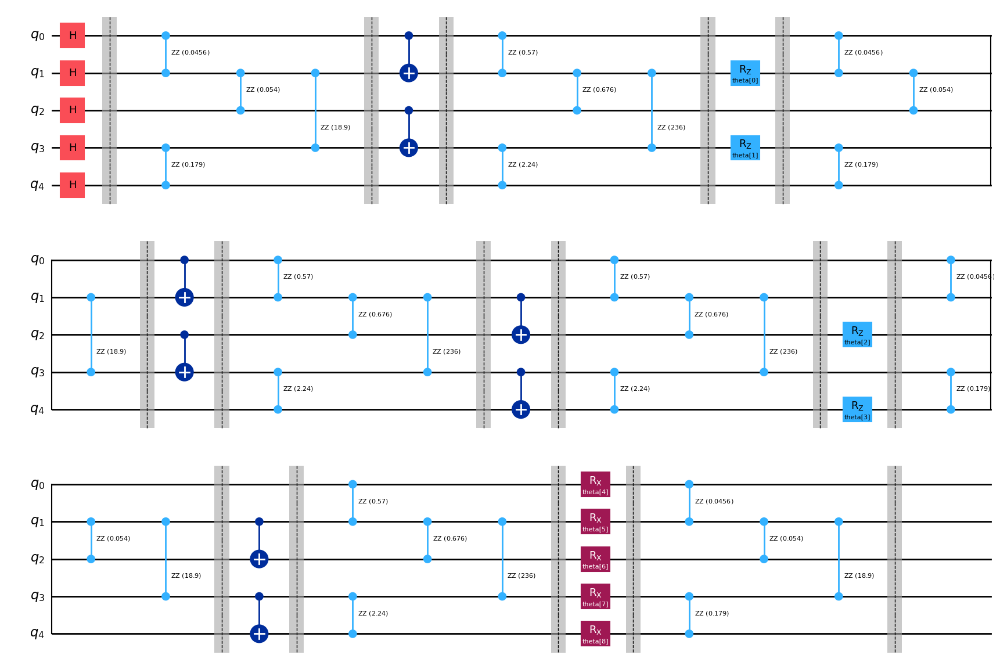

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

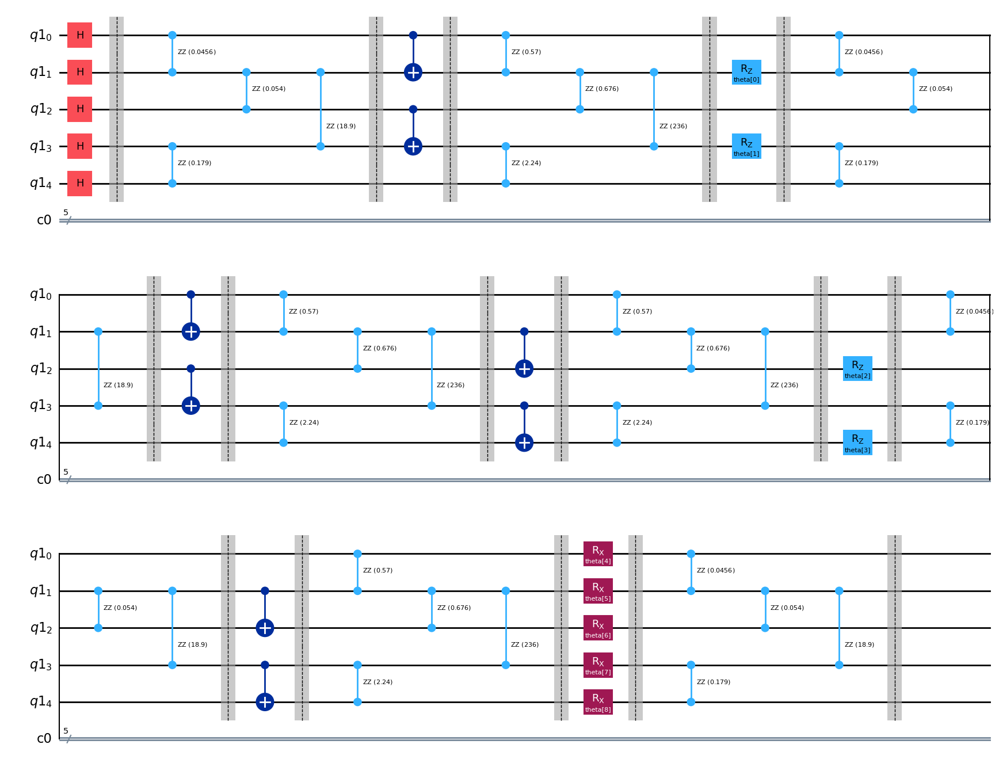

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

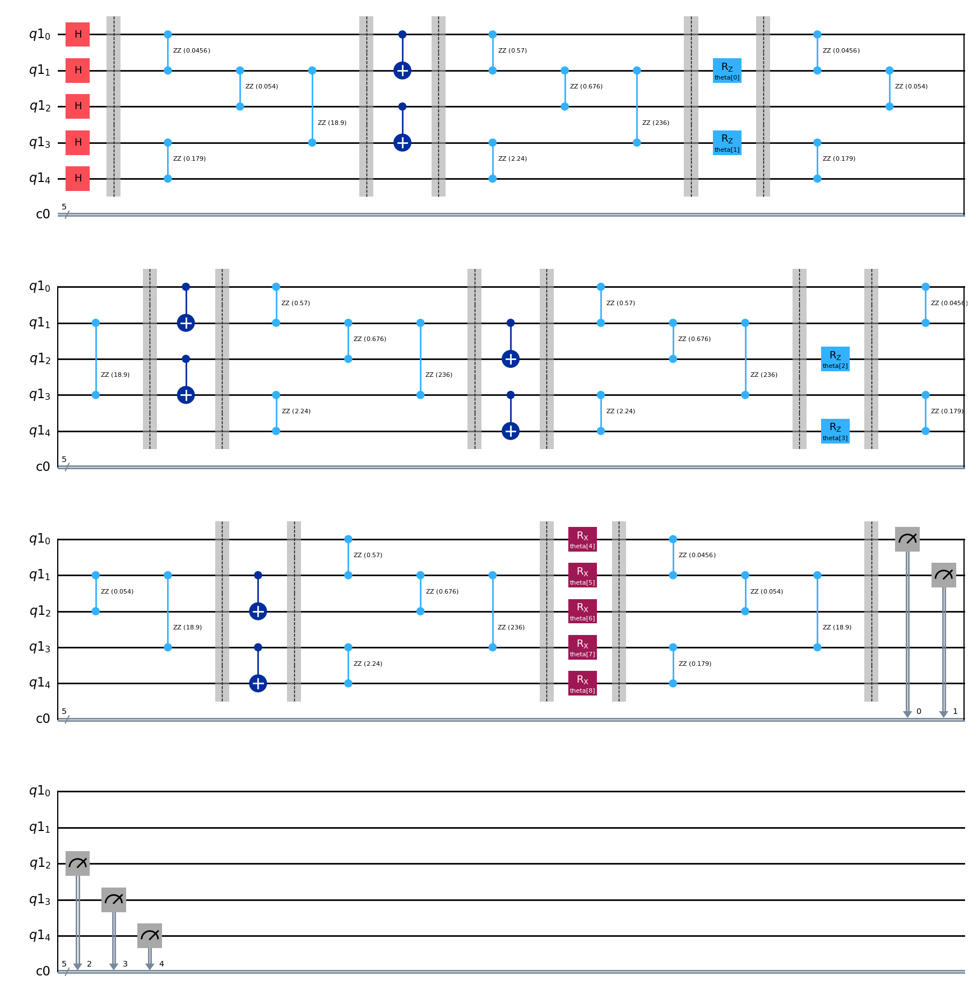

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

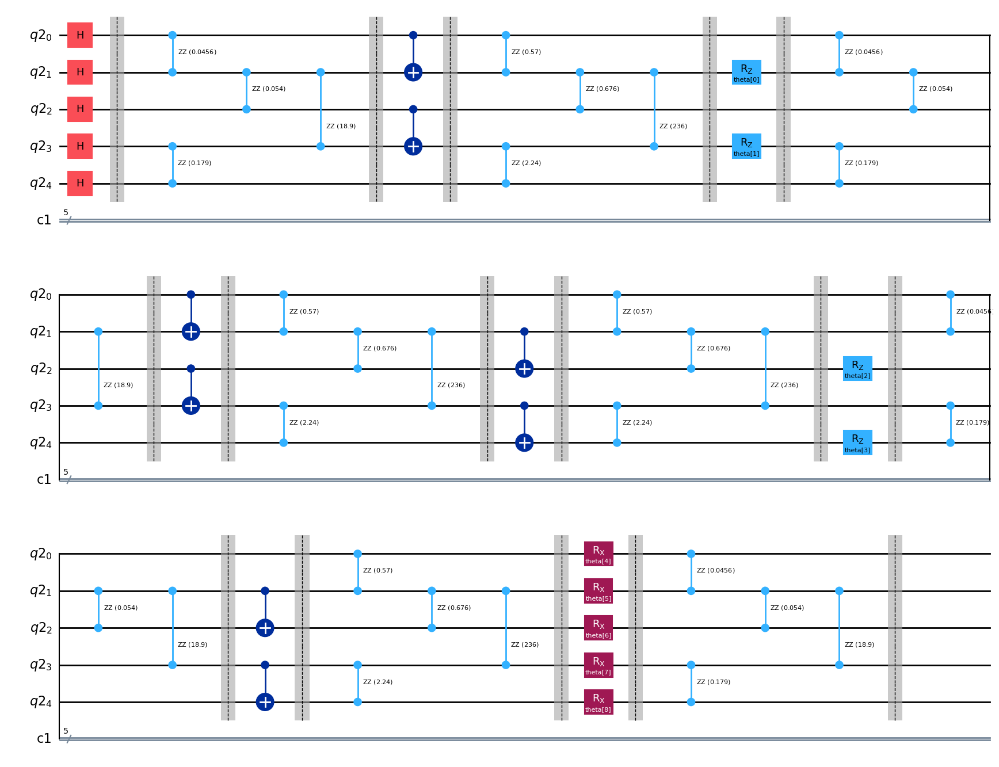

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

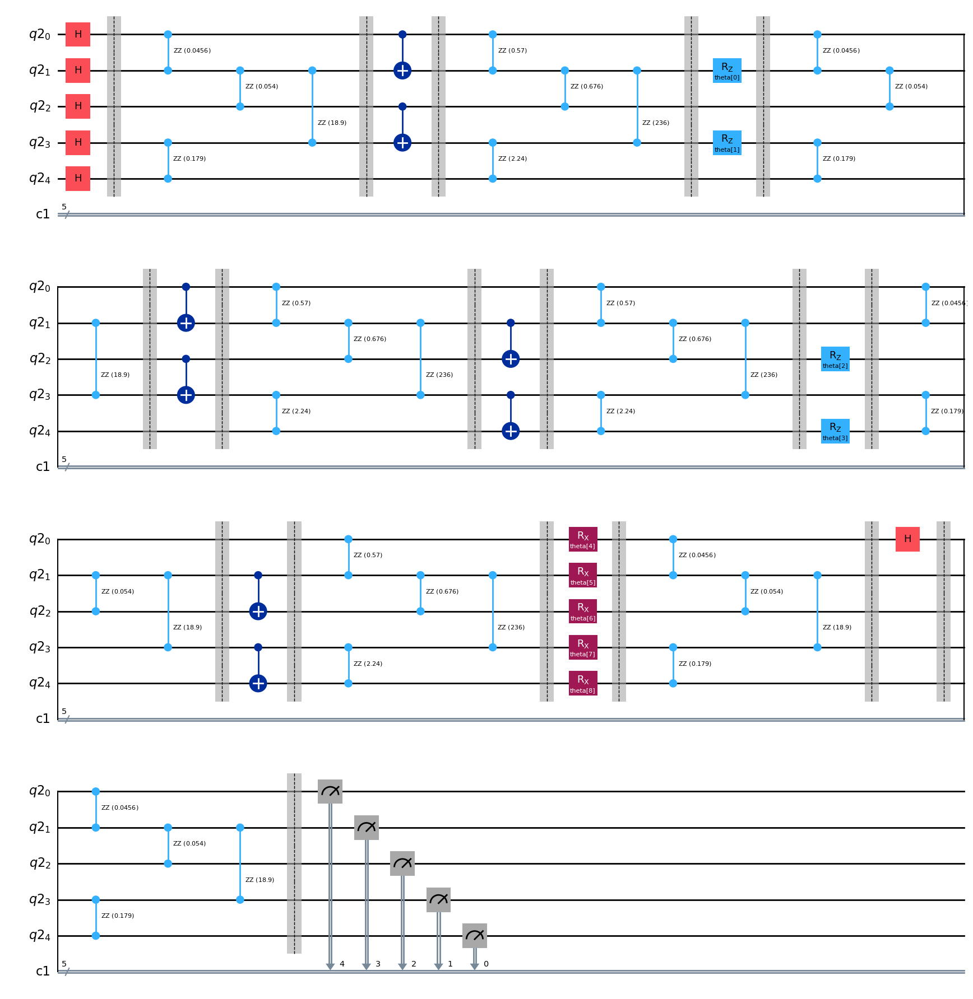

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

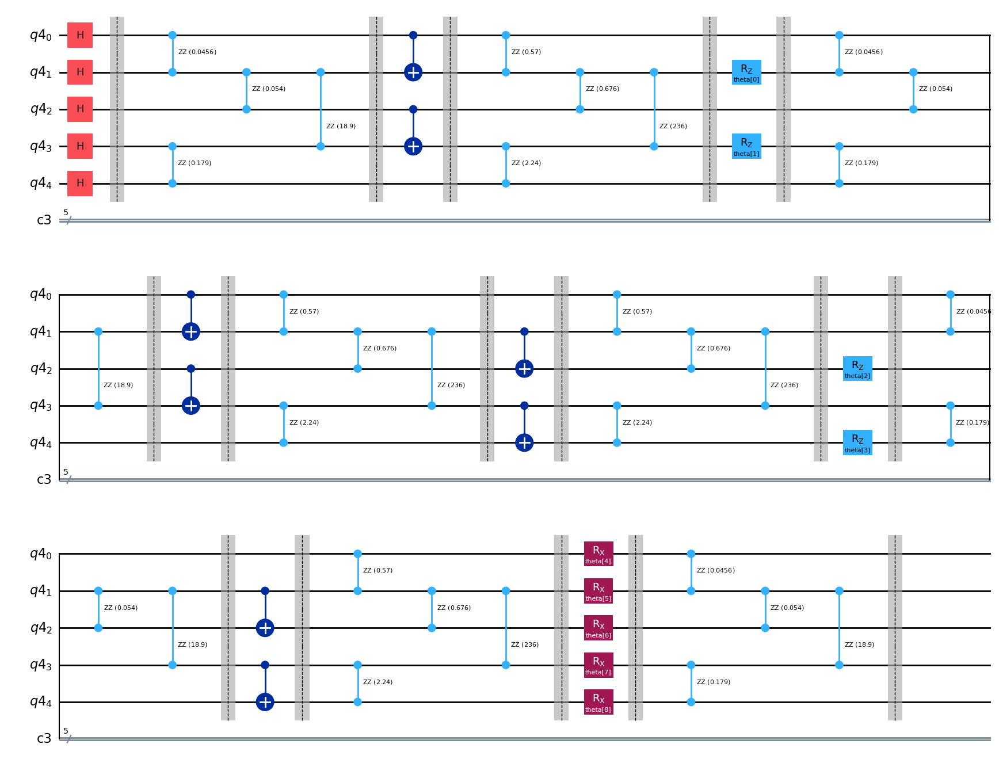

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

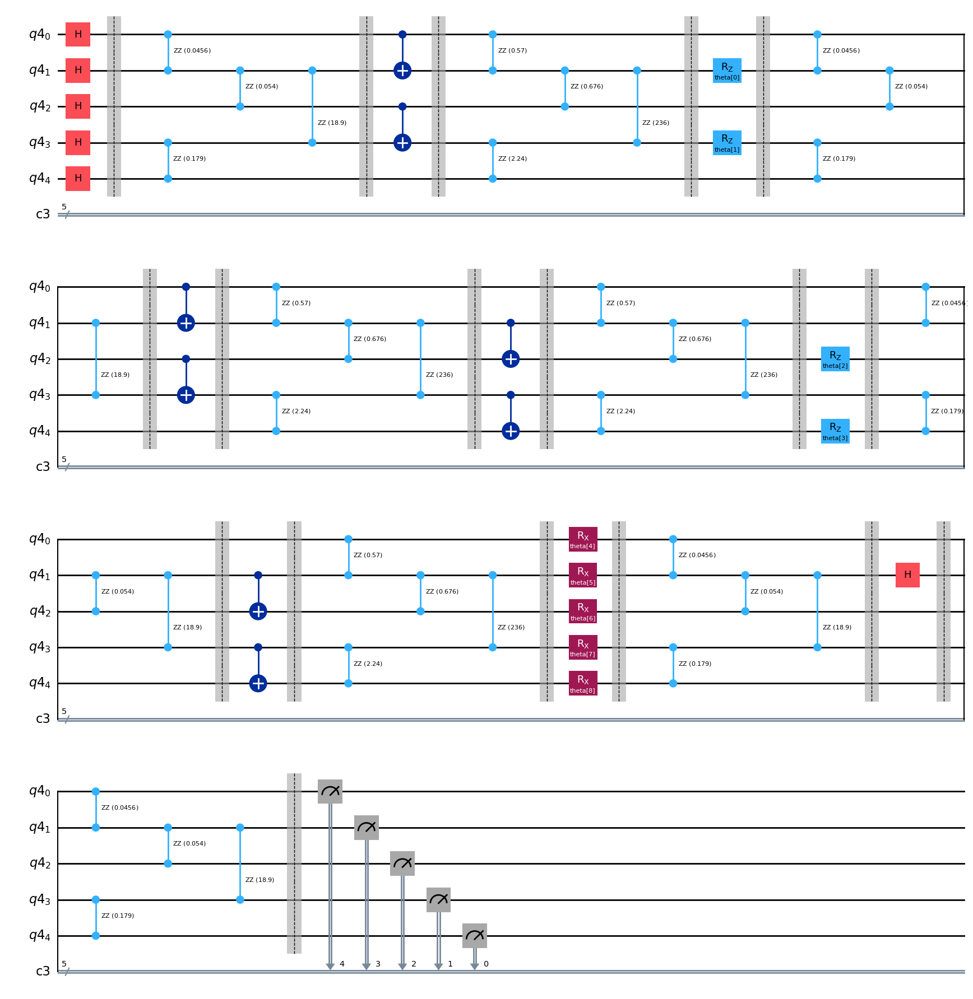

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

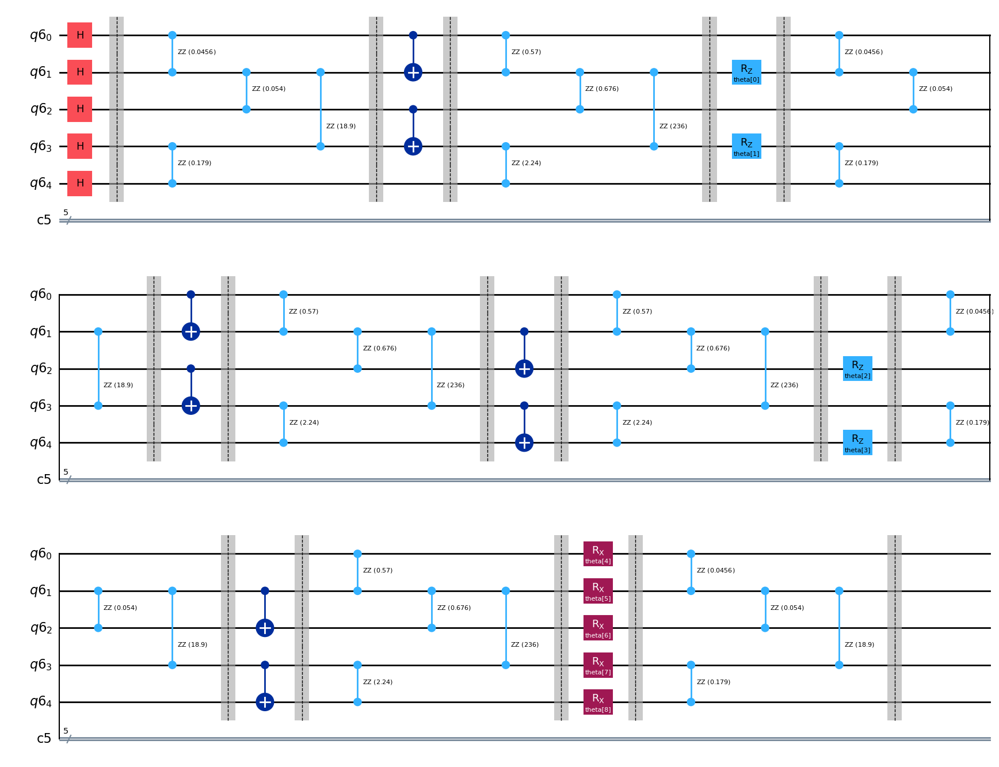

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

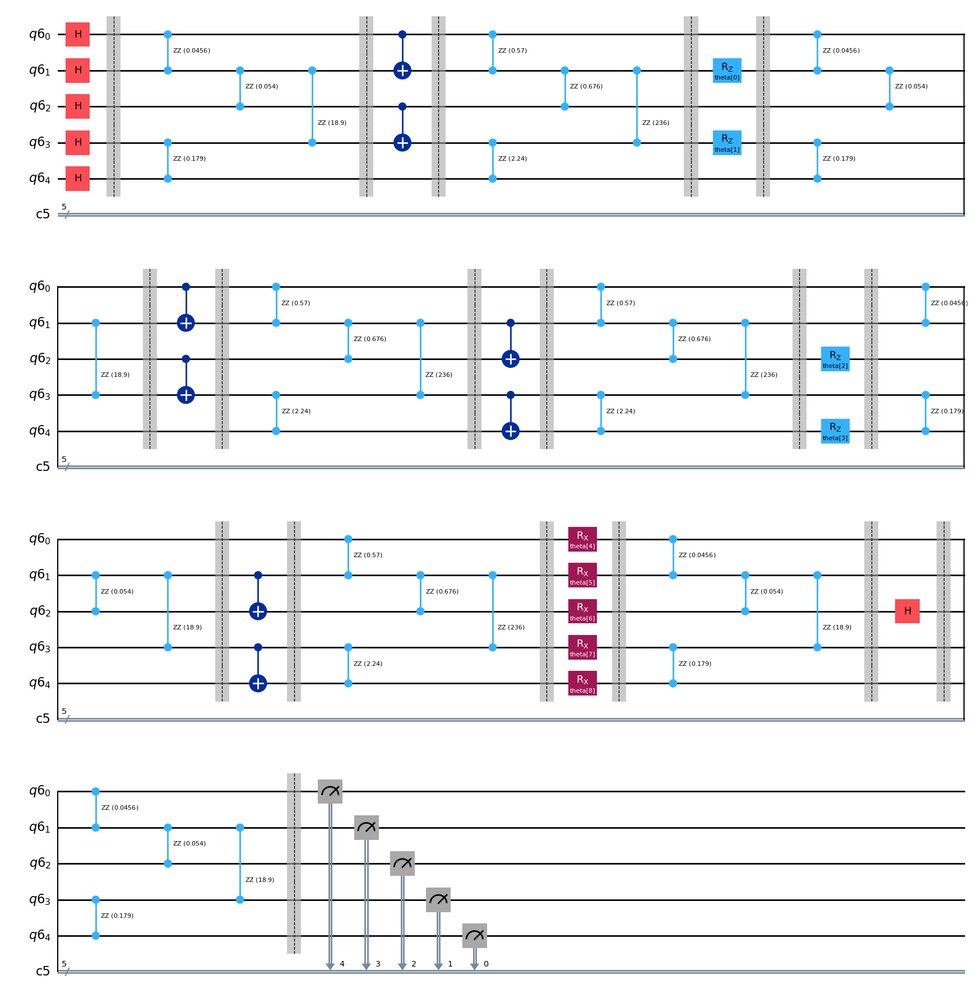

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

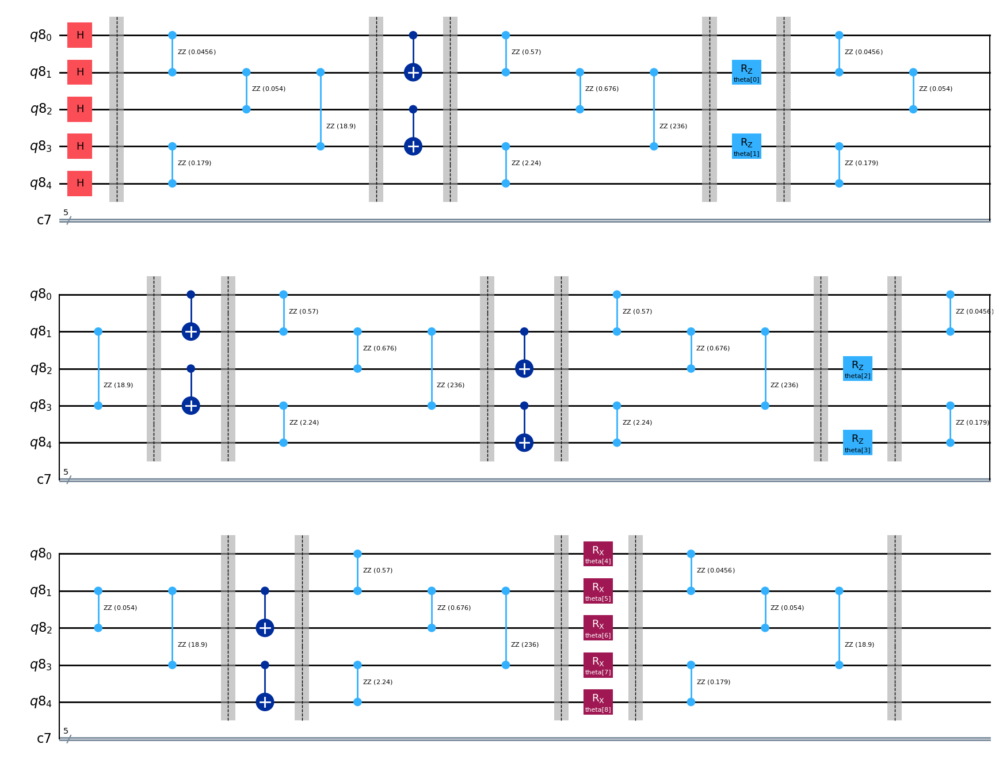

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

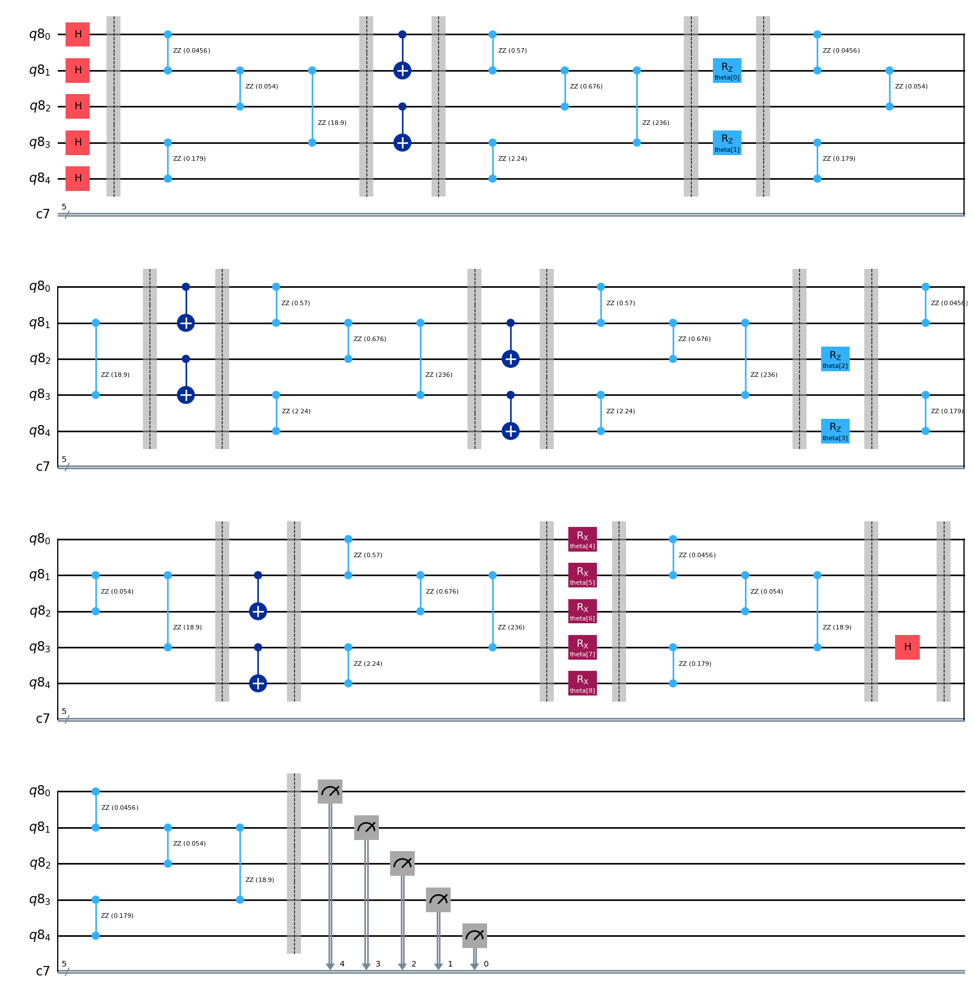

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

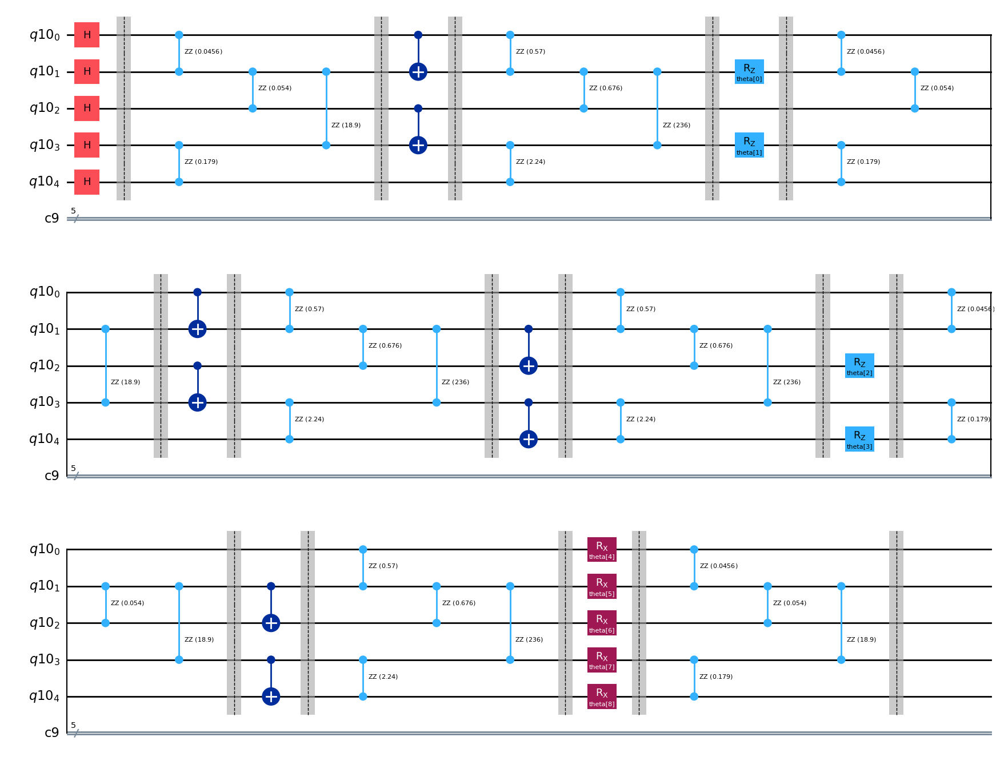

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

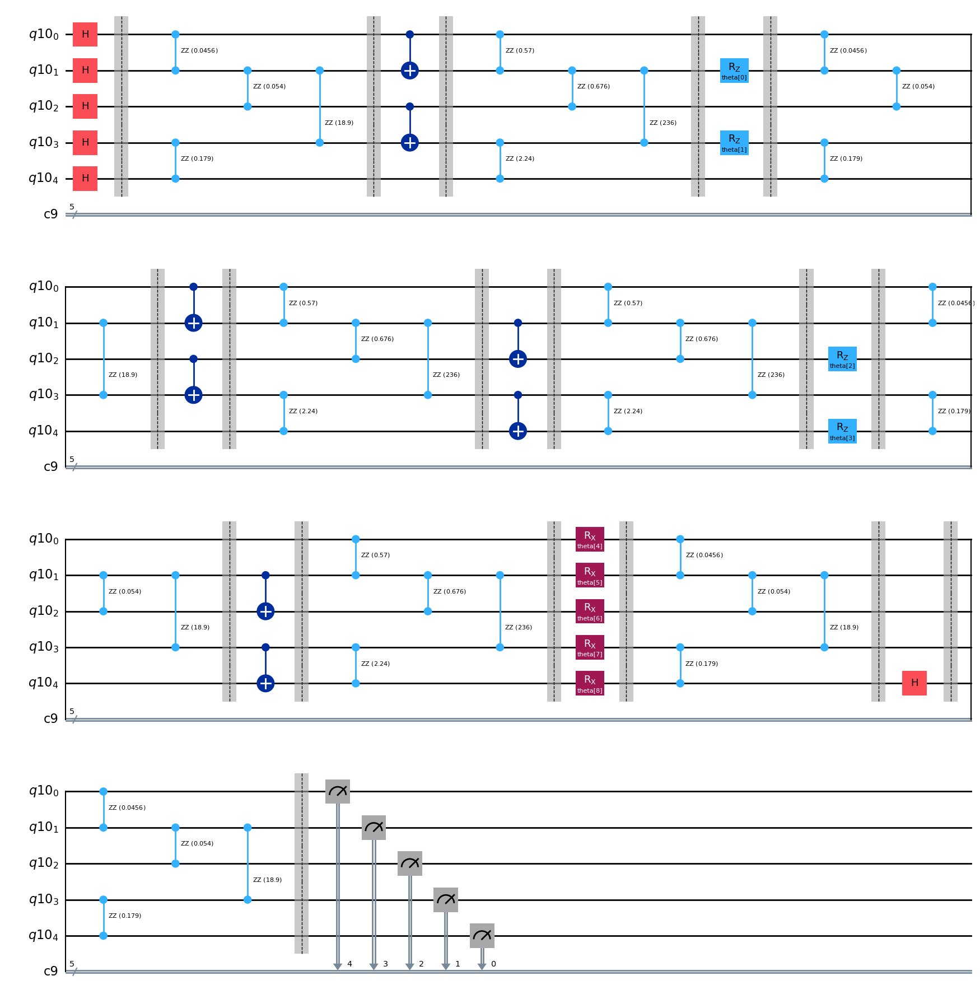

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-2.7116000000000007
-2.4712
-2.4505999999999997
-2.4124000000000003
-2.5313999999999997
-2.1114000000000006
-2.7756
-2.4092000000000002
-2.1275999999999997
-2.4632
-2.5589999999999997
-2.7845999999999997
-2.4335999999999993
-2.4118
-2.714
-2.801600000000001
-2.4963999999999995
-2.087999999999999
-2.4981999999999998
-2.5586


In [ ]:
lowest_energy_vqe

-2.801600000000001

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7116000000000007
-2.4712
-2.4505999999999997
-2.4124000000000003
-2.5313999999999997
-2.1114000000000006
-2.7756
-2.4092000000000002
-2.1275999999999997
-2.4632
-2.5589999999999997
-2.7845999999999997
-2.4335999999999993
-2.4118
-2.714
-2.801600000000001
-2.4963999999999995
-2.087999999999999
-2.4981999999999998
-2.5586


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.289247
         Iterations: 59
         Function evaluations: 3527
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.417799
         Iterations: 92
         Function evaluations: 4236
         Gradient evaluations: 132


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -45.575236
         Iterations: 163
         Function evaluations: 8908
         Gradient evaluations: 278


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -43.001394
         Iterations: 74
         Function evaluations: 4384
         Gradient evaluations: 137


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.591398
         Iterations: 64
         Function evaluations: 4396
         Gradient evaluations: 137
Optimization terminated successfully.
         Current function value: -5.439802
         Iterations: 179
         Function evaluations: 8224
         Gradient evaluations: 257


<ipython-input-26-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-29-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-29-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-29-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-29-942dbc8389c9>:82: RuntimeWarning:

         Current function value: nan
         Iterations: 59
         Function evaluations: 7232
         Gradient evaluations: 226


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.575423
         Iterations: 28
         Function evaluations: 4934
         Gradient evaluations: 154


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.884522
         Iterations: 63
         Function evaluations: 2720
         Gradient evaluations: 85


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -32.976619
         Iterations: 61
         Function evaluations: 3200
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: -10.877387
         Iterations: 13
         Function evaluations: 576
         Gradient evaluations: 18


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.504184
         Iterations: 71
         Function evaluations: 7720
         Gradient evaluations: 241


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -11.253277
         Iterations: 146
         Function evaluations: 6816
         Gradient evaluations: 213


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.334538
         Iterations: 85
         Function evaluations: 4416
         Gradient evaluations: 138
Optimization terminated successfully.
         Current function value: -33.268059
         Iterations: 83
         Function evaluations: 3616
         Gradient evaluations: 113


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -38.721664
         Iterations: 12
         Function evaluations: 2472
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: -10.745865
         Iterations: 112
         Function evaluations: 6304
         Gradient evaluations: 197


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -35.331392
         Iterations: 181
         Function evaluations: 9120
         Gradient evaluations: 285
Optimization terminated successfully.
         Current function value: -4.127402
         Iterations: 49
         Function evaluations: 2304
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: -5.535543
         Iterations: 96
         Function evaluations: 4032
         Gradient evaluations: 126


In [ ]:
lowest_energy_vqnhe

-45.57523645345973

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7116000000000007
-2.4712
-2.4505999999999997
-2.4124000000000003
-2.5313999999999997
-2.1114000000000006
-2.7756
-2.4092000000000002
-2.1275999999999997
-2.4632
-2.5589999999999997
-2.7845999999999997
-2.4335999999999993
-2.4118
-2.714
-2.801600000000001
-2.4963999999999995
-2.087999999999999
-2.4981999999999998
-2.5586


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.105014
         Iterations: 80
         Function evaluations: 9187
         Gradient evaluations: 161
Optimization terminated successfully.
         Current function value: -4.345819
         Iterations: 72
         Function evaluations: 5757
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -43.149187
         Iterations: 101
         Function evaluations: 16197
         Gradient evaluations: 284


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.424749
         Iterations: 55
         Function evaluations: 9924
         Gradient evaluations: 174
Optimization terminated successfully.
         Current function value: -5.332023
         Iterations: 45
         Function evaluations: 3762
         Gradient evaluations: 66


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976350
         Iterations: 95
         Function evaluations: 8607
         Gradient evaluations: 151


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.411128
         Iterations: 24
         Function evaluations: 5535
         Gradient evaluations: 97


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.600089
         Iterations: 166
         Function evaluations: 19791
         Gradient evaluations: 347
Optimization terminated successfully.
         Current function value: -6.109398
         Iterations: 111
         Function evaluations: 10887
         Gradient evaluations: 191


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.372054
         Iterations: 36
         Function evaluations: 6449
         Gradient evaluations: 113


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.610977
         Iterations: 300
         Function evaluations: 31579
         Gradient evaluations: 554


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.664780
         Iterations: 8
         Function evaluations: 4686
         Gradient evaluations: 82


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -47.193217
         Iterations: 94
         Function evaluations: 20012
         Gradient evaluations: 351


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.572393
         Iterations: 99
         Function evaluations: 13235
         Gradient evaluations: 232


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.302286
         Iterations: 97
         Function evaluations: 9246
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.975356
         Iterations: 5
         Function evaluations: 2685
         Gradient evaluations: 47


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.251538
         Iterations: 37
         Function evaluations: 6275
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -47.326527
         Iterations: 46
         Function evaluations: 8617
         Gradient evaluations: 151
Optimization terminated successfully.
         Current function value: -45.471546
         Iterations: 175
         Function evaluations: 16929
         Gradient evaluations: 297
         Current function value: -6.421661
         Iterations: 104
         Function evaluations: 15571
         Gradient evaluations: 273


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-47.32652741312819

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7116000000000007
-2.4712
-2.4505999999999997
-2.4124000000000003
-2.5313999999999997
-2.1114000000000006
-2.7756
-2.4092000000000002
-2.1275999999999997
-2.4632
-2.5589999999999997
-2.7845999999999997
-2.4335999999999993
-2.4118
-2.714
-2.801600000000001
-2.4963999999999995
-2.087999999999999
-2.4981999999999998
-2.5586


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.136202
         Iterations: 11
         Function evaluations: 5731
         Gradient evaluations: 104
Optimization terminated successfully.
         Current function value: -5.548507
         Iterations: 48
         Function evaluations: 3960
         Gradient evaluations: 72


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.592485
         Iterations: 42
         Function evaluations: 10236
         Gradient evaluations: 186
Optimization terminated successfully.
         Current function value: -4.411573
         Iterations: 48
         Function evaluations: 3905
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: -2.843251
         Iterations: 10
         Function evaluations: 605
         Gradient evaluations: 11


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.592702
         Iterations: 31
         Function evaluations: 5017
         Gradient evaluations: 91


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.471418
         Iterations: 300
         Function evaluations: 25630
         Gradient evaluations: 466


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.342060
         Iterations: 19
         Function evaluations: 7602
         Gradient evaluations: 138
Optimization terminated successfully.
         Current function value: -2.801600
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.593863
         Iterations: 38
         Function evaluations: 7327
         Gradient evaluations: 133


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.502323
         Iterations: 92
         Function evaluations: 9471
         Gradient evaluations: 172


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.304547
         Iterations: 61
         Function evaluations: 8867
         Gradient evaluations: 161


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.635922
         Iterations: 67
         Function evaluations: 9362
         Gradient evaluations: 170


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.658477
         Iterations: 21
         Function evaluations: 6722
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.592670
         Iterations: 66
         Function evaluations: 8702
         Gradient evaluations: 158


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.435658
         Iterations: 89
         Function evaluations: 10682
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.233090
         Iterations: 17
         Function evaluations: 5119
         Gradient evaluations: 93


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.368617
         Iterations: 69
         Function evaluations: 7712
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972981
         Iterations: 80
         Function evaluations: 13102
         Gradient evaluations: 238
         Current function value: -3.724965
         Iterations: 14
         Function evaluations: 5178
         Gradient evaluations: 94


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-8.50232260461666

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 6MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 6MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.006                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23238143 5.13761857]
[10.15992788 10.37052248  9.97041964]
0.00052248031572244
[5.13823962 4.98776038]
[ 9.97013876 10.12661863  9.66829261]
0.0006186307278044367
[4.98672671 5.01627329]
[ 9.97020674 10.15356075  9.72284251]
0.15056075468799435
[5.01486524 5.28213476]
[ 9.72288456 10.2990188  10.25910664]
0.0020187980951194007


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(0.00026124015786122,
 0.00030931536390221837,
 0.07528037734399717,
 0.0010093990475597003)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

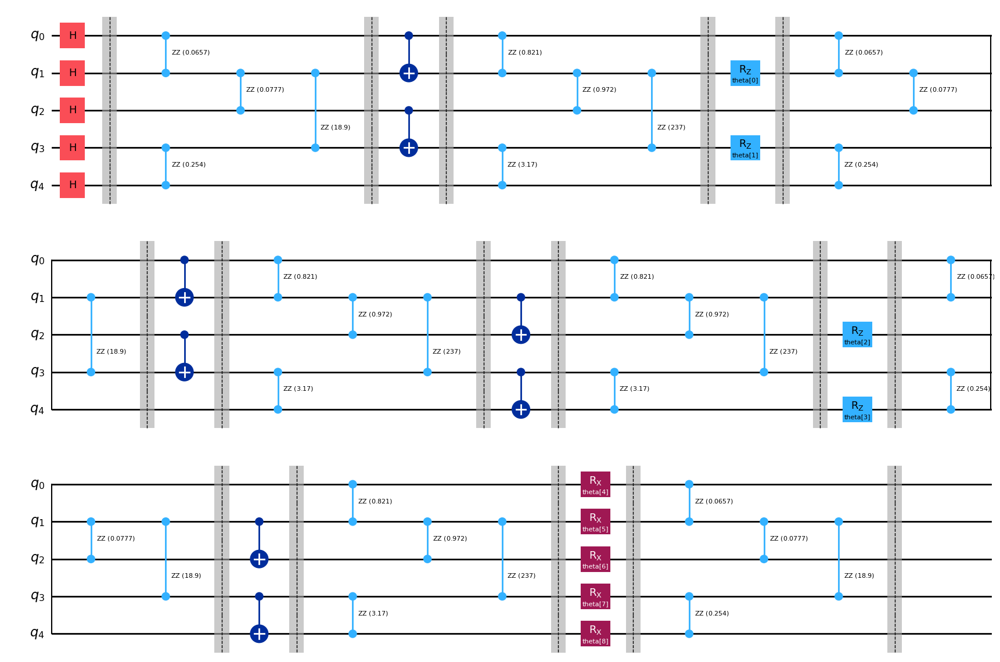

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

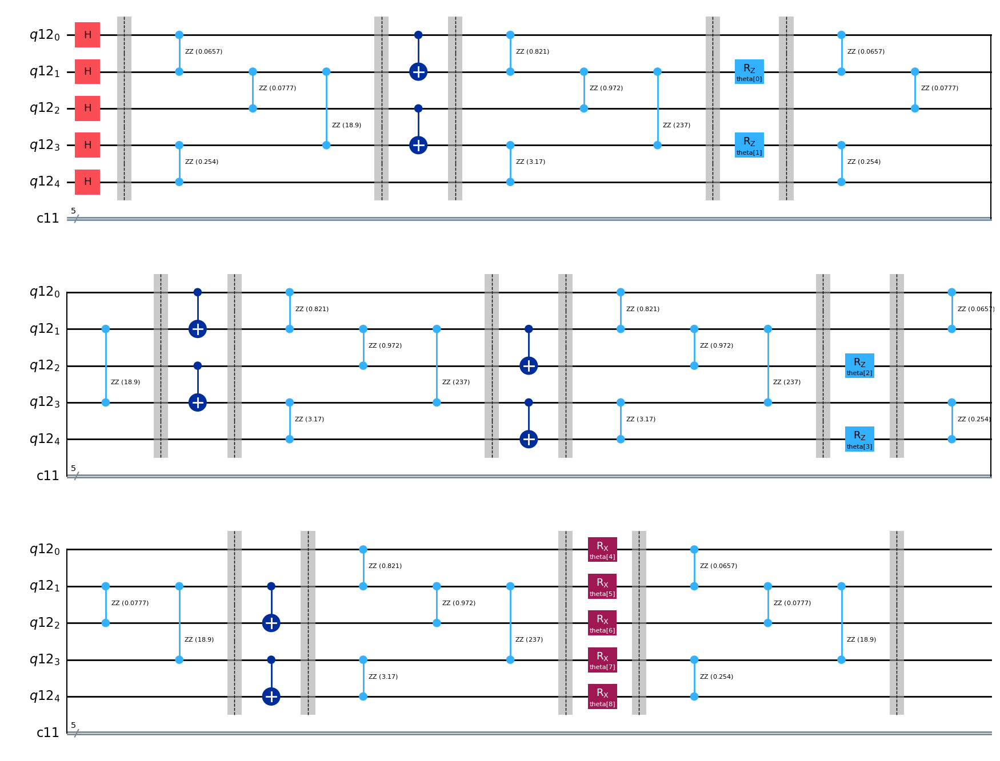

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

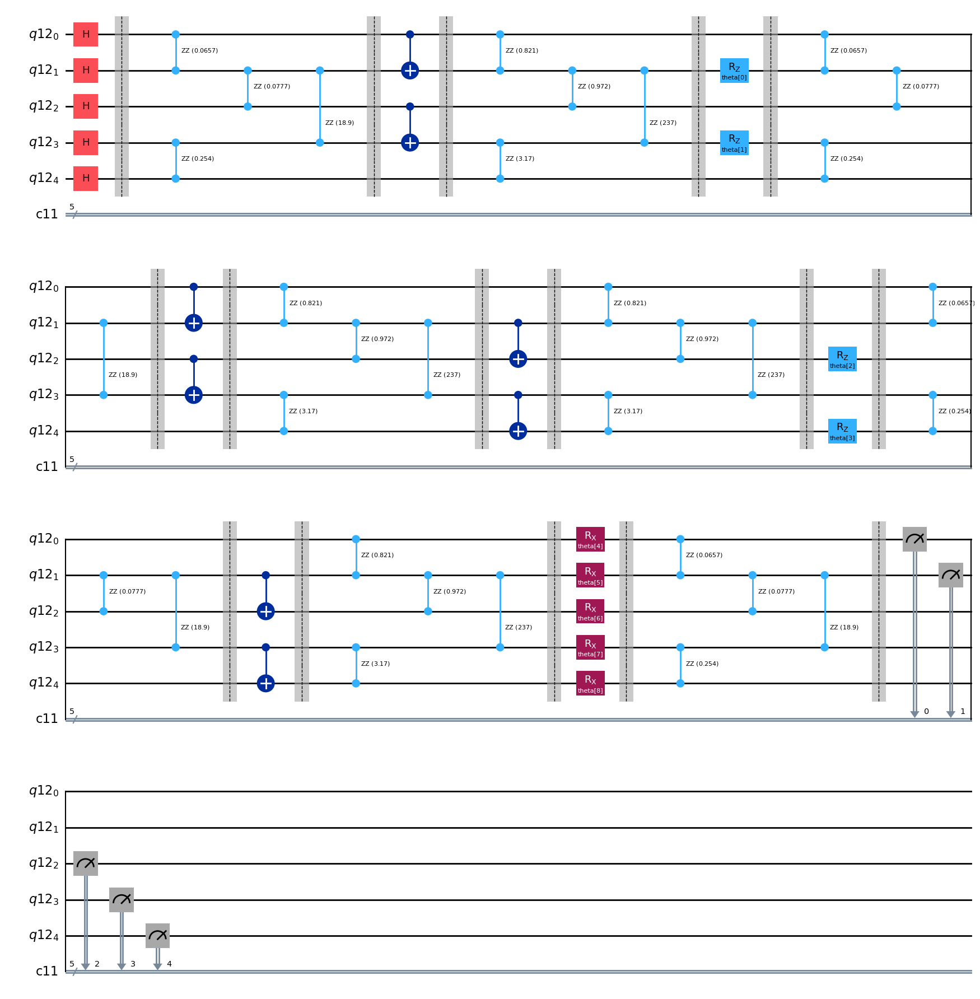

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

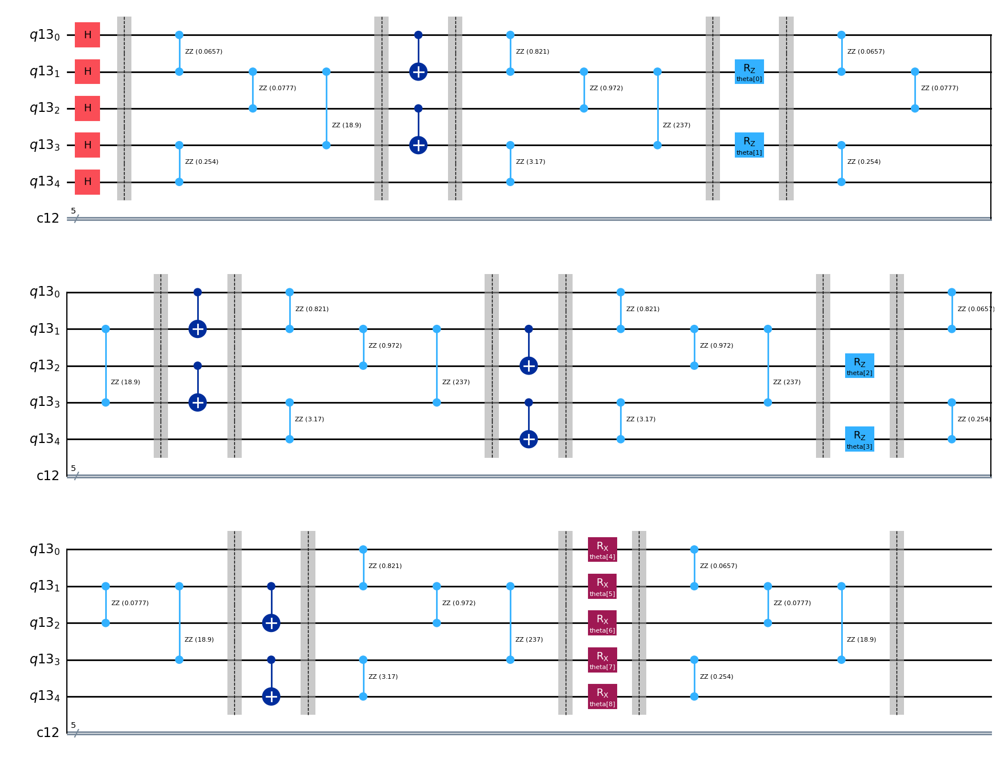

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

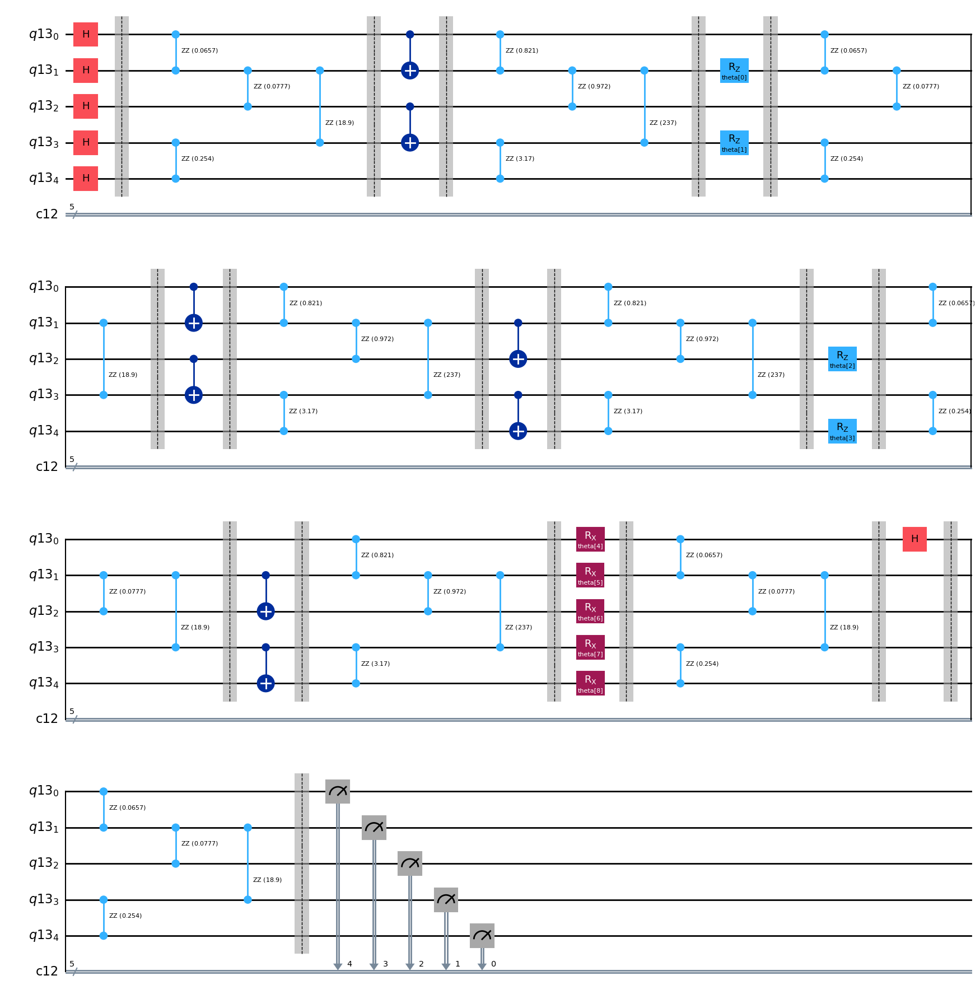

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

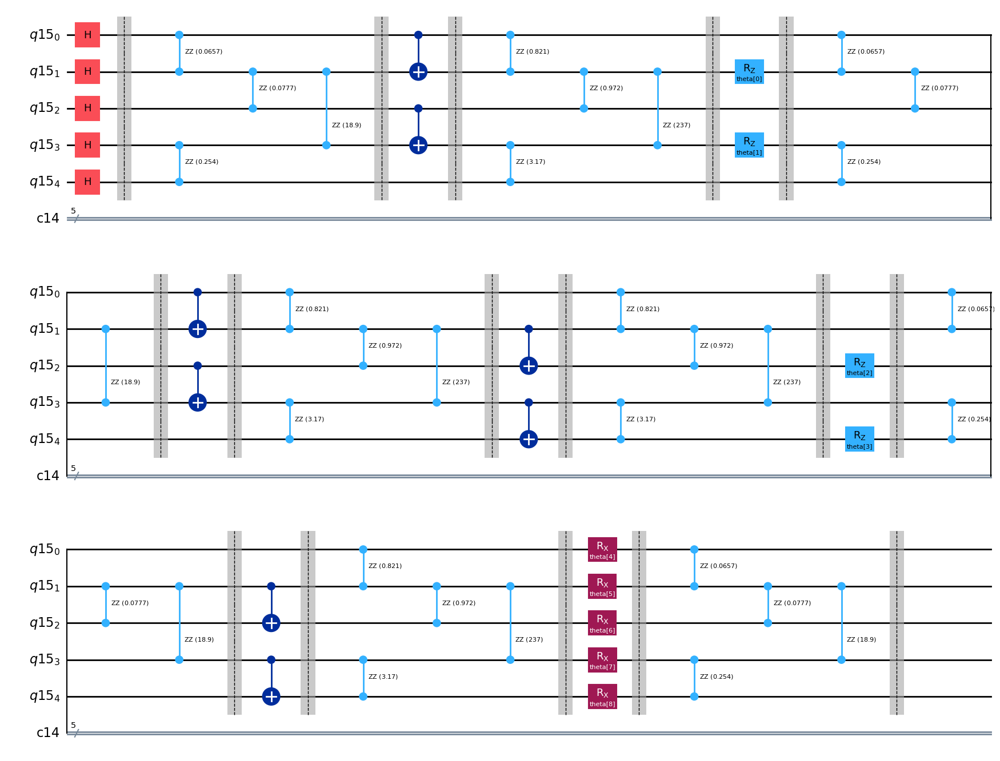

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

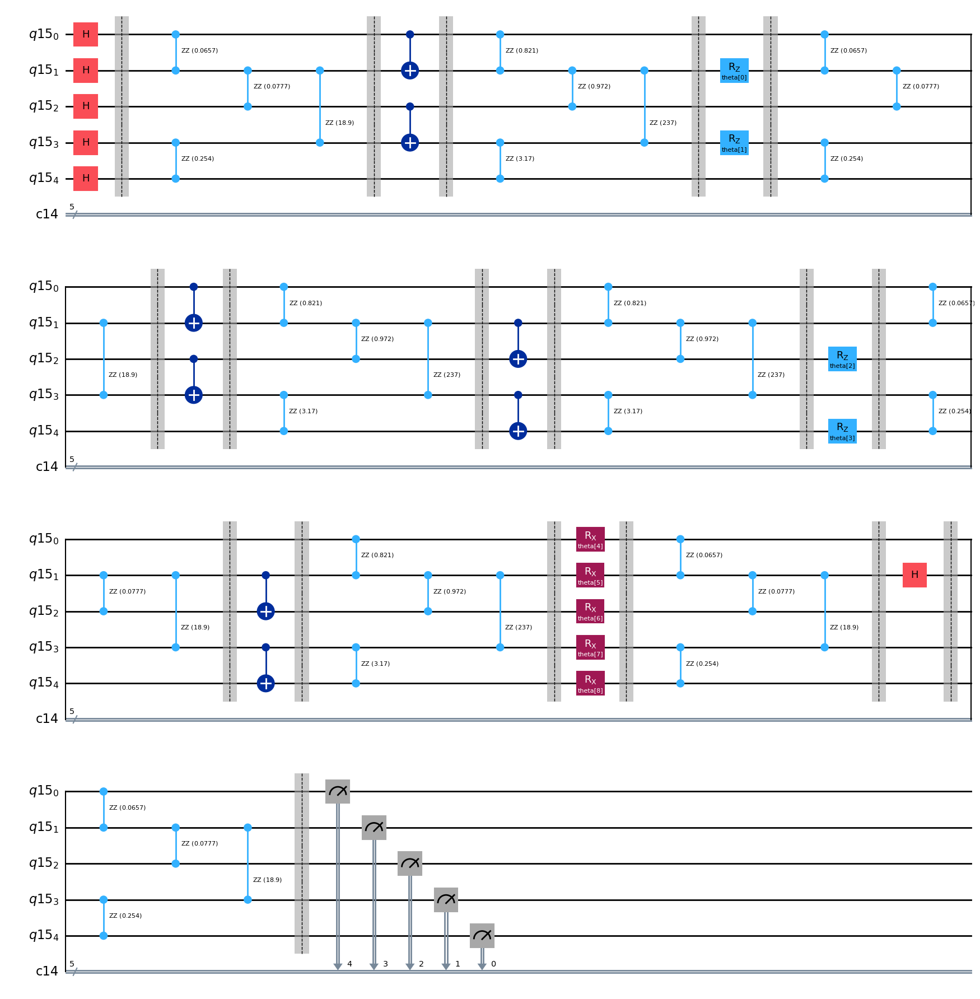

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

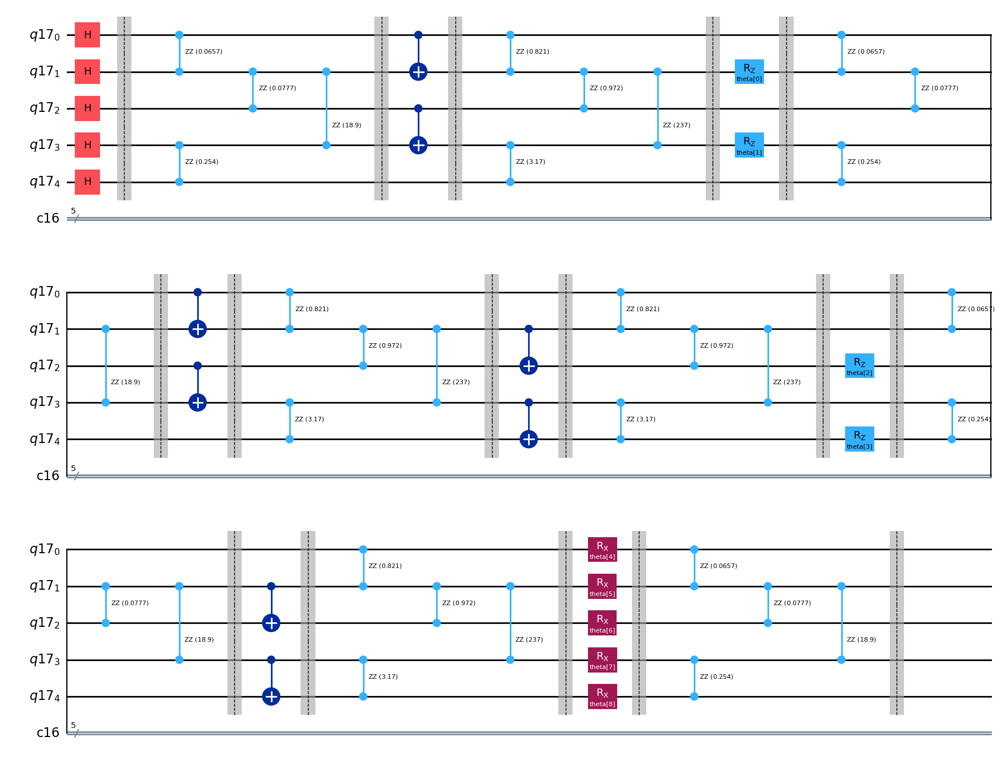

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

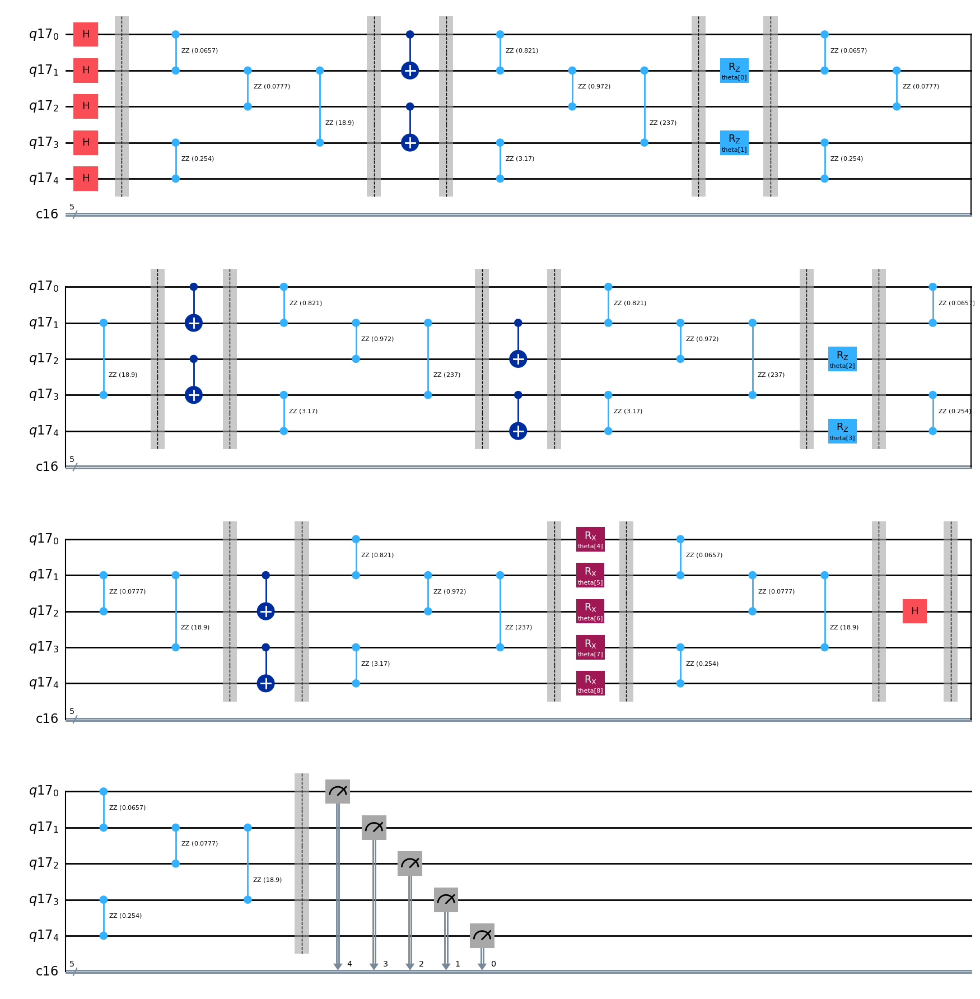

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

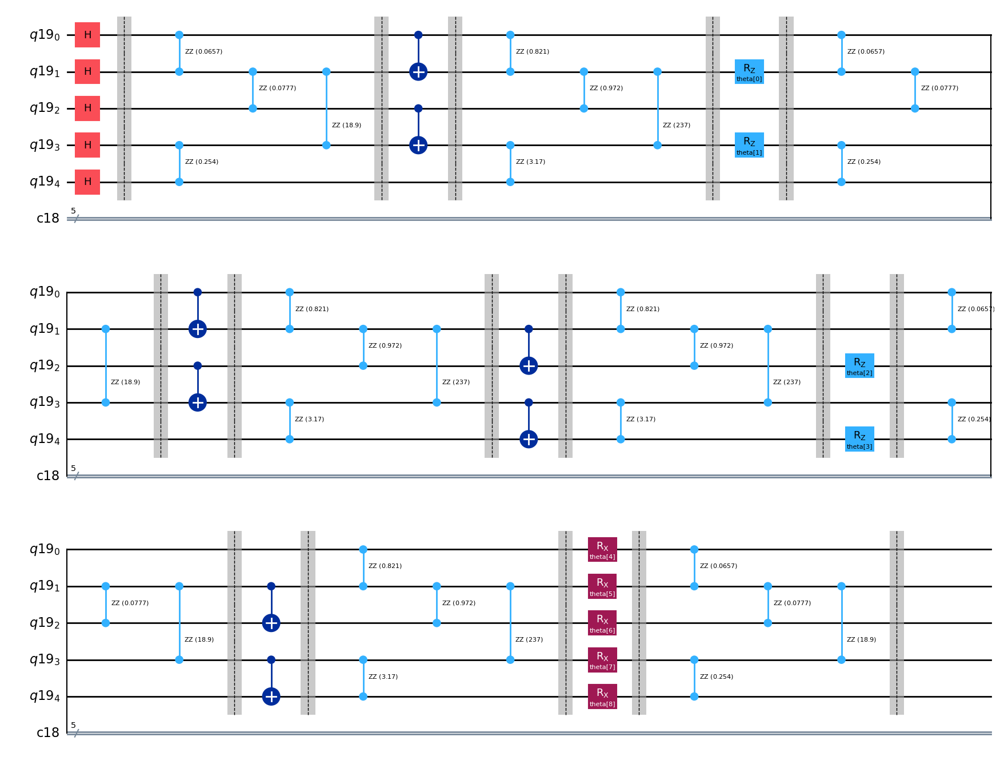

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

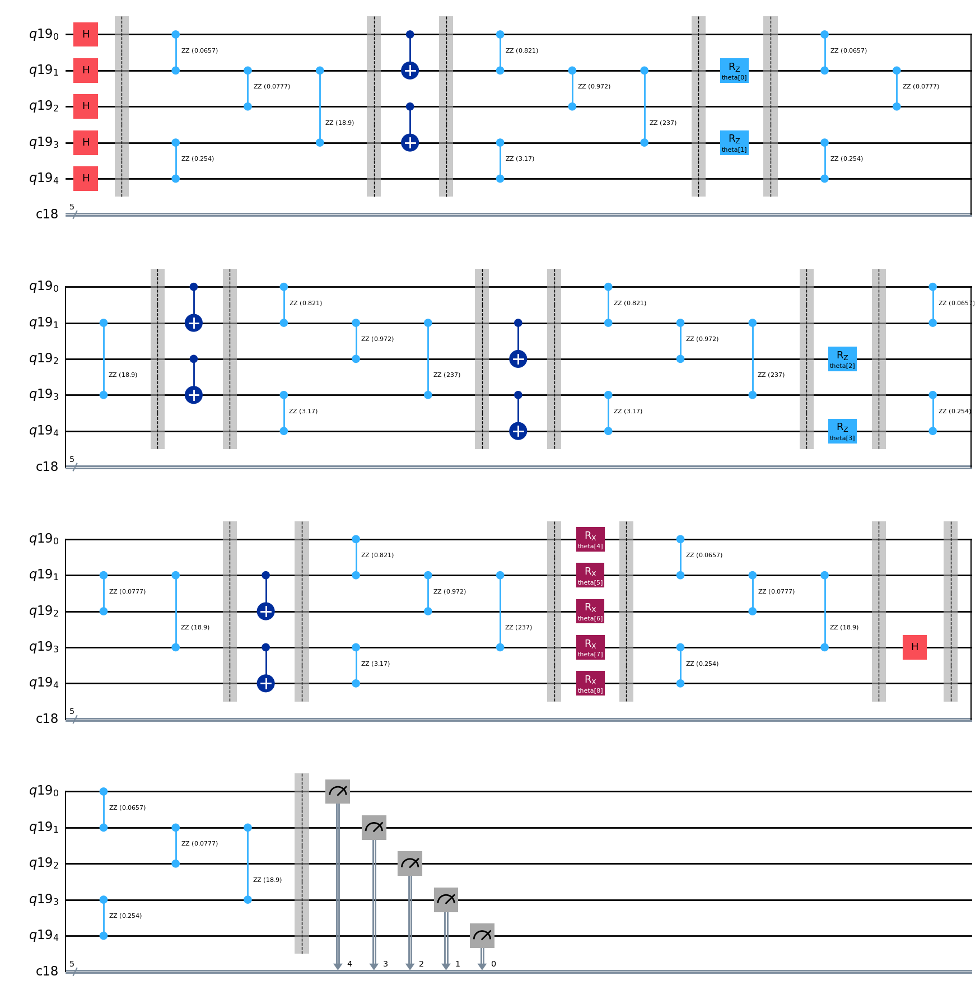

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

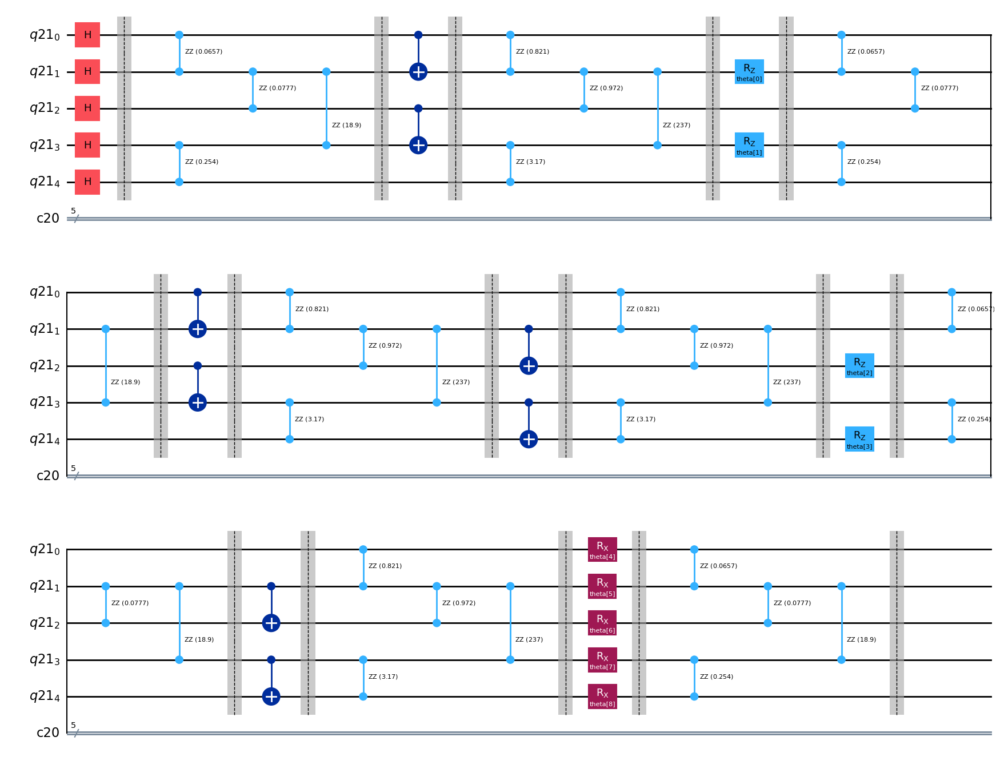

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

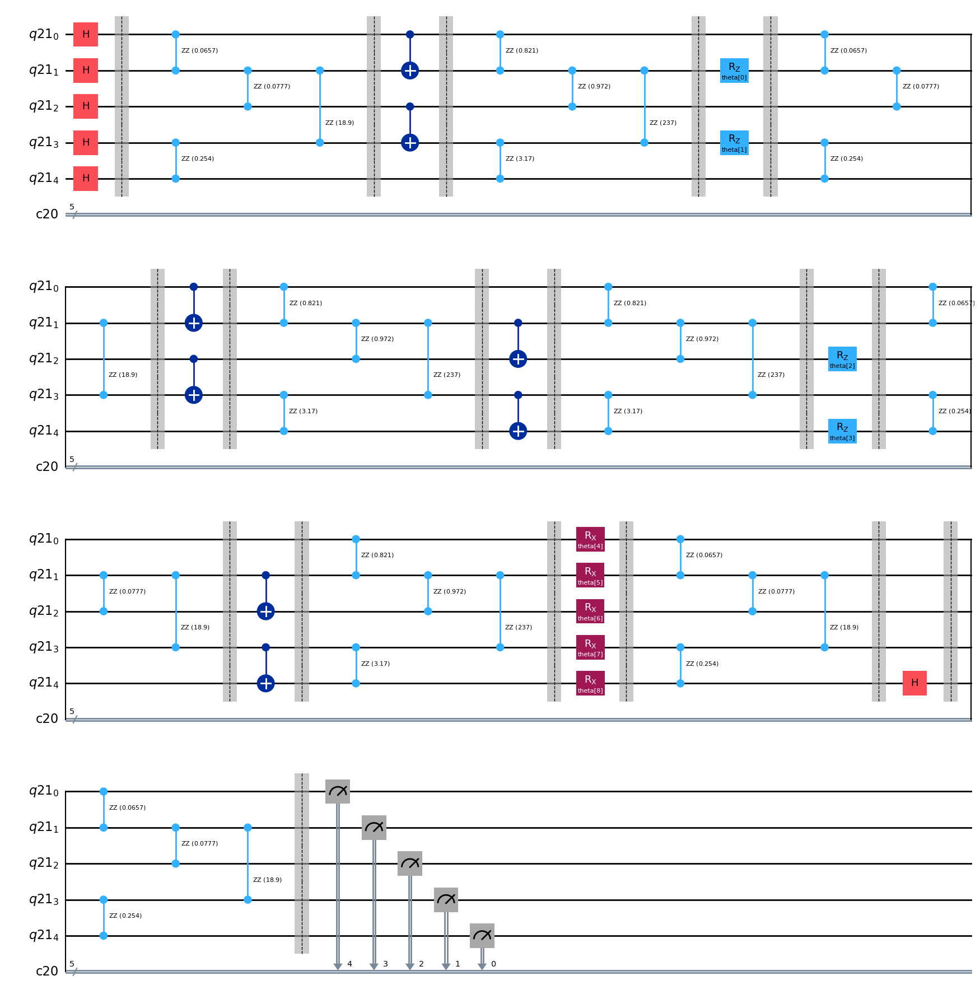

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.3426
-2.6962
-2.815000000000001
-2.6798000000000006
-3.2876000000000003
-3.3423999999999987
-3.089600000000001
-3.4057999999999997
-2.741
-2.5938
-3.2076000000000007
-2.726
-3.3419999999999996
-3.3852
-3.267000000000001
-2.8080000000000007
-2.8638
-2.6584
-2.542
-3.2756


In [ ]:
lowest_energy_vqe

-3.4057999999999997

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3426
-2.6962
-2.815000000000001
-2.6798000000000006
-3.2876000000000003
-3.3423999999999987
-3.089600000000001
-3.4057999999999997
-2.741
-2.5938
-3.2076000000000007
-2.726
-3.3419999999999996
-3.3852
-3.267000000000001
-2.8080000000000007
-2.8638
-2.6584
-2.542
-3.2756


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.813867
         Iterations: 69
         Function evaluations: 3488
         Gradient evaluations: 109


<ipython-input-62-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-66-17f9dacdbf40>:4: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + Z1Z2(params_nn, x_pqc_0)
<ipython-input-65-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-65-942dbc8389c9>:99: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-65-942dbc8389c9>:124: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]
<ipython-input-65-942dbc8389c9>:136: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]
<ipython-input-62-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-

         Current function value: nan
         Iterations: 140
         Function evaluations: 10976
         Gradient evaluations: 343


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.827370
         Iterations: 74
         Function evaluations: 5859
         Gradient evaluations: 183


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.767372
         Iterations: 186
         Function evaluations: 8903
         Gradient evaluations: 278


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.057343
         Iterations: 270
         Function evaluations: 13195
         Gradient evaluations: 412


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.731673
         Iterations: 90
         Function evaluations: 6442
         Gradient evaluations: 201


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.751974
         Iterations: 75
         Function evaluations: 4448
         Gradient evaluations: 139


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.924257
         Iterations: 106
         Function evaluations: 6504
         Gradient evaluations: 203


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -36.502842
         Iterations: 92
         Function evaluations: 7490
         Gradient evaluations: 234


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -36.519224
         Iterations: 300
         Function evaluations: 14368
         Gradient evaluations: 449


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -36.257579
         Iterations: 141
         Function evaluations: 9002
         Gradient evaluations: 281
Optimization terminated successfully.
         Current function value: -10.243069
         Iterations: 69
         Function evaluations: 2880
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: -34.374902
         Iterations: 93
         Function evaluations: 5216
         Gradient evaluations: 163


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.193918
         Iterations: 51
         Function evaluations: 2272
         Gradient evaluations: 71


<ipython-input-65-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-66-17f9dacdbf40>:4: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + Z1Z2(params_nn, x_pqc_0)
<ipython-input-65-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:143: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-62-880feffc952c>:8: Runt

         Current function value: nan
         Iterations: 51
         Function evaluations: 6464
         Gradient evaluations: 202


<ipython-input-66-17f9dacdbf40>:8: RuntimeWarning: overflow encountered in scalar subtract
  expval = expval - X0(params_nn, x_pqc_0)
/usr/local/lib/python3.10/dist-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
<ipython-input-65-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-65-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scala

         Current function value: nan
         Iterations: 97
         Function evaluations: 7488
         Gradient evaluations: 234


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.234887
         Iterations: 23
         Function evaluations: 4652
         Gradient evaluations: 145


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.236204
         Iterations: 300
         Function evaluations: 13120
         Gradient evaluations: 410


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.880579
         Iterations: 90
         Function evaluations: 4672
         Gradient evaluations: 146
         Current function value: -14.112698
         Iterations: 15
         Function evaluations: 2924
         Gradient evaluations: 91


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-36.51922407793088

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3426
-2.6962
-2.815000000000001
-2.6798000000000006
-3.2876000000000003
-3.3423999999999987
-3.089600000000001
-3.4057999999999997
-2.741
-2.5938
-3.2076000000000007
-2.726
-3.3419999999999996
-3.3852
-3.267000000000001
-2.8080000000000007
-2.8638
-2.6584
-2.542
-3.2756


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.546417
         Iterations: 136
         Function evaluations: 12894
         Gradient evaluations: 226


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.826370
         Iterations: 26
         Function evaluations: 6960
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.006694
         Iterations: 26
         Function evaluations: 7479
         Gradient evaluations: 131


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.089457
         Iterations: 43
         Function evaluations: 8503
         Gradient evaluations: 149


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.042199
         Iterations: 36
         Function evaluations: 7704
         Gradient evaluations: 135


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.910355
         Iterations: 237
         Function evaluations: 33926
         Gradient evaluations: 595


<ipython-input-62-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-65-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-65-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-65-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-65-942dbc8389c9>:86: RuntimeWarning: inval

         Current function value: nan
         Iterations: 7
         Function evaluations: 7752
         Gradient evaluations: 136


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.982905
         Iterations: 130
         Function evaluations: 13863
         Gradient evaluations: 243


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.689181
         Iterations: 22
         Function evaluations: 6728
         Gradient evaluations: 118
Optimization terminated successfully.
         Current function value: -7.162367
         Iterations: 123
         Function evaluations: 10317
         Gradient evaluations: 181


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -36.480296
         Iterations: 129
         Function evaluations: 17736
         Gradient evaluations: 311


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.875170
         Iterations: 6
         Function evaluations: 5370
         Gradient evaluations: 94


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -15.110742
         Iterations: 74
         Function evaluations: 8322
         Gradient evaluations: 146


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.032928
         Iterations: 31
         Function evaluations: 10664
         Gradient evaluations: 187


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.109234
         Iterations: 91
         Function evaluations: 11070
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.464756
         Iterations: 115
         Function evaluations: 13178
         Gradient evaluations: 231


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -34.536183
         Iterations: 84
         Function evaluations: 11294
         Gradient evaluations: 198


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.168488
         Iterations: 29
         Function evaluations: 6852
         Gradient evaluations: 120


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.744541
         Iterations: 37
         Function evaluations: 10951
         Gradient evaluations: 192
         Current function value: -4.641052
         Iterations: 25
         Function evaluations: 6221
         Gradient evaluations: 109


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-36.48029646039046

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3426
-2.6962
-2.815000000000001
-2.6798000000000006
-3.2876000000000003
-3.3423999999999987
-3.089600000000001
-3.4057999999999997
-2.741
-2.5938
-3.2076000000000007
-2.726
-3.3419999999999996
-3.3852
-3.267000000000001
-2.8080000000000007
-2.8638
-2.6584
-2.542
-3.2756
Optimization terminated successfully.
         Current function value: -3.953760
         Iterations: 36
         Function evaluations: 2365
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: -3.980345
         Iterations: 117
         Function evaluations: 8910
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.430387
         Iterations: 5
         Function evaluations: 2536
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: -4.024395
         Iterations: 47
         Function evaluations: 3410
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: -3.411491
         Iterations: 20
         Function evaluations: 1210
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: -3.736325
         Iterations: 30
         Function evaluations: 2145
         Gradient evaluations: 39


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.197918
         Iterations: 30
         Function evaluations: 5842
         Gradient evaluations: 106
Optimization terminated successfully.
         Current function value: -3.932549
         Iterations: 38
         Function evaluations: 2310
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -3.405800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.905441
         Iterations: 247
         Function evaluations: 20142
         Gradient evaluations: 366


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.227436
         Iterations: 60
         Function evaluations: 7927
         Gradient evaluations: 144
Optimization terminated successfully.
         Current function value: -3.479975
         Iterations: 28
         Function evaluations: 2255
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: -4.214087
         Iterations: 35
         Function evaluations: 2310
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -3.480800
         Iterations: 18
         Function evaluations: 2530
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: -3.843920
         Iterations: 29
         Function evaluations: 1980
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: -3.960059
         Iterations: 51
         Function evaluations: 3245
         Gradient eva

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.705831
         Iterations: 12
         Function evaluations: 5014
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: -3.973487
         Iterations: 30
         Function evaluations: 1925
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: -3.487982
         Iterations: 14
         Function evaluations: 1100
         Gradient evaluations: 20
         Current function value: -3.945855
         Iterations: 16
         Function evaluations: 4788
         Gradient evaluations: 87


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-4.22743620360022

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 7MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 7MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.007                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23251842 5.13748158]
[10.15980491 10.37071062  9.97035447]
0.0007106218201018422
[5.13832596 4.98767404]
[ 9.96997321 10.12684103  9.66823576]
0.0008410272895007509
[4.98629309 5.01670691]
[ 9.97006545 10.15376255  9.722782  ]
0.1507625526728784
[5.01481661 5.28218339]
[ 9.72283926 10.2997021  10.25846864]
0.0027020972217579597


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(0.0003553109100509211,
 0.00042051364475037545,
 0.0753812763364392,
 0.0013510486108789799)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

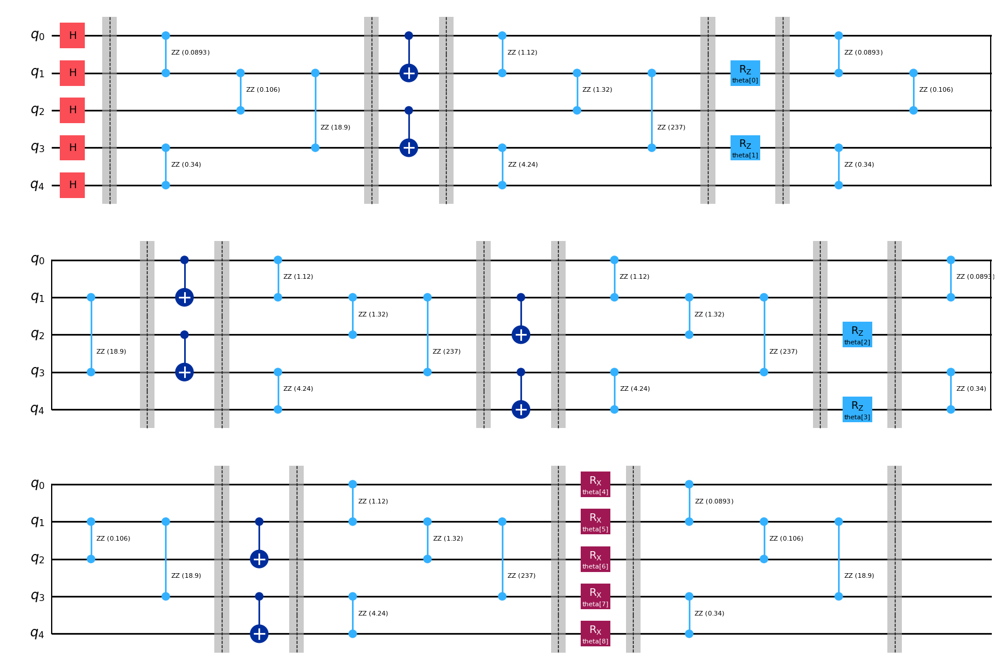

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

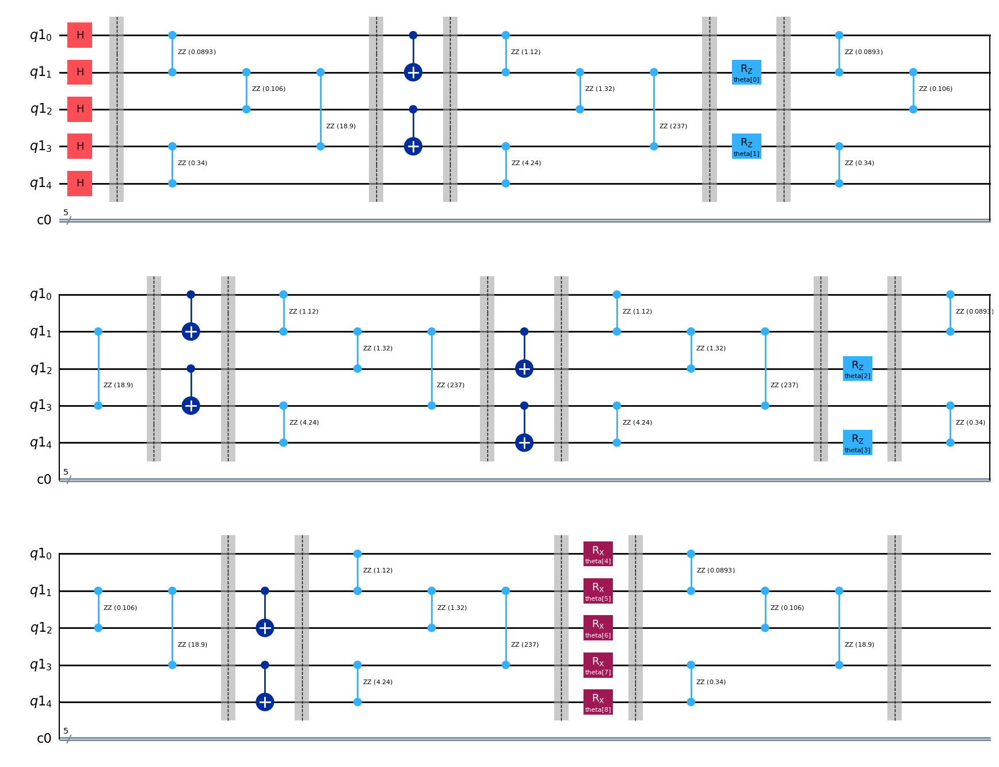

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

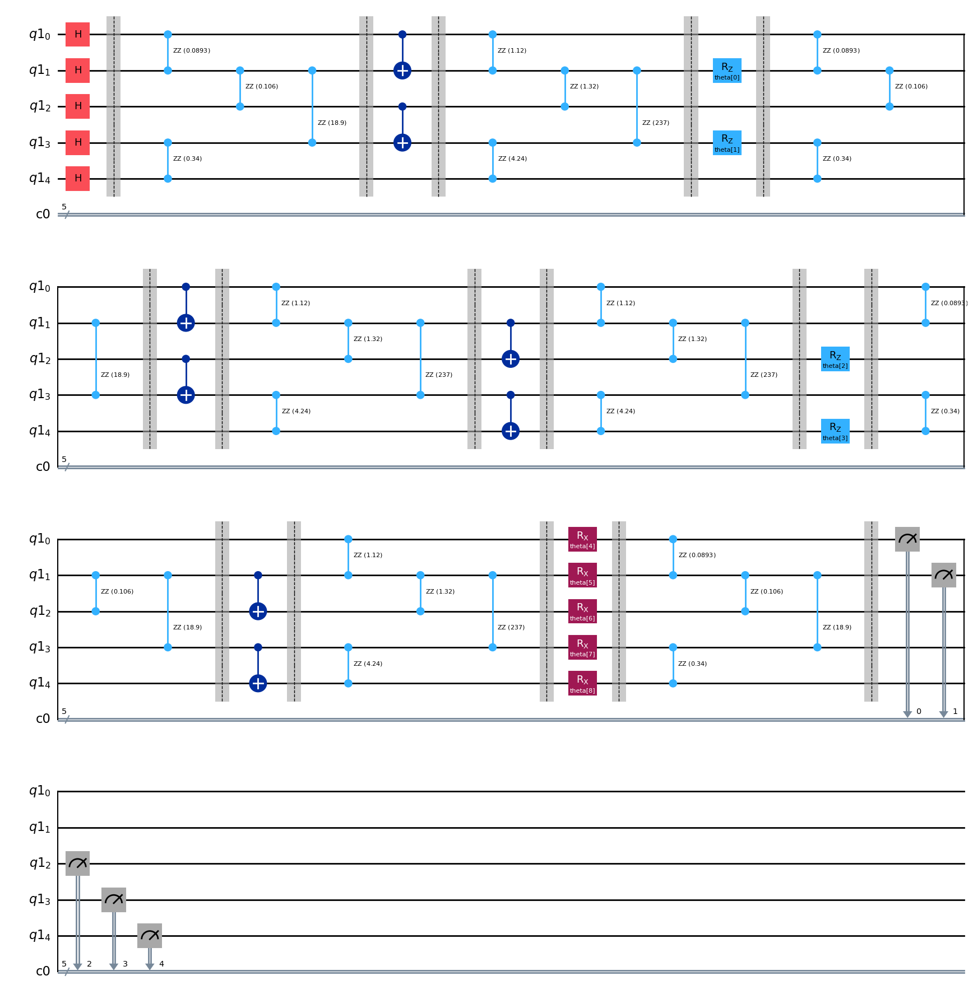

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

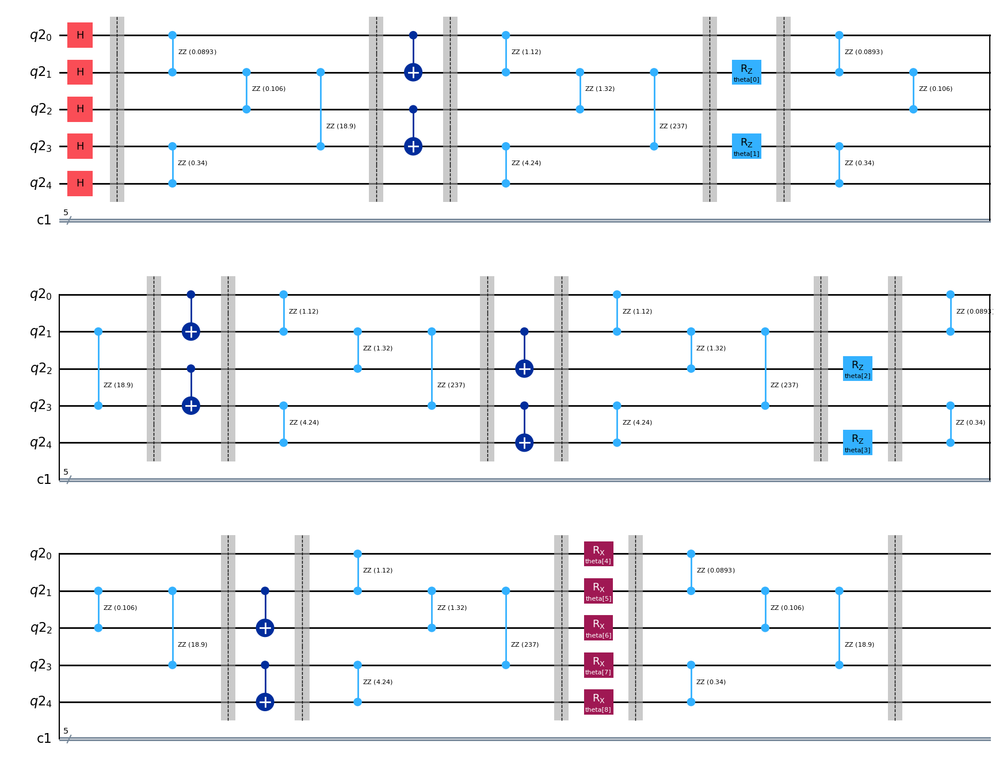

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

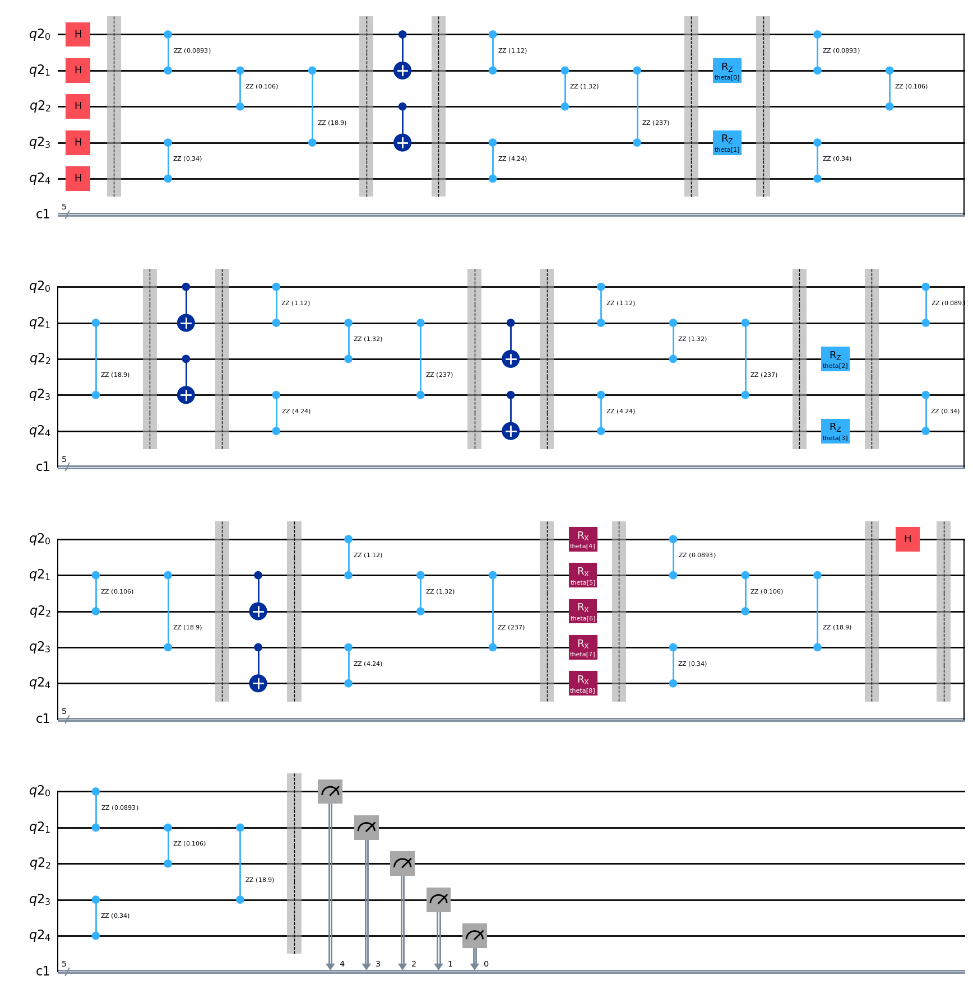

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

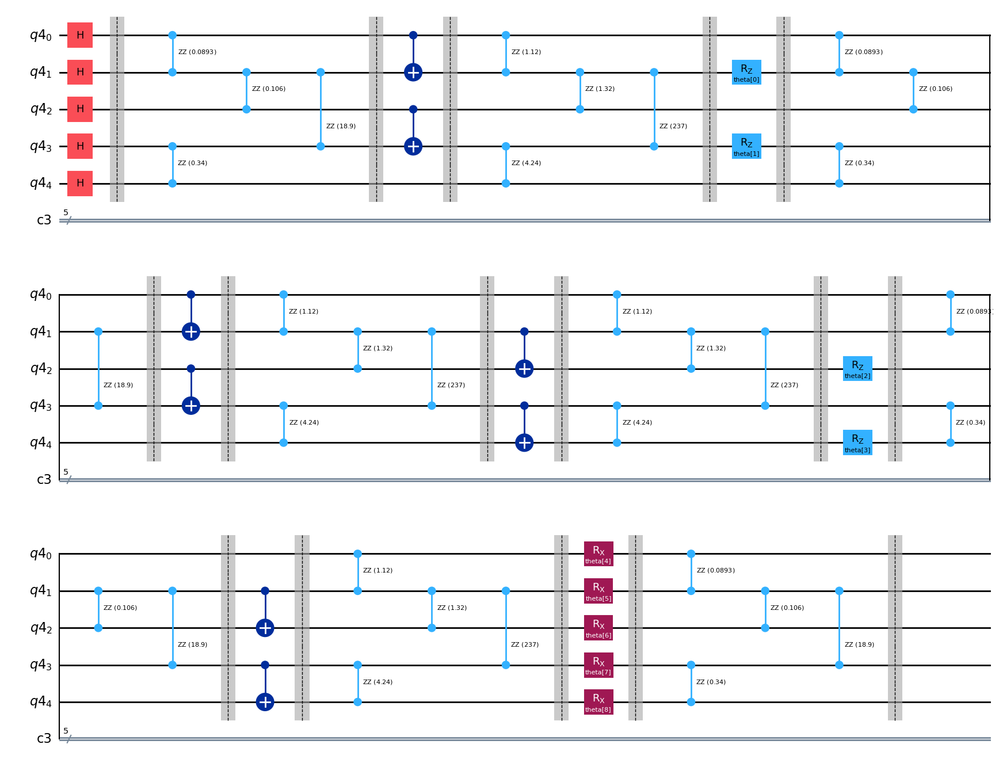

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

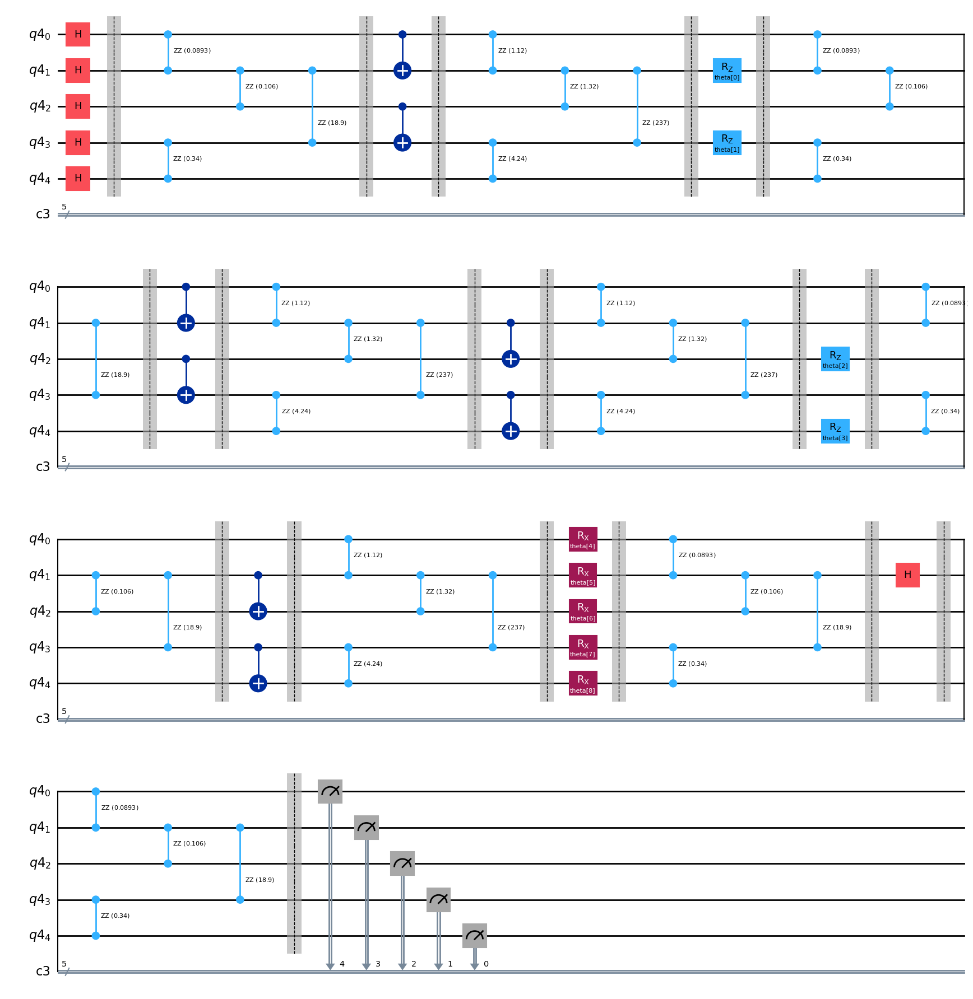

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

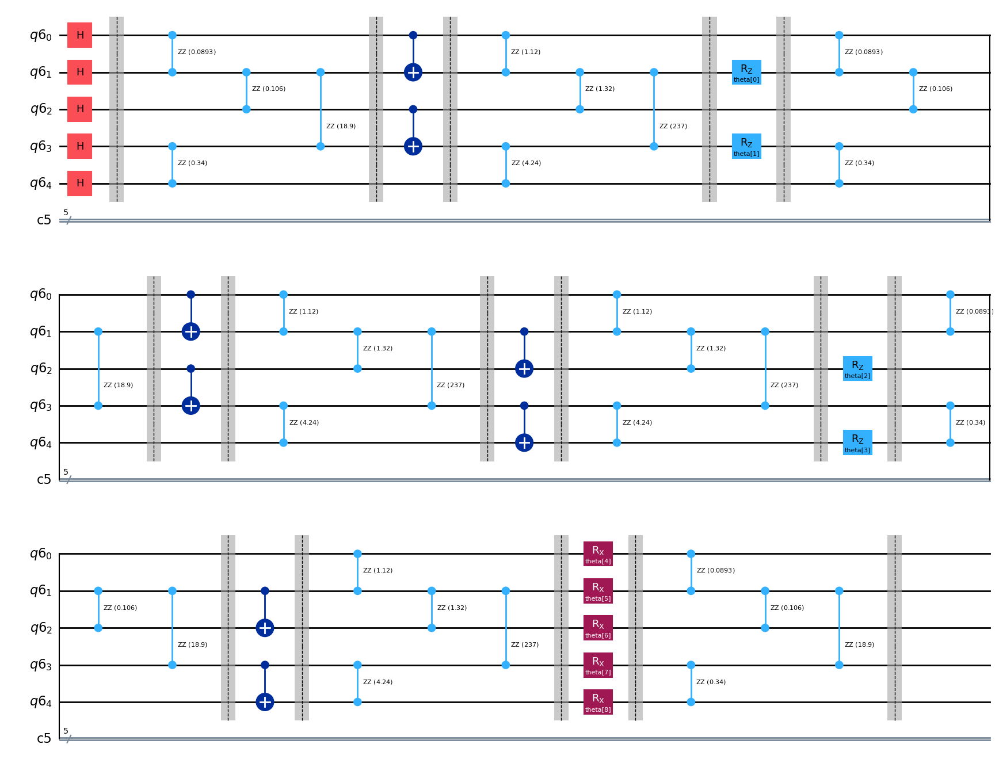

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

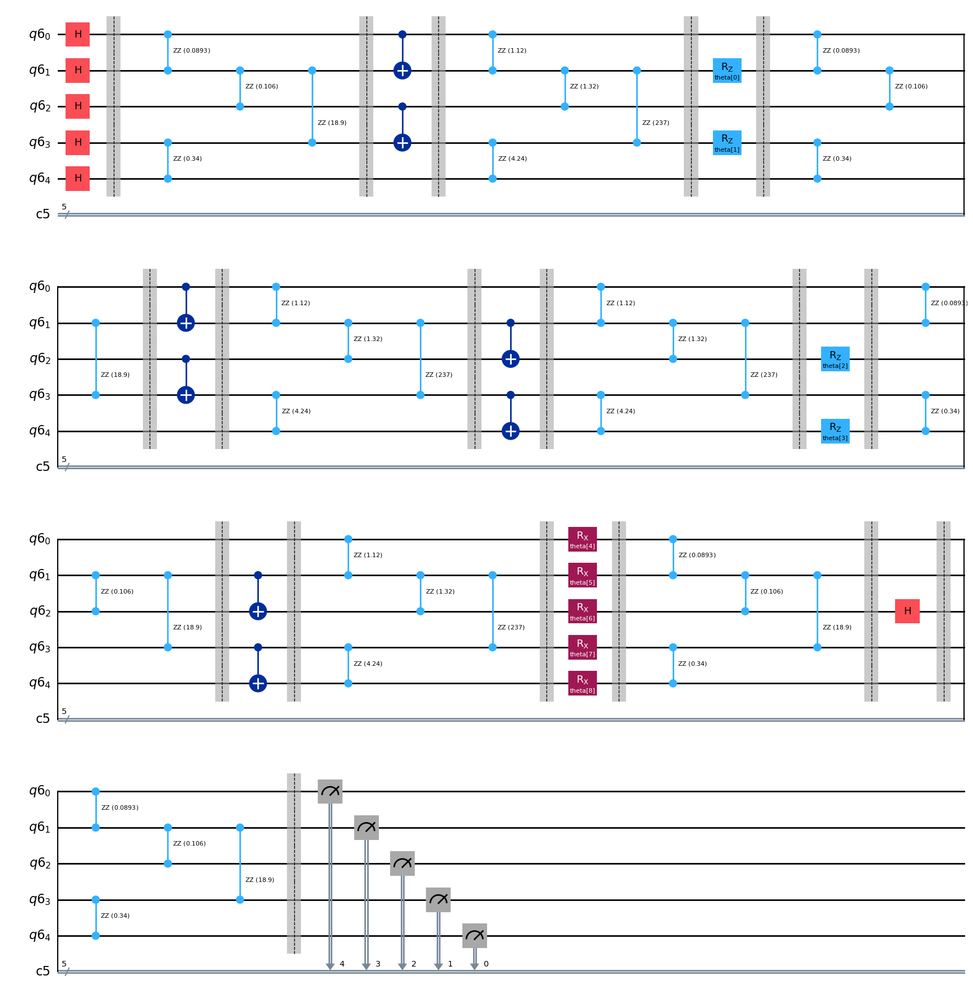

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

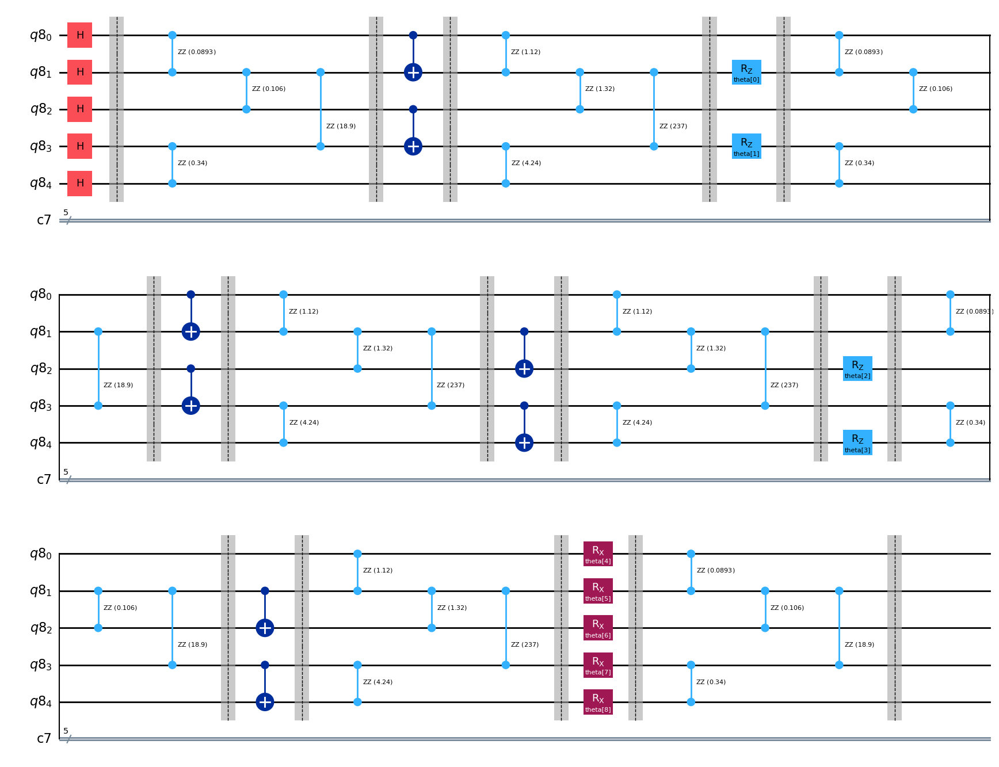

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

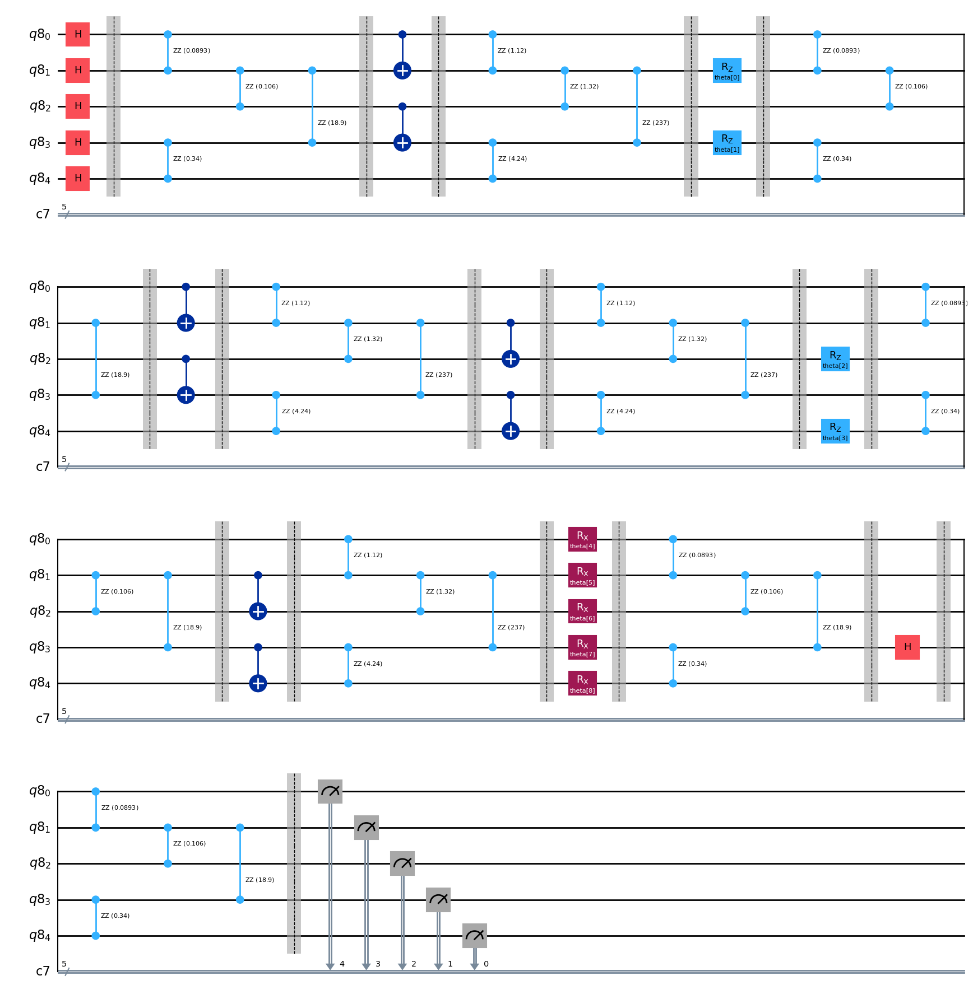

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

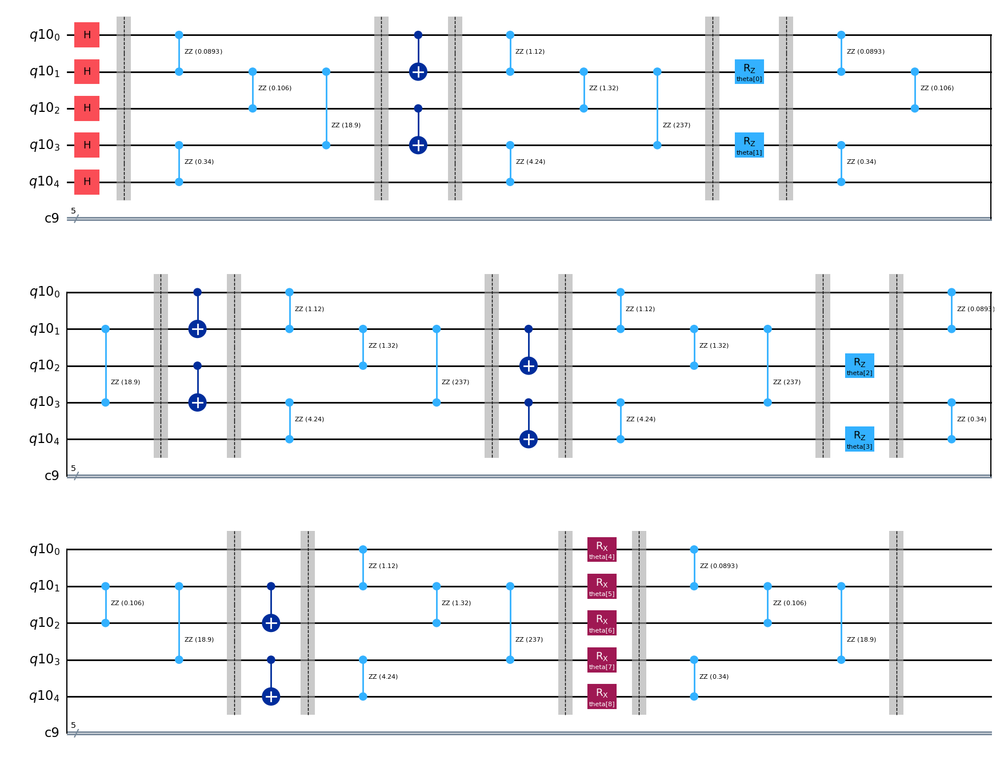

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

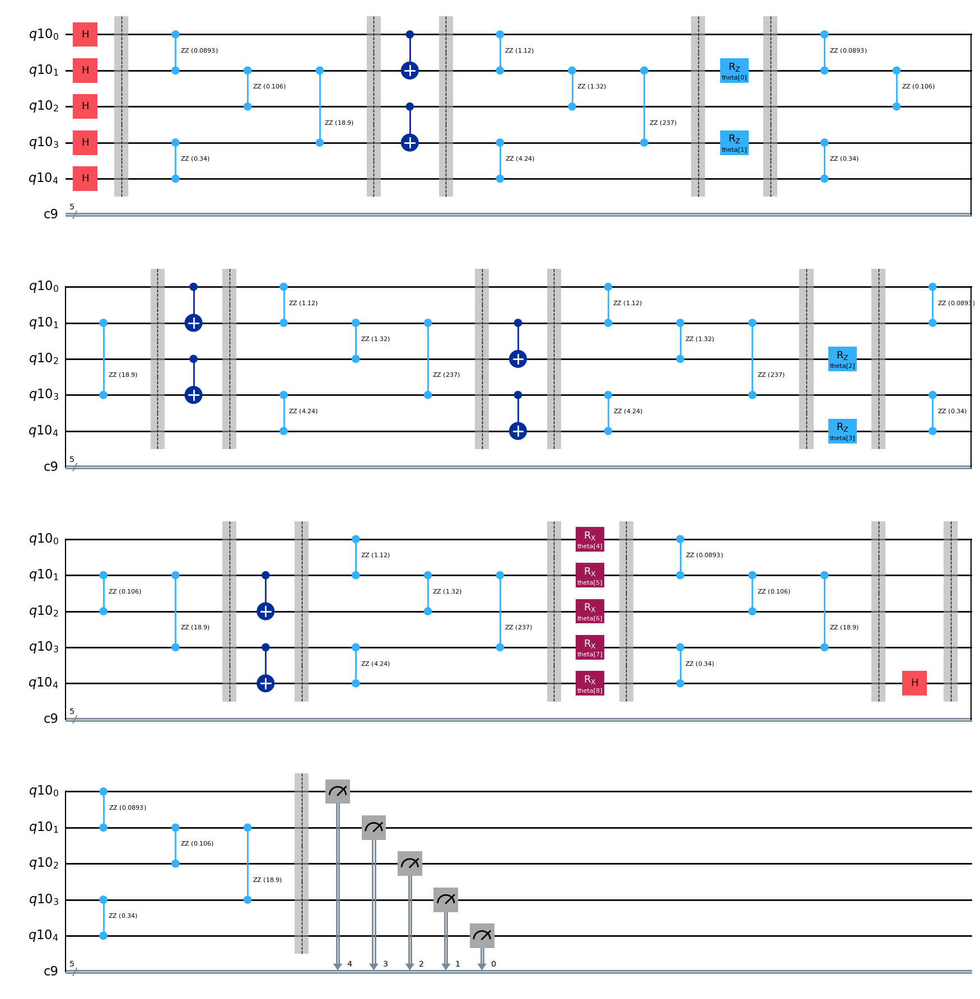

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-1.0487999999999997
-1.1809999999999998
-0.9950000000000001
-0.8906000000000001
-0.8171999999999998
-1.0060000000000004
-1.1932000000000003
-1.2692000000000003
-1.1608
-1.256
-1.1766000000000003
-1.3406000000000005
-1.1812000000000002
-1.1212000000000002
-1.1746
-1.2244000000000002
-1.1965999999999999
-1.1043999999999998
-1.1299999999999997
-0.7478000000000001


In [ ]:
lowest_energy_vqe

-1.3406000000000005

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.0487999999999997
-1.1809999999999998
-0.9950000000000001
-0.8906000000000001
-0.8171999999999998
-1.0060000000000004
-1.1932000000000003
-1.2692000000000003
-1.1608
-1.256
-1.1766000000000003
-1.3406000000000005
-1.1812000000000002
-1.1212000000000002
-1.1746
-1.2244000000000002
-1.1965999999999999
-1.1043999999999998
-1.1299999999999997
-0.7478000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.139999
         Iterations: 110
         Function evaluations: 6700
         Gradient evaluations: 209
Optimization terminated successfully.
         Current function value: -5.592184
         Iterations: 150
         Function evaluations: 6912
         Gradient evaluations: 216
Optimization terminated successfully.
         Current function value: -5.200238
         Iterations: 83
         Function evaluations: 3968
         Gradient evaluations: 124


<ipython-input-27-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 45
         Function evaluations: 6208
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.598063
         Iterations: 24
         Function evaluations: 3916
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.110662
         Iterations: 45
         Function evaluations: 4871
         Gradient evaluations: 152


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.159374
         Iterations: 53
         Function evaluations: 6476
         Gradient evaluations: 202
Optimization terminated successfully.
         Current function value: -5.189628
         Iterations: 168
         Function evaluations: 7136
         Gradient evaluations: 223
Optimization terminated successfully.
         Current function value: -5.578676
         Iterations: 153
         Function evaluations: 6784
         Gradient evaluations: 212


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.637540
         Iterations: 10
         Function evaluations: 3434
         Gradient evaluations: 107


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.228720
         Iterations: 117
         Function evaluations: 6752
         Gradient evaluations: 211


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.789453
         Iterations: 179
         Function evaluations: 9792
         Gradient evaluations: 306


<ipython-input-27-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 78
         Function evaluations: 6592
         Gradient evaluations: 206
Optimization terminated successfully.
         Current function value: -5.589829
         Iterations: 85
         Function evaluations: 6112
         Gradient evaluations: 191
Optimization terminated successfully.
         Current function value: -4.072661
         Iterations: 65
         Function evaluations: 3168
         Gradient evaluations: 99
Optimization terminated successfully.
         Current function value: -5.240851
         Iterations: 88
         Function evaluations: 5280
         Gradient evaluations: 165
Optimization terminated successfully.
         Current function value: -5.643440
         Iterations: 137
         Function evaluations: 7552
         Gradient evaluations: 236


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.038686
         Iterations: 50
         Function evaluations: 2272
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: -3.997427
         Iterations: 62
         Function evaluations: 3872
         Gradient evaluations: 121
         Current function value: -4.186831
         Iterations: 48
         Function evaluations: 4044
         Gradient evaluations: 126


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.643440451250045

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.0487999999999997
-1.1809999999999998
-0.9950000000000001
-0.8906000000000001
-0.8171999999999998
-1.0060000000000004
-1.1932000000000003
-1.2692000000000003
-1.1608
-1.256
-1.1766000000000003
-1.3406000000000005
-1.1812000000000002
-1.1212000000000002
-1.1746
-1.2244000000000002
-1.1965999999999999
-1.1043999999999998
-1.1299999999999997
-0.7478000000000001


<ipython-input-27-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-27-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: -5.478743
         Iterations: 105
         Function evaluations: 14941
         Gradient evaluations: 262
Optimization terminated successfully.
         Current function value: -1.581913
         Iterations: 38
         Function evaluations: 3306
         Gradient evaluations: 58


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.646566
         Iterations: 107
         Function evaluations: 11640
         Gradient evaluations: 204


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.638811
         Iterations: 104
         Function evaluations: 10089
         Gradient evaluations: 177


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.159244
         Iterations: 79
         Function evaluations: 6907
         Gradient evaluations: 121
Optimization terminated successfully.
         Current function value: -5.727291
         Iterations: 180
         Function evaluations: 16986
         Gradient evaluations: 298


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.387684
         Iterations: 70
         Function evaluations: 10667
         Gradient evaluations: 187


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.621376
         Iterations: 100
         Function evaluations: 12726
         Gradient evaluations: 223


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.727655
         Iterations: 300
         Function evaluations: 29355
         Gradient evaluations: 515


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.159735
         Iterations: 25
         Function evaluations: 6219
         Gradient evaluations: 109
Optimization terminated successfully.
         Current function value: -5.661475
         Iterations: 94
         Function evaluations: 7182
         Gradient evaluations: 126


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -1.374961
         Iterations: 0
         Function evaluations: 2514
         Gradient evaluations: 44


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.548771
         Iterations: 30
         Function evaluations: 6561
         Gradient evaluations: 115
Optimization terminated successfully.
         Current function value: -2.000000
         Iterations: 6
         Function evaluations: 1596
         Gradient evaluations: 28


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.681343
         Iterations: 106
         Function evaluations: 14547
         Gradient evaluations: 255


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.214909
         Iterations: 53
         Function evaluations: 9413
         Gradient evaluations: 165


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.159244
         Iterations: 96
         Function evaluations: 11925
         Gradient evaluations: 209


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.159337
         Iterations: 30
         Function evaluations: 7536
         Gradient evaluations: 132
Optimization terminated successfully.
         Current function value: -5.591627
         Iterations: 67
         Function evaluations: 6042
         Gradient evaluations: 106
         Current function value: -5.576533
         Iterations: 76
         Function evaluations: 9930
         Gradient evaluations: 174


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.727654551964721

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.0487999999999997
-1.1809999999999998
-0.9950000000000001
-0.8906000000000001
-0.8171999999999998
-1.0060000000000004
-1.1932000000000003
-1.2692000000000003
-1.1608
-1.256
-1.1766000000000003
-1.3406000000000005
-1.1812000000000002
-1.1212000000000002
-1.1746
-1.2244000000000002
-1.1965999999999999
-1.1043999999999998
-1.1299999999999997
-0.7478000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.966050
         Iterations: 116
         Function evaluations: 11557
         Gradient evaluations: 210
Optimization terminated successfully.
         Current function value: -3.550586
         Iterations: 15
         Function evaluations: 1705
         Gradient evaluations: 31


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.635093
         Iterations: 53
         Function evaluations: 9358
         Gradient evaluations: 170


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.438721
         Iterations: 55
         Function evaluations: 9961
         Gradient evaluations: 181
Optimization terminated successfully.
         Current function value: -1.342243
         Iterations: 9
         Function evaluations: 605
         Gradient evaluations: 11


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.973543
         Iterations: 123
         Function evaluations: 11165
         Gradient evaluations: 203
Optimization terminated successfully.
         Current function value: -3.981227
         Iterations: 42
         Function evaluations: 3575
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: -3.910868
         Iterations: 71
         Function evaluations: 4620
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: -1.340600
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2
Optimization terminated successfully.
         Current function value: -3.966121
         Iterations: 103
         Function evaluations: 8415
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.965333
         Iterations: 65
         Function evaluations: 6502
         Gradient evaluations: 118
Optimization terminated successfully.
         Current function value: -2.294795
         Iterations: 21
         Function evaluations: 4125
         Gradient evaluations: 75


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.380523
         Iterations: 172
         Function evaluations: 22617
         Gradient evaluations: 411


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.250027
         Iterations: 12
         Function evaluations: 5402
         Gradient evaluations: 98


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.603294
         Iterations: 50
         Function evaluations: 8427
         Gradient evaluations: 153


<ipython-input-24-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-27-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-27-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-27-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-27-942dbc8389c9>:82: RuntimeWarning:

         Current function value: nan
         Iterations: 145
         Function evaluations: 18480
         Gradient evaluations: 336


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.331877
         Iterations: 89
         Function evaluations: 6820
         Gradient evaluations: 124


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.979876
         Iterations: 300
         Function evaluations: 25245
         Gradient evaluations: 459


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.937265
         Iterations: 58
         Function evaluations: 6777
         Gradient evaluations: 123
         Current function value: -2.333856
         Iterations: 32
         Function evaluations: 5997
         Gradient evaluations: 109


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-4.380522601762085

# CNN QEM Plot

## 8. CNN Estimation - ZZ Crosstalk (CUSCO 3 4 5 15 22)

vqe

[-5.861800, -5.464999, -3.9696, -2.2368, -2.801600, -3.405799, -1.340600]

vqnheFC1

[-6.270086, -6.954878, -7.737409, -8.142782, -45.575236, -36.519224, -5.643440]

vqnheFC2

[-6.267638, -6.988122, -7.712117, -8.262173, -47.326527, -36.480296, -5.727654]

vqnheCNN

[-5.975756, -5.810715, -4.983099, -4.034481, -8.502322, -4.227436, -4.380522]

In [8]:
# Qubit Number 3,4,5,15,22

freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [9]:
# ZZ Crosstalk Frequency

coupling_list = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008]
zz_frequency_list = []

for J in coupling_list:

  H1 = np.array([[freq[0], J], [J, freq[1]]])
  eigenvalue0, eigenvector = np.linalg.eig(H1)

  H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
  eigenvalue1, eigenvector = np.linalg.eig(H2)

  crosstalk_freq_34 = np.abs(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])


  H1 = np.array([[freq[1], J], [J, freq[2]]])
  eigenvalue0, eigenvector = np.linalg.eig(H1)

  H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
  eigenvalue1, eigenvector = np.linalg.eig(H2)

  crosstalk_freq_45 = np.abs(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])


  H1 = np.array([[freq[2], J], [J, freq[3]]])
  eigenvalue0, eigenvector = np.linalg.eig(H1)

  H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
  eigenvalue1, eigenvector = np.linalg.eig(H2)

  crosstalk_freq_415 = np.abs(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])


  H1 = np.array([[freq[3], J], [J, freq[4]]])
  eigenvalue0, eigenvector = np.linalg.eig(H1)

  H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
  eigenvalue1, eigenvector = np.linalg.eig(H2)

  crosstalk_freq_1522 = np.abs(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])

  max_freq = np.max(np.array([crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522]))
  zz_frequency_list.append(max_freq)

Text(0.5, 1.0, 'ZZ Crosstalk Frequency - Coupling Frequency Graph')

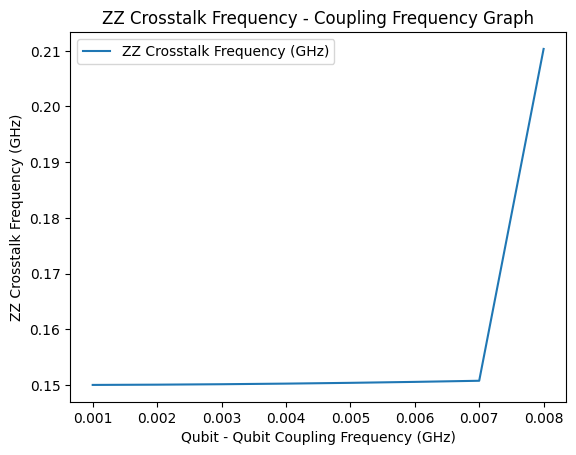

In [10]:
plt.plot(coupling_list, zz_frequency_list, label="ZZ Crosstalk Frequency (GHz)")
plt.legend()
plt.xlabel("Qubit - Qubit Coupling Frequency (GHz)")
plt.ylabel("ZZ Crosstalk Frequency (GHz)")
plt.title("ZZ Crosstalk Frequency - Coupling Frequency Graph")

Text(0.5, 1.0, 'ZZ Crosstalk Frequency - Coupling Frequency Graph')

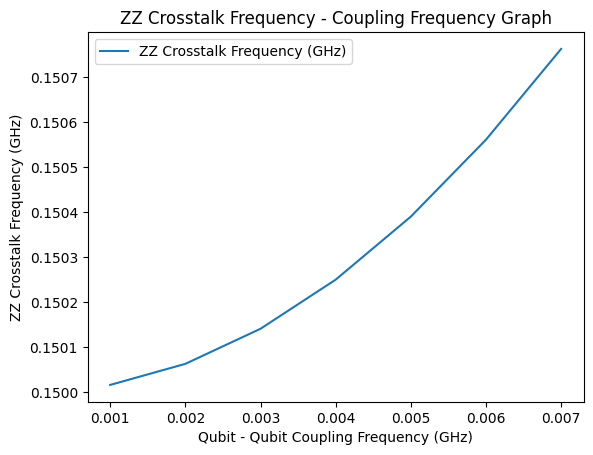

In [11]:
plt.plot(coupling_list[0:7], zz_frequency_list[0:7], label="ZZ Crosstalk Frequency (GHz)")
plt.legend()
plt.xlabel("Qubit - Qubit Coupling Frequency (GHz)")
plt.ylabel("ZZ Crosstalk Frequency (GHz)")
plt.title("ZZ Crosstalk Frequency - Coupling Frequency Graph")

Text(0.5, 1.0, 'VQE, VQNHE Lowest Energy')

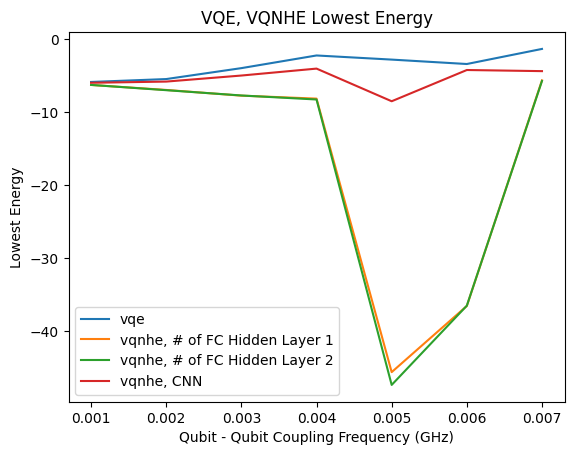

In [12]:
coupling_list = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007]

vqe = [-5.861800, -5.464999, -3.9696, -2.2368, -2.801600, -3.405799, -1.340600]
vqnheFC1 = [-6.270086, -6.954878, -7.737409, -8.142782, -45.575236, -36.519224, -5.643440]
vqnheFC2 = [-6.267638, -6.988122, -7.712117, -8.262173, -47.326527, -36.480296, -5.727654]
vqnheCNN = [-5.975756, -5.810715, -4.983099, -4.034481, -8.502322, -4.227436, -4.380522]

plt.plot(coupling_list, vqe, label="vqe")
plt.plot(coupling_list, vqnheFC1, label="vqnhe, # of FC Hidden Layer 1")
plt.plot(coupling_list, vqnheFC2, label="vqnhe, # of FC Hidden Layer 2")
plt.plot(coupling_list, vqnheCNN, label="vqnhe, CNN")
plt.legend()
plt.xlabel("Qubit - Qubit Coupling Frequency (GHz)")
plt.ylabel("Lowest Energy")
plt.title("VQE, VQNHE Lowest Energy")

Text(0.5, 1.0, 'VQE, VQNHE Lowest Energy')

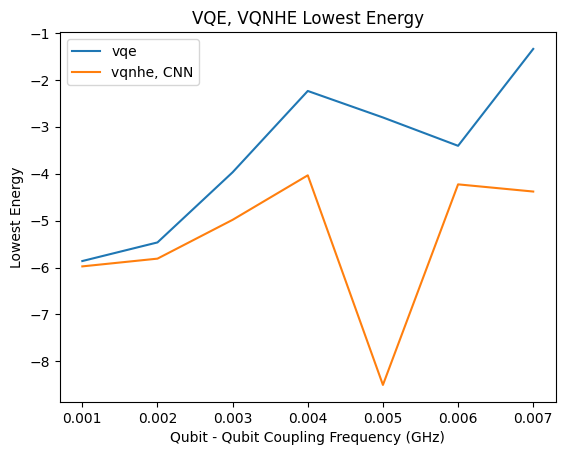

In [14]:
plt.plot(coupling_list, vqe, label="vqe")
plt.plot(coupling_list, vqnheCNN, label="vqnhe, CNN")
plt.legend()
plt.xlabel("Qubit - Qubit Coupling Frequency (GHz)")
plt.ylabel("Lowest Energy")
plt.title("VQE, VQNHE Lowest Energy")